# Query

## Load queried_pmids.csv 

In [1]:
import csv

pmids = []
temset = set()
with open("data/merge.csv", newline="", encoding="utf-8") as f:
    reader = csv.reader(f)
    for row in reader:
        temset.add(row[0])   # first column

pmids = list(temset)    # ['12345', '67890', ...]

FileNotFoundError: [Errno 2] No such file or directory: 'data/merge.csv'

In [2]:
print(len(pmids))

3812


## Fetch data from each queried pmid to get related entities and relations

In [ ]:
import requests
import json, pprint
def minePmids(pmids):
    originalentities = dict()
    originalrelations = dict()
    counter = 0
    for pmid in pmids:
        counter += 1
        if counter%100 == 0:
            print(f"Fetching data for PMID: {pmid} - {counter}-th")
        url = f"https://www.ncbi.nlm.nih.gov/research/pubtator-api/publications/export/biocjson?pmids={pmid}"
        

        response = requests.get(url)
        
        if response.status_code == 200:
            datajson = response.json()
            for passage in datajson['PubTator3'][0]['passages']: # each passage is a part of the document, can be title, abstract, introduction...
                # print("Section:", passage['infons'].get('section', 'N/A')) 
                # print("Text:", passage['text']) 
                # print("\nEntities:") 
                for entity in passage.get('annotations', []): # each passage has it own annotations, each annotation is about one entity
                    id = entity['infons']['normalized_id']
                    if id == None:
                        continue
                    id = str(id)
                    if id not in originalentities:
                        originalentities[id] = dict()
                        originalentities[id]['id'] = id
                        originalentities[id]['name'] = entity['infons']['name']
                        originalentities[id]['type'] = entity['infons']['biotype']
                        originalentities[id]['pmids'] = set()
                        originalentities[id]['pmids'].add(pmid)
                        originalentities[id]['accession'] = entity['infons'].get('accession', 'unknown')
                        originalentities[id]['subtype'] = entity['infons'].get('subtype', 'unknown')
                        originalentities[id]['gene_ids'] = entity['infons'].get('gene_ids', 'unknown')
                        # print(id, originalentities[id])
                    else:
                        # print(f"Append {pmid} to set {originalentities[id]['pmids']}")
                        originalentities[id]['pmids'].add(pmid)

                    

            # print("\nRelations:")
            for rel in datajson['PubTator3'][0]['relations']:
                thisrel = dict()
                thisrel['type'] = rel['infons'].get('type', 'unknown')
                thisrel['r1'] = rel['infons']['role1']['normalized_id']
                thisrel['r2'] = rel['infons']['role2']['normalized_id']
                thisrel['r1accession'] = rel['infons']['role1'].get('accession', 'unknown')
                thisrel['r2accession'] = rel['infons']['role2'].get('accession', 'unknown') 
                thisrel['score'] = rel['infons'].get('score', 'unknown')
                thisrel['pmids'] = pmid
                triplet = (thisrel['r1accession'], thisrel['type'], thisrel['r2accession'])
                if triplet not in originalrelations:
                    originalrelations[triplet] = dict()
                    originalrelations[triplet]['r1'] = thisrel['r1']
                    originalrelations[triplet]['r2'] = thisrel['r2']
                    originalrelations[triplet]['r1accession'] = thisrel['r1accession']
                    originalrelations[triplet]['r2accession'] = thisrel['r2accession']
                    originalrelations[triplet]['pmids'] = set()
                    originalrelations[triplet]['pmids'].add(pmid)
                    originalrelations[triplet]['score'] = []
                    originalrelations[triplet]['score'].append(thisrel['score'])
                    # print(triplet, originalrelations[triplet])
                else:
                    # print(f"Append {pmid} to set {originalrelations[triplet]['pmids']}")
                    originalrelations[triplet]['pmids'].add(pmid)
                    originalrelations[triplet]['score'].append(thisrel['score'])
                
            # print("\n" + "="*50)
        else:
            print("Failed to fetch data:", response.status_code)
    return originalentities, originalrelations

In [5]:
originalentities, originalrelations = minePmids(pmids)

Fetching data for PMID: 5673387 - 100-th
Fetching data for PMID: 30343446 - 200-th
Fetching data for PMID: 20415179 - 300-th
Fetching data for PMID: 38081746 - 400-th
Fetching data for PMID: 29477303 - 500-th
Fetching data for PMID: 34747465 - 600-th
Fetching data for PMID: 21768245 - 700-th
Fetching data for PMID: 26891725 - 800-th
Fetching data for PMID: 477996 - 900-th
Failed to fetch data: 400
Fetching data for PMID: 22147108 - 1000-th
Fetching data for PMID: 27343068 - 1100-th
Fetching data for PMID: 31963255 - 1200-th
Failed to fetch data: 400
Fetching data for PMID: 30479543 - 1300-th
Fetching data for PMID: 30229904 - 1400-th
Fetching data for PMID: 18979105 - 1500-th
Fetching data for PMID: 40576052 - 1600-th
Fetching data for PMID: 39661194 - 1700-th
Failed to fetch data: 400
Fetching data for PMID: 29941288 - 1800-th
Fetching data for PMID: 3810644 - 1900-th
Fetching data for PMID: 40406818 - 2000-th
Fetching data for PMID: 27540572 - 2100-th
Failed to fetch data: 400
Fetchi

In [230]:
print(len(originalentities))
print(len(originalrelations))

4435
4931


In [231]:
entitylist = []
for id, entity in originalentities.items():
    entity['id'] = str(id)
    entitylist.append(entity)

In [232]:
relationlist = []
for triple, relation in originalrelations.items():
    relation['id'] = triple
    relation['type'] = triple[1]
    relationlist.append(relation) 

In [233]:
with open("original3seedentities.csv", "w", newline="", encoding="utf-8") as f:
    writer = csv.DictWriter(f, fieldnames=entitylist[0].keys())
    writer.writeheader()
    writer.writerows(entitylist)

In [234]:
with open("original3seedrelations.csv", "w", newline="", encoding="utf-8") as f:
    writer = csv.DictWriter(f, fieldnames=relationlist[0].keys())
    writer.writeheader()
    writer.writerows(relationlist)

In [235]:
print(len(relationlist))

4931


In [236]:
print(len(entitylist))

4435


## Visualize the original network 

### Define functions 

In [162]:
import ast 
import re

def prepareForVisualization(entitydict, relationlist):
    refinedrelations = dict()
    unique_relationtypes = set()
    unique_entitytypes = set()

    genesWithVariants = set()

    for rel in relationlist:
        print(rel) 
        r1 = (rel['r1'])
        r2 = (rel['r2'])
        rtype = rel['type']

        unique_relationtypes.add(rtype)
        if not r1 or not r2:
            continue

        
        r1main, r1gene, r1type = None, None, None
        try: 
            r1main = entitydict[str(r1)]['accession']
            r1type = entitydict[str(r1)]['type']
        except:
            print("Cannot find {} in list entities".format(r1))

        if not r1main or not r1type:
            continue

        if '#' in str(r1): # case of variant 
            try:
                r1geneid = str(entitydict[r1]['gene_ids'][0])
                r1gene = entitydict[r1geneid]['accession']
                r1genetype = entitydict[r1geneid]['type']
                unique_entitytypes.add(r1genetype)
                print("Found gene {} associated with variant {}".format(r1geneid, r1main))
            except:
                print("Cannot find gene {} associated with variant {} in list entities".format(r1geneid, r1main))

        r2main, r2gene, r2type = None, None, None 
        try:
            r2main = entitydict[str(r2)]['accession']
            r2type = entitydict[str(r2)]['type']
        except:
            print("Cannot find {} in list entities".format(r2))
        
        if not r2main or not r2type:
            continue
        
        if "#" in str(r2): # in case of variant  
            try: 
                r2geneid = str(entitydict[r2]['gene_ids'][0])
                r2gene = entitydict[r2geneid]['accession']
                r2genetype = entitydict[r2geneid]['type']
                unique_entitytypes.add(r2genetype)
                print("Found gene {} associated with variant {}".format(r2geneid, r2main))
            except:
                print("Cannot find gene {} associated with variant {} in list entities".format(r2geneid, r2main))

        unique_entitytypes.add(r1type)
        unique_entitytypes.add(r2type)
        
        triplet = (r1main, rtype, r2main)

        scores = rel['score']
        scores = [float(x) for x in scores if float(x) <= 1.0]
        ascore = sum(scores)/len(scores)
        # scorecount  = len(scores)

        if triplet not in refinedrelations:
            # print(triplet)
            refinedrelations[triplet] = {
                'score': ascore,
                'pmids': rel['pmids'], # originally a set 
                'r1type': r1type,
                'r2type': r2type
            }
        else:
            refinedrelations[triplet]['pmids'] = refinedrelations[triplet]['pmids'].union(rel['pmids'])
            print("Append {} to set {}".format(rel['pmids'], refinedrelations[triplet]['pmids']))
            # refinedrelations[triplet]['score'] = (refinedrelations[triplet]['score'] + ascore)/2  # average score

        
        if r1gene:
            genesWithVariants.add(r1gene)
            r1genetriplet = (r1gene, rtype, r2main)
            if r1genetriplet not in refinedrelations:
                refinedrelations[r1genetriplet] = {
                    'score': ascore,
                    'pmids': rel['pmids'], # originally a set 
                    'r1type': r1genetype,
                    'r2type': r2type
                }
            else:
                refinedrelations[r1genetriplet]['pmids'] = refinedrelations[r1genetriplet]['pmids'].union(rel['pmids'])
                print("Append {} to set {}".format(rel['pmids'], refinedrelations[r1genetriplet]['pmids']))
                # refinedrelations[r1genetriplet]['score'] = (refinedrelations[r1genetriplet]['score'] + ascore)/2  # average score

        if r2gene:
            genesWithVariants.add(r2gene)
            r2genetriple = (r1main, rtype, r2gene)
            if r2genetriple not in refinedrelations:
                refinedrelations[r2genetriple] = {
                    'score': ascore,
                    'pmids': rel['pmids'], # originally a set 
                    'r1type': r1type,
                    'r2type': r2genetype
                }
            else: 
                refinedrelations[r2genetriple]['pmids'] = refinedrelations[r2genetriple]['pmids'].union(rel['pmids'])
                print("Append {} to set {}".format(rel['pmids'], refinedrelations[r2genetriple]['pmids']))
                # refinedrelations[r2genetriple]['score'] = (refinedrelations[r2genetriple]['score'] + ascore)/2  # average score



    for pairid, pairinfo in refinedrelations.items():
        print(pairid)
        print(pairinfo['score'])
        print(pairinfo['pmids'])
        print(pairinfo['r1type'], pairinfo['r2type'])
        print("="*50)
        
    print(unique_relationtypes)
    print(unique_entitytypes)

    return refinedrelations, unique_entitytypes, unique_relationtypes, genesWithVariants

In [163]:
from pyvis.network import Network
import statistics
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import networkx as nx

def construct_relation_graph_with_legend(relation_dict, entity_types, relation_types, threshold, genesWithVariants = None):
    G = nx.Graph()

    # Generate color maps
    cmap_entities = cm.get_cmap('tab20b', len(entity_types))
    cmap_relations = cm.get_cmap('Dark2', len(relation_types))

    entity_color_map = {etype: mcolors.to_hex(cmap_entities(i)) for i, etype in enumerate(sorted(entity_types))}
    relation_color_map = {rtype: mcolors.to_hex(cmap_relations(i)) for i, rtype in enumerate(sorted(relation_types))} 
    # print("Entity color map:", entity_color_map)
    # print("Relation color map:", relation_color_map)
    multitype_edge_color = mcolors.to_rgba(relation_color_map.get("Multitype", "#000000"))
    r, g, b = [int(c * 255) for c in multitype_edge_color[:3]]
    multitype_edge_color_str = f"rgba({r},{g},{b})"


    G.add_node('@DISEASE_Alkaptonuria', label='@DISEASE_Alkaptonuria', size=30, color=entity_color_map.get("Disease", "##ff0000"))
    for (e1, rel_type, e2), data in relation_dict.items():
        if rel_type == "Comparison":
            continue
        if not e1 or not e2:
            continue
        if e1 == '@GENE_HGD' and e2 == '@DISEASE_Alkaptonuria':
            print(data)
        conf_score = data.get("score", 0.0)
        pmids = list(set(data.get("pmids", [])))
        strlist_pmids = [str(pmid) for pmid in pmids]
        str_pmids = set(strlist_pmids)
        if not str_pmids:
            continue
        

        type1 = data.get("r1type", "Unknown")
        type2 = data.get("r2type", "Unknown")

        edge_color_rgb = mcolors.to_rgba(relation_color_map.get(rel_type, "#000000"))
        r, g, b = [int(c * 255) for c in edge_color_rgb[:3]]
        rgb_str = f"rgba({r},{g},{b})"
        
        # if e1 == '@GENE_HGD' and e2 == '@DISEASE_Alkaptonuria':
        #     print(str_pmids)

        if conf_score > threshold or (len(pmids) >= 3 and conf_score > 0.5):
            if G.has_edge(e1, e2):
                existing_pmids = set(G[e1][e2].get('pmidlist', []))
                for pimd in str_pmids:
                    existing_pmids.add(pimd)
                # new_pmids = existing_pmids.union(set(pmids))
                G[e1][e2]['pmidlist'] = list(existing_pmids)
                G[e1][e2]['pmid_count'] = len(existing_pmids)
                existing_score = G[e1][e2].get('score', 0.0)
                G[e1][e2]['score'] = (existing_score + conf_score) / 2  # average score
                G[e1][e2]['relation'] = G[e1][e2]['relation'] + f"; {rel_type}"
                G[e1][e2]['color'] = multitype_edge_color_str  # update color to the latest relation's color
            else:
                if e1 in genesWithVariants:
                    G.add_node(e1, label=e1, size=15, type=type1, color=entity_color_map.get(type1, "#999999"))
                else:
                    G.add_node(e1, label=e1, color=entity_color_map.get(type1, "#999999"), type=type1)
                    
                if e2 in genesWithVariants:
                    G.add_node(e2, label=e2, size=15, type=type2, color=entity_color_map.get(type2, "#999999"))
                else:
                    G.add_node(e2, label=e2, color=entity_color_map.get(type2, "#999999"), type=type2)
                
                weight = 1 - 2**(-(len(pmids))) 
                G.add_edge(e1, e2, relation=rel_type, color=rgb_str, score = weight, confident = conf_score, pmid_count=len(str_pmids), pmidlist=list(str_pmids))
            
    return G, entity_color_map, relation_color_map


In [ ]:
import networkx as nx

def subgraph_with_node(G, target="@DISEASE_Alkaptonuria", attr=None):
    """
    Return the connected component subgraph that contains `target`.

    Parameters
    ----------
    G : nx.Graph / nx.DiGraph / nx.Multi(Graph|DiGraph)
    target : str
        The node to search for (case-insensitive if comparing strings).
    attr : str or None
        If None, match against the node itself (e.g., node is a string).
        If set (e.g., 'name' or 'label'), match against G.nodes[n][attr].

    Returns
    -------
    H : same type as G
        Subgraph containing only the component with `target`.

    Raises
    ------
    ValueError if no node matches `target`.
    """
    t = str(target).casefold()

    # Find the matching node id in G
    match_node = None
    if attr is None:
        for n in G.nodes:
            if str(n).casefold() == t:
                match_node = n
                break
    else:
        for n, d in G.nodes(data=True):
            if str(d.get(attr, "")).casefold() == t:
                match_node = n
                break

    if match_node is None:
        raise ValueError(f"No node matching {target!r} found (attr={attr!r}).")

    # Pick appropriate connectivity (treat directed as undirected view)
    if isinstance(G, (nx.DiGraph, nx.MultiDiGraph)):
        U = G.to_undirected(as_view=True)
        comp_nodes = nx.node_connected_component(U, match_node)
    else:
        comp_nodes = nx.node_connected_component(G, match_node)

    # Return an induced copy of that component
    return G.subgraph(comp_nodes).copy()


In [169]:
def save_html_graph(graph, entity_color_map, relation_color_map, output_html="original.html"):
    net = Network(height="1946px", width="100%", notebook=False)
    net.from_nx(graph)
    # Customize tooltips and edge styles
    for e in net.edges:
        rel = graph[e['from']][e['to']]['relation']
        weight = graph[e['from']][e['to']]['score']
        pmid_list = graph[e['from']][e['to']]['pmidlist']
        e['title'] = f"{rel} \n weight: {weight:.2f} \n PMIDs: {pmid_list}"
        e['color'] = graph[e['from']][e['to']]['color']

    for n in net.nodes:
        node_data = graph.nodes[n['id']]
        n['color'] = node_data.get('color', '#999')
        n['title'] = f"Type: {node_data.get('type', 'Unknown')}"

    net.set_options("""
    var options = {
      "nodes": {
        "font": { "size": 20 },
        "scaling": { "min": 10, "max": 30 }
      },
      "edges": {
        "smooth": true
      },
      "physics": {
            "enabled": true,
            "stabilization": {
            "enabled": true,
            "iterations": 500,
            "fit": true
            }
        }
    }
    """)
    net.write_html(output_html)

    # Inject a legend block manually
    with open(output_html, "r", encoding="utf-8") as f:
        html = f.read()

    # Build legend HTML
    def dot(color):
        return f'<span style="display:inline-block;width:12px;height:12px;border-radius:6px;background:{color};margin-right:6px;"></span>'

    legend_html = "<div style='position:absolute;top:10px;right:10px;background:white;padding:10px;border:1px solid #ccc;border-radius:5px;font-family:sans-serif;font-size:14px;'>"
    legend_html += "<b>Legend</b><br><br><u>Entity Types:</u><br>"
    for etype, color in entity_color_map.items():
        legend_html += f"{dot(color)} {etype}<br>"

    legend_html += "<br><u>Relation Types:</u><br>"
    for rtype, color in relation_color_map.items():
        legend_html += f"{dot(color)} {rtype}<br>"

    legend_html += "</div>"

    # Inject just before closing </body> tag
    html = html.replace("</body>", legend_html + "\n</body>")

    # Save modified file
    with open(output_html, "w", encoding="utf-8") as f:
        f.write(html)

    print(f"Graph with legend saved to {output_html}")

### Visualize

In [237]:
refinedrelations, unique_entitytypes, unique_relationtypes, genesWithVariants = prepareForVisualization(originalentities, relationlist)

{'r1': 'D014443', 'r2': 7299, 'r1accession': '@CHEMICAL_Tyrosine', 'r2accession': '@GENE_TYR', 'pmids': {'27142149'}, 'score': ['0.6468'], 'id': ('@CHEMICAL_Tyrosine', 'Association', '@GENE_TYR'), 'type': 'Association'}
{'r1': 'D000474', 'r2': 7299, 'r1accession': '@DISEASE_Alkaptonuria', 'r2accession': '@GENE_TYR', 'pmids': {'27142149'}, 'score': ['0.9996'], 'id': ('@DISEASE_Alkaptonuria', 'Association', '@GENE_TYR'), 'type': 'Association'}
{'r1': 'D006713', 'r2': 'D000474', 'r1accession': '@CHEMICAL_Homogentisic_Acid', 'r2accession': '@DISEASE_Alkaptonuria', 'pmids': {'32502471', '27142149', '35415103', '38405194', '37268334', '31989660', '27169295', '21744089', '29353057', '39801864', '12359141', '20154043', '18949907', '30406834', '30316064', '40938761', '36295892', '20062791', '32158253', '22482092', '24618234', '11349468', '32284865', '20665660', '36880186', '36045846', '31650933', '26229881', '20694448', '34194920', '24466168', '20301627', '40092270', '25860819', '1401313', '263

In [238]:
print(genesWithVariants)

{'@GENE_UHMK1', '@GENE_GPJ55_RS05515', '@GENE_CRYGD', '@GENE_HGD', '@GENE_PIK3CA', '@GENE_TNFSF15', '@GENE_SNCA', '@GENE_IL1B', '@GENE_BRAF', '@GENE_TNF', '@GENE_DCXR', '@GENE_GAA', '@GENE_MC2R', '@GENE_SLCO1B1', '@GENE_HPD', '@GENE_TP53', '@GENE_ELF1', '@GENE_APC', '@GENE_IMP3', '@GENE_KRAS'}


In [241]:
unique_relationtypes.add("Multitype")

In [287]:
originalGraph, entity_color, relation_color = construct_relation_graph_with_legend(refinedrelations, unique_entitytypes, unique_relationtypes, 0.7, genesWithVariants)
print(originalGraph)

{'score': 0.9641, 'pmids': {'25804398', '9529363', '35550814', '39737503', '34504318', '24575791', '10482952', '12051967'}, 'r1type': 'gene', 'r2type': 'disease'}
{'score': 0.6086, 'pmids': {'18945288', '35110678', '9674916', '34686677', '10205262', '9529363', '23353776', '33621656', '25153563', '34235214', '21437689'}, 'r1type': 'gene', 'r2type': 'disease'}
Graph with 1989 nodes and 4131 edges


/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/4036091865.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_entities = cm.get_cmap('tab20b', len(entity_types))
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/4036091865.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_relations = cm.get_cmap('Dark2', len(relation_types))


In [360]:
save_html_graph(originalGraph, entity_color, relation_color, "original3seed.html")

Graph with legend saved to original3seed.html


In [229]:
print(originalGraph)

Graph with 1989 nodes and 4131 edges


## Extend the search 1st level

In [63]:
# first get the entity related with alkaptonuria from the original relations to query further 
toquerylv1 = set()
def taken(data):
    try:
        scores = data['score']
    except:
        return False
    ascores = 0.0
    count = 0
    for score in scores:
        fscore = float(score)
        if fscore <= 1.0:
            count += 1
            ascores += fscore
    ascores = fscore/count
    if ascores > 0.7:
        return True
    else:
        return False

for rel, data in originalrelations.items():
    if rel[0] in ['@DISEASE_Alkaptonuria', '@GENE_HGD', '@CHEMICAL_Homogentisic_acid']:
        print(rel)
        if taken(data):
            # print(data)
            toquerylv1.add(rel[2])
        # now extract the information of the entity to query
        
    if rel[2] in ['@DISEASE_Alkaptonuria', '@GENE_HGD', '@CHEMICAL_Homogentisic_acid']:
        print(rel)
        if taken(data):
            # print(data)
            toquerylv1.add(rel[0])
    
print(len(toquerylv1))

('@DISEASE_Alkaptonuria', 'Association', '@GENE_TYR')
('@CHEMICAL_Homogentisic_Acid', 'Positive_Correlation', '@DISEASE_Alkaptonuria')
('@CHEMICAL_vanillin', 'Association', '@GENE_HGD')
('@CHEMICAL_Phenylalanine', 'Association', '@GENE_HGD')
('@CHEMICAL_Tyrosine', 'Association', '@GENE_HGD')
('@CHEMICAL_Tyrosine', 'Association', '@DISEASE_Alkaptonuria')
('@CHEMICAL_Ascorbic_Acid', 'Negative_Correlation', '@DISEASE_Alkaptonuria')
('@DISEASE_Alkaptonuria', 'Negative_Correlation', '@GENE_HGD')
('@DISEASE_Alkaptonuria', 'Negative_Correlation', '@GENE_HGD')
('@CHEMICAL_Homogentisic_Acid', 'Association', '@GENE_HGD')
('@CHEMICAL_nitisinone', 'Negative_Correlation', '@DISEASE_Alkaptonuria')
('@CHEMICAL_Homogentisic_Acid', 'Association', '@DISEASE_Alkaptonuria')
('@CHEMICAL_Phenylalanine', 'Association', '@DISEASE_Alkaptonuria')
('@DISEASE_Alkaptonuria', 'Association', '@GENE_HGD')
('@DISEASE_Alkaptonuria', 'Association', '@GENE_HGD')
('@CHEMICAL_Tyrosine', 'Negative_Correlation', '@DISEASE_Al

In [66]:
print(toquerylv1)

{'@CHEMICAL_Carbon_Dioxide', '@VARIANT_c.775_1915_879+1293del_HGD_human', '@VARIANT_c.551_552insG_HGD_human', '@CHEMICAL_Glycosaminoglycans', '@CHEMICAL_Cortisone', '@CHEMICAL_Polychlorinated_Dibenzodioxins', '@DISEASE_Skin_Diseases', '@DISEASE_Death', '@DISEASE_Disease', '@VARIANT_c.119A>C_HGD_human', '@CHEMICAL_Rutin', '@CHEMICAL_Dioxins', '@GENE_HLA_B', '@DISEASE_Infertility_Male', '@CHEMICAL_Levonorgestrel', '@VARIANT_c.158G>A_HGD_human', '@DISEASE_Fatty_Liver', '@GENE_CD8A', '@VARIANT_p.G251G_HGD_human', '@CHEMICAL_Zoledronic_Acid', '@CHEMICAL_Citric_Acid', '@CHEMICAL_Homovanillic_Acid', '@CHEMICAL_Hydroxylysine', '@CHEMICAL_Ethylnitrosourea', '@CHEMICAL_quinone', '@GENE_DKK1', '@CHEMICAL_Azo_Compounds', '@DISEASE_Spondylitis_Ankylosing', '@GENE_SOST', '@GENE_SMO', '@CHEMICAL_ferulic_acid', '@VARIANT_c.1_8460_282+6727del_HGD_human', '@VARIANT_c.407T>A_HGD_human', '@VARIANT_c.+31A>G_HGD_human', '@VARIANT_p.K57N_HGD_human', '@CHEMICAL_purine', '@CHEMICAL_Testosterone', '@CHEMICAL_Ph

In [67]:
exclude = {'@DISEASE_Skin_Diseases', '@DISEASE_Death', '@DISEASE_Disease', '@DISEASE_Liver_Diseases', '@DISEASE_Infertility_Male', '@DISEASE_Congenital_Hereditary_and_Neonatal_Diseases_and_Abnormalities', '@CHEMICAL_Lipids', '@DISEASE_Neoplasms', '@DISEASE_Bone_Diseases', 'unknown', '@DISEASE_Chemical_and_Drug_Induced_Liver_Injury'}
print(len(exclude))

11


In [198]:
print(exclude.intersection(toquerylv1))

{'@DISEASE_Neoplasms', '@DISEASE_Infertility_Male', '@DISEASE_Bone_Diseases', '@DISEASE_Skin_Diseases', '@DISEASE_Death', '@DISEASE_Disease'}


In [68]:
toquery = toquerylv1.difference(exclude)
print(len(toquery))
print(toquery)

153
{'@CHEMICAL_Carbon_Dioxide', '@VARIANT_c.775_1915_879+1293del_HGD_human', '@VARIANT_c.551_552insG_HGD_human', '@CHEMICAL_Glycosaminoglycans', '@CHEMICAL_Cortisone', '@CHEMICAL_Polychlorinated_Dibenzodioxins', '@VARIANT_c.119A>C_HGD_human', '@CHEMICAL_Rutin', '@CHEMICAL_Dioxins', '@GENE_HLA_B', '@CHEMICAL_Levonorgestrel', '@VARIANT_c.158G>A_HGD_human', '@DISEASE_Fatty_Liver', '@GENE_CD8A', '@VARIANT_p.G251G_HGD_human', '@CHEMICAL_Zoledronic_Acid', '@CHEMICAL_Citric_Acid', '@CHEMICAL_Homovanillic_Acid', '@CHEMICAL_Hydroxylysine', '@CHEMICAL_Ethylnitrosourea', '@CHEMICAL_quinone', '@GENE_DKK1', '@CHEMICAL_Azo_Compounds', '@DISEASE_Spondylitis_Ankylosing', '@GENE_SOST', '@GENE_SMO', '@CHEMICAL_ferulic_acid', '@VARIANT_c.1_8460_282+6727del_HGD_human', '@VARIANT_c.407T>A_HGD_human', '@VARIANT_c.+31A>G_HGD_human', '@VARIANT_p.K57N_HGD_human', '@CHEMICAL_purine', '@CHEMICAL_Testosterone', '@CHEMICAL_Phytic_Acid', '@CHEMICAL_4_hydroxybenzoic_acid', '@CHEMICAL_Uric_Acid', '@CHEMICAL_Orange_G

In [70]:
listquerylv1 = list(toquery)
print(len(listquerylv1))

153


### Query entities related with Alkaptonuria 

In [71]:
import requests 
import time
def queryRelatedPMIDs(queriedentities):
    setpmids = set()

    for count, ent in enumerate(queriedentities):
        print(f"Querying entity {count+1}/{len(queriedentities)}: {ent}")
        url = f"https://www.ncbi.nlm.nih.gov/research/pubtator3-api/search/?text={ent}"
        response = requests.get(url)
        if response.status_code == 200:
            totpage = response.json().get("total_pages", 1)
            print(f"\tTotal pages for {ent}: {totpage}")
            if totpage > 200:
                print(f"\tToo many pages: ({totpage}) for {ent}, limiting to first 50 pages.")
                totpage = 50  # limit to first 10 pages if too many 
        else:
            print("Encounter error {}  for {}".format(response.status_code, ent))
            continue

        page = 1
        while page < totpage: 
            if page > totpage:
                break
            print(f"\tQuerying related PMIDs for entity: {ent}, page {page} ")
            url = f"https://www.ncbi.nlm.nih.gov/research/pubtator3-api/search/?text={ent}&page={page}"
            response = requests.get(url)
            
            if response.status_code == 200:
                requesteddata = response.json() 
                # print(requesteddata)
                results = requesteddata['results'] # list of found pmids 

                for result in results:
                    # print(result)
                    setpmids.add(result['pmid'])
            else:
                print("Failed to fetch data:", response.status_code)
            page += 1
            time.sleep(0.3)  # to avoid overwhelming the server
    return setpmids

In [72]:
extendpmids = queryRelatedPMIDs(toquery)

Querying entity 1/153: @CHEMICAL_Carbon_Dioxide
	Total pages for @CHEMICAL_Carbon_Dioxide: 94660
	Too many pages: (94660) for @CHEMICAL_Carbon_Dioxide, limiting to first 50 pages.
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 1 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 2 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 3 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 4 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 5 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 6 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 7 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 8 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 9 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 10 
	Querying related PMIDs for entity: @CHEMICAL_Carbon_Dioxide, page 11 
	Querying related PMIDs for entity: @CHEMICAL_Ca

In [73]:
print(len(extendpmids))

53810


In [74]:
# save to CSV
with open("extendPMIDs.csv", "w", newline="") as f:
    writer = csv.writer(f)
    for item in extendpmids:
        writer.writerow([item])

In [86]:
extendpmidslist = list(extendpmids)
extendpmidsliststr = list(map(str, extendpmidslist))
print(len(extendpmidsliststr))

53810


### Define function to query type of PMIDs

In [125]:
from Bio import Entrez
def queryTypePMIDs(listpmids):
    # print(listpmids)
    Entrez.email = "tranhuong.giangpham@phd.unipi.it"  # NCBI requires an email
    setoftypes = set()
    mappmid2type = dict()
    # Fetch article metadata
    batchnum = int(len(listpmids)/200)
    print(f"Need to process {batchnum + 1} batches")
    for i in range(batchnum+1):
        chunk = listpmids[i*200:min((i+1)*200, len(listpmids)-1)]
        print(f"Chunk {i + 1} from {i*200} to {min((i+1)*200, len(listpmids))}")

        if not ",".join(chunk):
            continue

        handle = Entrez.efetch(db="pubmed", id=",".join(chunk), rettype="xml")
        records = Entrez.read(handle)
        

        # Extract article types
        for article in records["PubmedArticle"]:
            pmid = article["MedlineCitation"]["PMID"]
            listofthistypes = []
            types = article["MedlineCitation"]["Article"]["PublicationTypeList"]
            for t in types:
                listofthistypes.append(str(t))
                setoftypes.add(str(t)) 

            # print(pmid, listofthistypes)
            mappmid2type[str(pmid)] = listofthistypes

    return mappmid2type, setoftypes



In [129]:
mappmid2type, uniquePMIDtype = queryTypePMIDs(extendpmidsliststr)
print(uniquePMIDtype)

Need to process 270 batches
Chunk 1 from 0 to 200
Chunk 2 from 200 to 400
Chunk 3 from 400 to 600
Chunk 4 from 600 to 800
Chunk 5 from 800 to 1000
Chunk 6 from 1000 to 1200
Chunk 7 from 1200 to 1400
Chunk 8 from 1400 to 1600
Chunk 9 from 1600 to 1800
Chunk 10 from 1800 to 2000
Chunk 11 from 2000 to 2200
Chunk 12 from 2200 to 2400
Chunk 13 from 2400 to 2600
Chunk 14 from 2600 to 2800
Chunk 15 from 2800 to 3000
Chunk 16 from 3000 to 3200
Chunk 17 from 3200 to 3400
Chunk 18 from 3400 to 3600
Chunk 19 from 3600 to 3800
Chunk 20 from 3800 to 4000
Chunk 21 from 4000 to 4200
Chunk 22 from 4200 to 4400
Chunk 23 from 4400 to 4600
Chunk 24 from 4600 to 4800
Chunk 25 from 4800 to 5000
Chunk 26 from 5000 to 5200
Chunk 27 from 5200 to 5400
Chunk 28 from 5400 to 5600
Chunk 29 from 5600 to 5800
Chunk 30 from 5800 to 6000
Chunk 31 from 6000 to 6200
Chunk 32 from 6200 to 6400
Chunk 33 from 6400 to 6600
Chunk 34 from 6600 to 6800
Chunk 35 from 6800 to 7000
Chunk 36 from 7000 to 7200
Chunk 37 from 7200 t

In [288]:
print(len(mappmid2type))

53717


In [131]:
import csv
from collections.abc import Iterable

def _to_string_list(val):
    """Normalize values to a list[str]; handles BioPython StringElement, lists, sets, None, etc."""
    if val is None:
        return []
    if isinstance(val, (str, bytes)):
        return [str(val)]
    if isinstance(val, dict):
        return [str(val)]
    if isinstance(val, Iterable):
        out = []
        for x in val:
            if x is None:
                continue
            out.append(str(x))  # StringElement -> its text
        return out
    return [str(val)]

def _pmid_sort_key(k):
    s = str(k)
    try:
        return (0, int(s))
    except ValueError:
        return (1, s)

def save_pmid_types_to_csv(pmid_to_types, path="pmid_types.csv", delimiter=",", joiner="; "):
    """
    pmid_to_types: dict mapping pmid (str|int) -> iterable of types (StringElement|str|…)
    path: output file path
    delimiter: "," for CSV, "\t" for TSV
    joiner: how to join multiple types in one cell
    """
    # sort for reproducibility
    pmids = sorted(pmid_to_types.keys(), key=_pmid_sort_key)

    with open(path, "w", newline="", encoding="utf-8") as f:
        writer = csv.writer(f, delimiter=delimiter)
        writer.writerow(["pmid", "publication_types"])
        for pmid in pmids:
            types = _to_string_list(pmid_to_types[pmid])
            # de-duplicate while preserving order
            types = list(dict.fromkeys(types))
            writer.writerow([str(pmid), joiner.join(types)])

    return path


In [132]:
save_pmid_types_to_csv(mappmid2type, path="pmid_types.csv") 

'pmid_types.csv'

### Define function to filter PMID list 

In [284]:
import json
from collections.abc import Iterable

# ---- Normalizer (robust to messy inputs) ----
def _normalize_pubtypes(pt_list):
    """
    Accepts list/tuple/set of StringElement|str, a single StringElement|str,
    a JSON-ish string "['Review','Journal Article']", a delimited string "Review; Journal Article", or None.
    Returns set[str] (original case, trimmed).
    """
    if pt_list is None:
        return set()

    if isinstance(pt_list, (str, bytes)):
        s = pt_list.strip()
        # Try JSON first
        if s.startswith("[") and s.endswith("]"):
            try:
                parsed = json.loads(s.replace("'", '"'))
                if isinstance(parsed, Iterable) and not isinstance(parsed, (str, bytes)):
                    return {str(x).strip() for x in parsed if str(x).strip()}
            except Exception:
                pass
        # Fallback: split on common delimiters
        for delim in [";", ","]:
            if delim in s:
                return {t.strip() for t in s.split(delim) if t.strip()}
        return {s}

    if isinstance(pt_list, Iterable):
        out = set()
        for x in pt_list:
            if x is None:
                continue
            out.add(str(x).strip())
        return out

    return {str(pt_list).strip()}

# ---- Policy sets ----
EXCLUDE = {
  # secondary literature
  'Review','Systematic Review','Meta-Analysis','Network Meta-Analysis','Scoping Review','Bibliography',
  # front matter / opinion / newsy
  'Editorial','Comment','Letter','News','Interview','Address','Portrait','Biography','Personal Narrative','Historical Article',
  # guidance / consensus / meetings
  'Guideline','Practice Guideline','Consensus Development Conference','Congress',
  # corrections & integrity
  'Retracted Publication','Retraction Notice','Expression of Concern','Published Erratum','Correction',
  # not primary results
  'Clinical Trial Protocol','Patient Education Handout','Video-Audio Media','Dataset'
}

# specific primary designs we accept (strict)
STRICT_PRIMARY = {
  'Randomized Controlled Trial','Controlled Clinical Trial','Clinical Trial',
  'Clinical Trial, Phase I','Clinical Trial, Phase II','Clinical Trial, Phase III','Clinical Trial, Phase IV',
  'Pragmatic Clinical Trial','Equivalence Trial',
  'Observational Study','Cohort Studies','Case-Control Studies','Cross-Sectional Studies',
  'Comparative Study','Evaluation Study','Validation Study',
  'Multicenter Study','Twin Study'
}

# broader (optional) hint — can be disabled to be ultra strict
BROAD_PRIMARY_HINTS = STRICT_PRIMARY | {'Clinical Study'}

VETERINARY = {'Observational Study, Veterinary','Clinical Trial, Veterinary','Randomized Controlled Trial, Veterinary'}
IGNORE = {'English Abstract'}  # orthogonal
SUPPORT_PREFIX_LC = 'research support'  # ignore funding tags

EXCLUDE_LC        = {x.lower() for x in EXCLUDE}
STRICT_PRIMARY_LC = {x.lower() for x in STRICT_PRIMARY}
BROAD_HINTS_LC    = {x.lower() for x in BROAD_PRIMARY_HINTS}
VETERINARY_LC     = {x.lower() for x in VETERINARY}
IGNORE_LC         = {x.lower() for x in IGNORE}

def should_keep_strict(pt_list,
                       allow_clinical_study_tag=False,
                       include_veterinary=False,
                       allow_preprints=False,
                       allow_case_reports=False):
    """
    Hard filter for relation mining.
    Rules:
      - Drop if any EXCLUDE type present.
      - Drop Preprint (unless allow_preprints=True).
      - Drop Case Reports (unless allow_case_reports=True).
      - Drop Veterinary studies (unless include_veterinary=True).
      - Require at least ONE specific primary design (STRICT_PRIMARY).
        * If allow_clinical_study_tag=True, 'Clinical Study' also satisfies the requirement.
      - 'Journal Article' alone is NOT sufficient.
      - Ignore 'Research Support, ...' and 'English Abstract'.
    Returns: (keep_bool, reason)
    """
    pts = _normalize_pubtypes(pt_list)
    pts_lc = {p.lower() for p in pts}

    # strip orthogonal/funding tags
    pts_lc = {p for p in pts_lc if not p.startswith(SUPPORT_PREFIX_LC)} - IGNORE_LC

    if 'preprint' in pts_lc and not allow_preprints:
        return False, 'preprint'

    if not include_veterinary and (pts_lc & VETERINARY_LC):
        return False, 'veterinary study'

    if not allow_case_reports and 'case reports' in pts_lc:
        return False, 'case report'

    if pts_lc & EXCLUDE_LC:
        return False, f"excluded types: {sorted(pts_lc & EXCLUDE_LC)}"

    # Require strict primary design
    primary_pool = BROAD_HINTS_LC if allow_clinical_study_tag else STRICT_PRIMARY_LC
    if not (pts_lc & primary_pool):
        return False, 'no specific primary design'  # e.g., only 'Journal Article' (+ funding)

    return True, 'strict primary design found'


from collections import Counter

def filter_pmids_strict(pmid_to_types,
                        allow_clinical_study_tag=False,
                        include_veterinary=False,
                        allow_preprints=False,
                        allow_case_reports=True):
    kept = []
    reasons = Counter()
    for pmid, pt_list in pmid_to_types.items():
        keep, reason = should_keep_strict(
            pt_list,
            allow_clinical_study_tag=allow_clinical_study_tag,
            include_veterinary=include_veterinary,
            allow_preprints=allow_preprints,
            allow_case_reports=allow_case_reports
        )
        if keep:
            kept.append(str(pmid))
        else:
            reasons[reason] += 1
    return kept, reasons


In [148]:
kept, reason = filter_pmids_strict(mappmid2type)

In [285]:
print(len(kept))
print(kept)

1636
['21364760', '31326319', '33030266', '33030273', '33947785', '31850802', '30278058', '17433010', '32506371', '31195673', '33424089', '31851381', '32900002', '34997156', '34997178', '34341833', '38274235', '33948911', '34080044', '38536550', '39978415', '34473411', '40633803', '39323188', '33687145', '40765224', '35784552', '34735976', '33687578', '31983653', '33556646', '23201985', '38013160', '37751127', '37227016', '35392026', '35916411', '34212529', '15731461', '28183330', '34868064', '39324569', '32639958', '40111290', '39980305', '35654932', '32771390', '37490036', '20712855', '39980441', '34344399', '34606551', '36310531', '38538760', '28053021', '33033903', '32640730', '36703970', '34344703', '36966274', '40374167', '40898468', '34082789', '34082801', '40505336', '32772255', '16257199', '39981254', '35655922', '33558891', '33296798', '31986169', '32641540', '40112787', '38408971', '34476902', '33821793', '38671475', '33428638', '36574387', '40375481', '34215201', '33690913'

In [151]:
print(reason) 

Counter({'no specific primary design': 41742, "excluded types: ['review']": 7495, "excluded types: ['letter']": 357, "excluded types: ['systematic review']": 329, "excluded types: ['editorial']": 316, 'preprint': 286, "excluded types: ['meta-analysis', 'systematic review']": 254, "excluded types: ['comment']": 196, "excluded types: ['comment', 'letter']": 169, "excluded types: ['published erratum']": 161, "excluded types: ['comment', 'editorial']": 130, "excluded types: ['meta-analysis']": 108, "excluded types: ['retracted publication']": 100, "excluded types: ['video-audio media']": 71, 'veterinary study': 54, "excluded types: ['scoping review']": 44, "excluded types: ['news']": 40, "excluded types: ['meta-analysis', 'review']": 33, "excluded types: ['retraction notice']": 29, "excluded types: ['clinical trial protocol']": 21, "excluded types: ['practice guideline']": 17, "excluded types: ['historical article']": 17, "excluded types: ['network meta-analysis', 'systematic review']": 17

In [154]:
globalentities, globalconnections = minePmids(kept)

Fetching data for PMID: 33299302 - 100-th
Fetching data for PMID: 39861353 - 200-th
Fetching data for PMID: 33840509 - 300-th
Fetching data for PMID: 34240816 - 400-th
Fetching data for PMID: 34510420 - 500-th
Fetching data for PMID: 33602374 - 600-th
Fetching data for PMID: 33217147 - 700-th
Fetching data for PMID: 33879742 - 800-th
Fetching data for PMID: 32183719 - 900-th
Failed to fetch data: 400
Failed to fetch data: 400
Fetching data for PMID: 33896191 - 1000-th
Failed to fetch data: 400
Fetching data for PMID: 32856309 - 1100-th
Failed to fetch data: 400
Fetching data for PMID: 34044221 - 1200-th
Fetching data for PMID: 32740409 - 1300-th
Fetching data for PMID: 36157874 - 1400-th
Fetching data for PMID: 30267362 - 1500-th
Fetching data for PMID: 19134049 - 1600-th


In [155]:
print(len(globalentities))
print(len(globalconnections))

3591
4032


In [156]:
globalentitylist = []
for id, entity in globalentities.items():
    entity['id'] = str(id)
    globalentitylist.append(entity)

In [157]:
with open("1lvlentities.csv", "w", newline="", encoding="utf-8") as f:
    writer = csv.DictWriter(f, fieldnames=entitylist[0].keys())
    writer.writeheader()
    writer.writerows(globalentitylist)

In [158]:
globalrelationlist = []
for triple, relation in globalconnections.items():
    relation['id'] = triple
    relation['type'] = triple[1]
    globalrelationlist.append(relation) 
print(len(globalrelationlist))

4032


In [159]:
mergedentites = originalentities | globalentities
print(len(mergedentites))

6608


In [160]:
mergedrelationlist = relationlist + globalrelationlist
print(len(mergedrelationlist))

8963


## Now visualize the first level of extended network merged with original network

In [164]:
refineglorelation, glo_entitytype, glo_relationtype, glogenevariants = prepareForVisualization(mergedentites, mergedrelationlist)

{'r1': 'D014443', 'r2': 7299, 'r1accession': '@CHEMICAL_Tyrosine', 'r2accession': '@GENE_TYR', 'pmids': {'27142149'}, 'score': ['0.6468'], 'id': ('@CHEMICAL_Tyrosine', 'Association', '@GENE_TYR'), 'type': 'Association'}
{'r1': 'D000474', 'r2': 7299, 'r1accession': '@DISEASE_Alkaptonuria', 'r2accession': '@GENE_TYR', 'pmids': {'27142149'}, 'score': ['0.9996'], 'id': ('@DISEASE_Alkaptonuria', 'Association', '@GENE_TYR'), 'type': 'Association'}
{'r1': 'D006713', 'r2': 'D000474', 'r1accession': '@CHEMICAL_Homogentisic_Acid', 'r2accession': '@DISEASE_Alkaptonuria', 'pmids': {'32502471', '27142149', '35415103', '38405194', '37268334', '31989660', '27169295', '21744089', '29353057', '39801864', '12359141', '20154043', '18949907', '30406834', '30316064', '40938761', '36295892', '20062791', '32158253', '22482092', '24618234', '11349468', '32284865', '20665660', '36880186', '36045846', '31650933', '26229881', '20694448', '34194920', '24466168', '20301627', '40092270', '25860819', '1401313', '263

In [165]:
print(glo_entitytype)
if None in glo_entitytype:
    glo_entitytype.remove(None)
print(glo_entitytype)

{'variant', 'disease', 'gene', 'chemical'}
{'variant', 'disease', 'gene', 'chemical'}


In [166]:
glo_relationtype.add("Multitype")
glo_relationtype.remove("Comparison")  # remove Variant type for better visualization
print(glo_relationtype)

{'Cotreatment', 'Association', 'Multitype', 'Bind', 'Positive_Correlation', 'Negative_Correlation', 'Drug_Interaction'}


In [167]:
lv1exgraph, lv1entity_color, lv1_relcolor = construct_relation_graph_with_legend(refineglorelation, glo_entitytype, glo_relationtype, 0.7, glogenevariants)
print(lv1exgraph)

{'score': 0.9641, 'pmids': {'25804398', '9529363', '35550814', '39737503', '34504318', '24575791', '10482952', '12051967'}, 'r1type': 'gene', 'r2type': 'disease'}
{'score': 0.6086, 'pmids': {'18945288', '35110678', '9674916', '34686677', '10205262', '9529363', '23353776', '33621656', '25153563', '34235214', '21437689'}, 'r1type': 'gene', 'r2type': 'disease'}
Graph with 3259 nodes and 7365 edges


/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/4036091865.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_entities = cm.get_cmap('tab20b', len(entity_types))
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/4036091865.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_relations = cm.get_cmap('Dark2', len(relation_types))


In [174]:
AlExGraph = subgraph_with_node(lv1exgraph, "@DISEASE_Alkaptonuria")

In [175]:
save_html_graph(AlExGraph, lv1entity_color, lv1_relcolor, "extendexgraph.html")

Graph with legend saved to extendexgraph.html


In [177]:
print(lv1exgraph)
print(AlExGraph)

Graph with 3259 nodes and 7365 edges
Graph with 3147 nodes and 7282 edges


## Create high-confident network

In [178]:
import csv
from pathlib import Path
import networkx as nx

def save_disease_and_chemical_nodes(
    G: nx.Graph,
    diseases_path: str = "diseases.csv",
    chemicals_path: str = "chemicals.csv",
    label_attr: str | None = None,
    include_entity_name: bool = True
):
    """
    Save nodes to CSVs based on label prefix. 
    - '@DISEASE' -> diseases_path
    - '@CHEMICAL' -> chemicals_path

    Parameters
    ----------
    G : networkx graph
    diseases_path, chemicals_path : output CSV paths
    label_attr : if None, use the node id as the label; otherwise use G.nodes[n][label_attr]
    include_entity_name : if True, add a column with the part after the first '_' (e.g., 'Alkaptonuria')
    """
    def get_label(n, data):
        if label_attr is None:
            return str(n)
        return str(data.get(label_attr, n))

    def entity_name(label: str) -> str:
        # Extract text after the first underscore, if present (e.g., "@DISEASE_Alkaptonuria" -> "Alkaptonuria")
        if "_" in label:
            return label.split("_", 1)[1]
        return ""

    disease_rows = []
    chemical_rows = []

    for n, d in G.nodes(data=True):
        label = get_label(n, d)
        if label.startswith("@DISEASE"):
            row = [str(n), label]
            if include_entity_name:
                row.append(entity_name(label))
            disease_rows.append(row)
        elif label.startswith("@CHEMICAL"):
            row = [str(n), label]
            if include_entity_name:
                row.append(entity_name(label))
            chemical_rows.append(row)

    # Sort for reproducibility
    disease_rows.sort(key=lambda r: r[1].lower())
    chemical_rows.sort(key=lambda r: r[1].lower())

    # Ensure parent folders exist
    Path(diseases_path).parent.mkdir(parents=True, exist_ok=True)
    Path(chemicals_path).parent.mkdir(parents=True, exist_ok=True)

    headers = ["node_id", "label"] + (["entity_name"] if include_entity_name else [])

    with open(diseases_path, "w", newline="", encoding="utf-8") as f:
        w = csv.writer(f)
        w.writerow(headers)
        w.writerows(disease_rows)

    with open(chemicals_path, "w", newline="", encoding="utf-8") as f:
        w = csv.writer(f)
        w.writerow(headers)
        w.writerows(chemical_rows)

    print(f"Saved {len(disease_rows)} disease nodes to {diseases_path}")
    print(f"Saved {len(chemical_rows)} chemical nodes to {chemicals_path}")


In [179]:
save_disease_and_chemical_nodes(AlExGraph)

Saved 890 disease nodes to diseases.csv
Saved 1098 chemical nodes to chemicals.csv


### Filter out irrelevant disease 

In [245]:
# load filter files 
import pandas as pd
dfdiseases = pd.read_csv('data/diseases_rev.csv', sep=';')
dfdiseases.fillna('unknown',inplace=True)
dfdiseases = dfdiseases.drop_duplicates()
print(len(dfdiseases))
print(dfdiseases)

159
                                    Column1  \
0                                   node_id   
1                   @DISEASE_AA_amyloidosis   
2           @DISEASE_Acidosis_Renal_Tubular   
3              @DISEASE_Acute_Kidney_Injury   
4                      @DISEASE_Albuminuria   
..                                      ...   
154  @DISEASE_Tricuspid_Valve_Insufficiency   
155                   @DISEASE_Tyrosinemias   
156                    @DISEASE_Tyrosinosis   
157         @DISEASE_Vascular_Calcification   
158                     @DISEASE_Vasculitis   

                                    Column2                        Column3  
0                                     label                    entity_name  
1                   @DISEASE_AA_amyloidosis                 AA_amyloidosis  
2           @DISEASE_Acidosis_Renal_Tubular         Acidosis_Renal_Tubular  
3              @DISEASE_Acute_Kidney_Injury            Acute_Kidney_Injury  
4                      @DISEASE_Albuminuria   

In [246]:
diseases1lv = list(set(dfdiseases['Column1'].tolist()))
print(len(diseases1lv))

159


In [247]:
alldiseases = [n for n in lv1exgraph.nodes if '@DISEASE' in n]
print(len(alldiseases))

918


In [248]:
keptdiseases = set()
for dis in alldiseases:
    # disname = dis.split('_', 1)[1]
    # print(dis)
    if dis in diseases1lv:
        print(dis)
        keptdiseases.add(dis)
print(len(keptdiseases))
print(keptdiseases)

@DISEASE_Alkaptonuria
@DISEASE_Ochronosis
@DISEASE_Lymphoma_Non_Hodgkin
@DISEASE_Osteoporotic_Fractures
@DISEASE_Tyrosinemias
@DISEASE_Osteoarthritis
@DISEASE_Inflammation
@DISEASE_Inflammatory_Bowel_Diseases
@DISEASE_Tendinopathy
@DISEASE_Bicuspid_Aortic_Valve_Disease
@DISEASE_Anterior_Wall_Myocardial_Infarction
@DISEASE_Hawkinsinuria
@DISEASE_Proteinuria
@DISEASE_Arthritis
@DISEASE_Idiopathic_Noncirrhotic_Portal_Hypertension
@DISEASE_Mobility_Limitation
@DISEASE_Diabetes_Mellitus
@DISEASE_Atrial_Fibrillation
@DISEASE_Aromatic_amino_acid_decarboxylase_deficiency
@DISEASE_Diabetes_Mellitus_Type_2
@DISEASE_Fractures_Bone
@DISEASE_Hypercalcemia
@DISEASE_AA_amyloidosis
@DISEASE_Hypertension
@DISEASE_Hypopharyngeal_Neoplasms
@DISEASE_Arthritis_Psoriatic
@DISEASE_Osteoporosis
@DISEASE_Coronary_Artery_Disease
@DISEASE_Fractures_Spontaneous
@DISEASE_Alkaptonuric_ochronosis
@DISEASE_Hypoxia
@DISEASE_Cardiotoxicity
@DISEASE_Hepatolenticular_Degeneration
@DISEASE_Renal_Insufficiency
@DISEASE_Amy

In [249]:
notdisease1lv = list(set(alldiseases).difference(set(diseases1lv)))
print(len(notdisease1lv))

760


In [250]:
print(notdisease1lv)

['@DISEASE_Sick_Sinus_Syndrome', '@DISEASE_Delirium', '@DISEASE_Recurrent_respiratory_papillomatosis', '@DISEASE_Helicobacter_Infections', '@DISEASE_Choroidal_sclerosis', '@DISEASE_Disease', '@DISEASE_Ketosis', '@DISEASE_Liver_Neoplasms', '@DISEASE_Hereditary_pancreatitis', '@DISEASE_Vitamin_D_Deficiency', '@DISEASE_Cerebral_Hemorrhage', '@DISEASE_Respiratory_Sounds', '@DISEASE_Metabolism_Inborn_Errors', '@DISEASE_Hypotension', '@DISEASE_Polyposis_Of_Gastric_Fundus_Without_Polyposis_Coli', '@DISEASE_Basal_Ganglia_Diseases', '@DISEASE_Polycystic_Ovary_Syndrome', '@DISEASE_Gastritis_Atrophic', '@DISEASE_Anxiety', '@DISEASE_Sveinsson_Chorioretinal_Atrophy', '@DISEASE_Aging_Premature', '@DISEASE_Fatigue', '@DISEASE_Uveitis', '@DISEASE_Kozlowski_Tsuruta_Taki_syndrome', '@DISEASE_Diarrhea_5_With_Tufting_Enteropathy_Congenital', '@DISEASE_Desmoid_disease_hereditary', '@DISEASE_Hypernatremia', '@DISEASE_Intestinal_Neoplasms', '@DISEASE_Remission_Spontaneous', '@DISEASE_Autistic_Disorder', '@DI

### Filter out irrelevant chemical

In [253]:
# load filter files 
import pandas as pd
dfchem = pd.read_csv('data/chemicals_rev.csv', sep=';')
dfchem.fillna('unknown',inplace=True)
dfchem = dfchem.drop_duplicates()
print(len(dfchem))
print(dfchem)

183
                                               node_id  \
0    @CHEMICAL_(4_((5_6_diphenylpyrazin_2_yl)(isopr...   
1                     @CHEMICAL_10_hydroxystearic_acid   
2                  @CHEMICAL_2_3_dihydroxybenzaldehyde   
3                  @CHEMICAL_2_3_dihydroxybenzoic_acid   
4                  @CHEMICAL_2_5_dihydroxybenzoic_acid   
..                                                 ...   
178                                 @CHEMICAL_vanillin   
179                       @CHEMICAL_Vanilmandelic_Acid   
180                           @CHEMICAL_VBP15_compound   
181                                @CHEMICAL_Vitamin_E   
182                              @CHEMICAL_Vitamin_K_1   

                                                 label  \
0    @CHEMICAL_(4_((5_6_diphenylpyrazin_2_yl)(isopr...   
1                     @CHEMICAL_10_hydroxystearic_acid   
2                  @CHEMICAL_2_3_dihydroxybenzaldehyde   
3                  @CHEMICAL_2_3_dihydroxybenzoic_acid   
4        

In [255]:
chemicallv1 = list(set(dfchem['node_id'].tolist()))
print(len(chemicallv1))

183


In [256]:
allchem = [n for n in lv1exgraph.nodes if '@CHEMICAL' in n]
print(len(allchem))

1153


In [257]:
keptchem = set()
for chem in allchem:
    # disname = dis.split('_', 1)[1]
    # print(dis)
    if chem in chemicallv1:
        print(chem)
        keptchem.add(chem)
print(len(keptchem))
print(keptchem)

@CHEMICAL_Homogentisic_Acid
@CHEMICAL_Melanins
@CHEMICAL_vanillin
@CHEMICAL_glyoxylic_acid
@CHEMICAL_Lignin
@CHEMICAL_4_hydroxyphenylpyruvic_acid
@CHEMICAL_fumarylacetoacetate
@CHEMICAL_Phenylalanine
@CHEMICAL_Tyrosine
@CHEMICAL_Ascorbic_Acid
@CHEMICAL_hawkinsin
@CHEMICAL_nitisinone
@CHEMICAL_Decitabine
@CHEMICAL_pyomelanin
@CHEMICAL_Levodopa
@CHEMICAL_Succinic_Acid
@CHEMICAL_Ketoglutaric_Acids
@CHEMICAL_4_hydroxybenzoic_acid
@CHEMICAL_Vitamin_K_1
@CHEMICAL_protocatechualdehyde
@CHEMICAL_2_methyl_1_4_hydroquinone
@CHEMICAL_tocopherylquinone
@CHEMICAL_p_coumaric_acid
@CHEMICAL_Ubiquinone
@CHEMICAL_Tocopherols
@CHEMICAL_4_hydroxyphenylacetic_acid
@CHEMICAL_syringic_acid
@CHEMICAL_Gallic_Acid
@CHEMICAL_succinylacetone
@CHEMICAL_hydroquinone
@CHEMICAL_Vitamin_E
@CHEMICAL_Tocotrienols
@CHEMICAL_Singlet_Oxygen
@CHEMICAL_phenylpyruvic_acid
@CHEMICAL_Reactive_Oxygen_Species
@CHEMICAL_pimagedine
@CHEMICAL_Nitric_Oxide
@CHEMICAL_Pyruvic_Acid
@CHEMICAL_Acetyl_Coenzyme_A
@CHEMICAL_acetoacetyl_CoA


In [258]:
notchem1lv = list(set(allchem).difference(set(chemicallv1)))
print(len(notchem1lv))

970


In [259]:
print(notchem1lv)

['@CHEMICAL_Gibberellins', '@CHEMICAL_Calcium', '@CHEMICAL_Glycosaminoglycans', '@CHEMICAL_Felodipine', '@CHEMICAL_zolbetuximab', '@CHEMICAL_copanlisib', '@CHEMICAL_Ethylmaleimide', '@CHEMICAL_bicyclopyrone', '@CHEMICAL_4_cresol_sulfate', '@CHEMICAL_abiraterone', '@CHEMICAL_ethylene', '@CHEMICAL_Telmisartan', '@CHEMICAL_Histamine', '@CHEMICAL_3_(carbamoylamino)_5_(3_fluorophenyl)_N_(3_piperidyl)thiophene_2_carboxamide', '@CHEMICAL_Acetylcholine', '@CHEMICAL_Bupropion', '@CHEMICAL_Glyceraldehyde_3_Phosphate', '@CHEMICAL_Sesame_Oil', '@CHEMICAL_omega_3_carboxylic_acid', '@CHEMICAL_Riboflavin', '@CHEMICAL_Dextromethorphan', '@CHEMICAL_Amlodipine_Valsartan_Drug_Combination', '@CHEMICAL_Deoxycholic_Acid', '@CHEMICAL_Menotropins', '@CHEMICAL_Valsartan', '@CHEMICAL_tetrakispivaloyloxymethyl_2_(thiazole_2_ylamino)ethylidene_1_1_bisphosphonate', '@CHEMICAL_Uric_Acid', '@CHEMICAL_Oxalates', '@CHEMICAL_Digoxin', '@CHEMICAL_Phytol', '@CHEMICAL_Cholesterol', '@CHEMICAL_Ethylene_Glycol', '@CHEMICAL_

In [261]:
filteredlv1graph = lv1exgraph.copy()
filteredlv1graph.remove_nodes_from(notdisease1lv)
filteredlv1graph.remove_nodes_from(notchem1lv)
print(filteredlv1graph)

Graph with 1529 nodes and 1458 edges


In [263]:
filteredlv1graph = subgraph_with_node(filteredlv1graph, '@DISEASE_Alkaptonuria')

In [393]:
print(filteredlv1graph)

Graph with 832 nodes and 1409 edges


In [396]:
save_html_graph(filteredlv1graph, lv1entity_color, lv1_relcolor, "filteredlv1graph.html")

Graph with legend saved to filteredlv1graph.html


### Create a high-confident network with research only and at least 2 pmids

#### This part is not used anymore

In [189]:
# get all the pimids from the extend graph
pimids = set()
for u, v, data in AlExGraph.edges(data=True):
    if 'pmidlist' in data:
        for pmid in data['pmidlist']:
            pimids.add(pmid)
print(len(pimids))

2436


In [190]:
from Bio import Entrez
import csv

Entrez.email = "tranhuong.giangpham@phd.unipi.it"  # always set this

# Convert to list of strings
pmid_list = [str(p) for p in pimids]

def fetch_article_types(pmids):
    handle = Entrez.esummary(db="pubmed", id=",".join(pmids))
    records = Entrez.read(handle)
    result = {}
    for record in records:
        pmid = record["Id"]
        types = record.get("PubTypeList", [])
        result[pmid] = "; ".join(types)  # join multiple types with "; "
    return result

# Batch query in chunks of 200
all_results = {}
batch_size = 200
for i in range(0, len(pmid_list), batch_size):
    batch = pmid_list[i:i+batch_size]
    res = fetch_article_types(batch)
    all_results.update(res)

# Write to CSV
with open("article_types.csv", "w", newline="", encoding="utf-8") as f:
    writer = csv.writer(f)
    writer.writerow(["PMID", "ArticleType"])
    for pmid, types in all_results.items():
        writer.writerow([str(pmid), types])

print("Saved as final_article_types.csv")


Saved as final_article_types.csv


In [191]:
# load the article type csv file 
import pandas as pd
articletypefile = "article_types.csv"
articletypedf = pd.read_csv(articletypefile, sep=',', header=0)
print(articletypedf.head())
print(len(articletypedf))

       PMID      ArticleType
0  34397941  Journal Article
1  21157443  Journal Article
2  27142149  Journal Article
3  11894407  Journal Article
4  37981213  Journal Article
2436


In [192]:
articletypedict = articletypedf.set_index(articletypedf.columns[0]).to_dict('index')
print((articletypedict))

{34397941: {'ArticleType': 'Journal Article'}, 21157443: {'ArticleType': 'Journal Article'}, 27142149: {'ArticleType': 'Journal Article'}, 11894407: {'ArticleType': 'Journal Article'}, 37981213: {'ArticleType': 'Journal Article'}, 16924393: {'ArticleType': 'Clinical Trial; Journal Article'}, 38451307: {'ArticleType': 'Journal Article'}, 16217726: {'ArticleType': 'Journal Article'}, 14730970: {'ArticleType': 'Journal Article'}, 9689118: {'ArticleType': 'Journal Article'}, 23620802: {'ArticleType': 'Journal Article'}, 26973214: {'ArticleType': 'Journal Article; Multicenter Study'}, 36053307: {'ArticleType': 'Journal Article; Review'}, 39891146: {'ArticleType': 'Journal Article; Randomized Controlled Trial'}, 35611280: {'ArticleType': 'Journal Article'}, 37544878: {'ArticleType': 'Journal Article'}, 37676662: {'ArticleType': 'Randomized Controlled Trial; Journal Article'}, 40594210: {'ArticleType': 'Journal Article; Randomized Controlled Trial'}, 9468583: {'ArticleType': 'Journal Article'

#### Create high-confidence network from here 

In [394]:
# loop over all egdes of the extended graph and check articles types and number of supporting pmids 
import copy
# reviewarts = set()
def getHighconfidentGraph(origraph, numpmids):
    highconfgraph = origraph.copy()
    for u, v, data in origraph.edges(data=True):
        pmidlist = copy.deepcopy(data['pmidlist'])

        if len(pmidlist) < numpmids:
            print(f"Removing edge {u}-{v} due to insufficient non-review PMIDs: {pmidlist}")
            highconfgraph.remove_edge(u, v)
        else:
            highconfgraph[u][v]['pmidlist'] = pmidlist
            print(f"Keeping edge {u}-{v} with PMIDs: {pmidlist}")
    highconfgraph.remove_nodes_from(list(nx.isolates(highconfgraph)))
    return highconfgraph

In [399]:
highconfgraph = getHighconfidentGraph(filteredlv1graph, 2)
highconfgraph = subgraph_with_node(highconfgraph, target='@DISEASE_Alkaptonuria')
print(highconfgraph)

Removing edge @DISEASE_Alkaptonuria-@GENE_TYR due to insufficient non-review PMIDs: ['27142149']
Keeping edge @DISEASE_Alkaptonuria-@CHEMICAL_Homogentisic_Acid with PMIDs: ['32502471', '21876398', '27142149', '35415103', '38405194', '40430165', '35090868', '37268334', '31989660', '21744089', '27169295', '29353057', '39801864', '12359141', '24876668', '39273071', '16788736', '32577465', '37551372', '30341892', '39836193', '20154043', '25733348', '18949907', '30406834', '32305737', '30316064', '33655752', '40938761', '20952450', '28158906', '36295892', '20062791', '31441856', '32158253', '22482092', '24618234', '11349468', '32284865', '30054539', '10456213', '31609457', '34504318', '34714010', '35482661', '24206226', '20665660', '36880186', '17664775', '40001497', '7821069', '6885427', '16078090', '1647170', '36045846', '32822600', '32348369', '31650933', '26229881', '20694448', '34194920', '24466168', '37143563', '33057760', '15931605', '20301627', '19085367', '26891864', '40092270', '2

In [424]:
save_html_graph(highconfgraph, lv1entity_color, lv1_relcolor, "highconfgraph.html")

Graph with legend saved to highconfgraph.html


In [425]:
print(highconfgraph)

Graph with 160 nodes and 253 edges


# Validation

## Define functions 

In [469]:
from itertools import combinations

def comparewithconnectionlist(stringlist, undirectedgraph, addPrefix = False):
    pathsnet = nx.Graph()
    stringdbnet = nx.Graph() 
    numpath = 0.0
    notfoundgenes = set ()
    foundgenes = set ()
    stringpairs = set() 
    nonstringpairs = set()
    length = 0.0
    numnonpath = 0.0
    nonlength = 0.0
    nopathcount = 0.0
    alreadyinpathnet = set()
        
    for gene1, gene2 in stringlist:
        # if addPrefix:
        #     gene1 = "@GENE_" + stringrel["#node1"] 
        #     gene2 = "@GENE_" + stringrel["node2"] 
        # else:
        #     gene1 =  stringrel["#node1"] 
        #     gene2 = stringrel["node2"] 
        
        # if 'HLA-' in gene1:
        #     gene1 = gene1.replace('HLA-', 'HLA_')
        # if 'HLA-' in gene2:
        #     gene2 = gene2.replace('HLA-', 'HLA_')
            
        if undirectedgraph.has_node(gene1) and undirectedgraph.has_node(gene2):
            stringdbnet.add_node(gene1, **undirectedgraph.nodes[gene1])
            stringdbnet.add_node(gene2, **undirectedgraph.nodes[gene2])
            pathsnet.add_node(gene1, **undirectedgraph.nodes[gene1])
            pathsnet.add_node(gene2, **undirectedgraph.nodes[gene2])
            if undirectedgraph.has_edge(gene1, gene2):
                stringdbnet.add_edge(gene1, gene2, color='green', width=3)
                pathsnet.add_edge(gene1, gene2, color='green')
                alreadyinpathnet.add((gene1, gene2))
            # if  undirectedgraph.has_edge(gene2, gene1):
            #     stringdbnet.add_edge(gene2, gene1, color='green', width=3)
            else:
                stringdbnet.add_edge(gene1, gene2, color='blue')

                try:
                    paths = nx.all_shortest_paths(undirectedgraph, source=gene1, target=gene2)
                    # print(paths)
                except:
                    print(f"\tNo path between {gene1} and {gene2}")
                    nopathcount += 1
                    continue 
                try:
                    for path in paths:
                        # for node in path:
                            # if node.startswith("@GENE") and node != gene1 and node != gene2:
                            #     continue
                        for node in path:
                            pathsnet.add_node(node, **undirectedgraph.nodes[node])
                        # Add the path to the subgraph
                        for i in range(len(path) - 1):
                            u, v = path[i], path[i+1]
                            # Check for both directions because G is directed
                            if undirectedgraph.has_edge(u, v):
                                if (u,v) not in alreadyinpathnet:
                                    pathsnet.add_edge(u, v, color='blue')
                            elif undirectedgraph.has_edge(v, u):
                                if (v,u) not in alreadyinpathnet:
                                    pathsnet.add_edge(u, v, color='blue')
                            length += 1.0
                        numpath += 1.0
                except:
                    print(f"\tNo path between {gene1} and {gene2}")
                    continue 
            stringpairs.add((gene1, gene2))
            foundgenes.add(gene1)
            foundgenes.add(gene2) 

        else: 
            if not undirectedgraph.has_node(gene1):
                notfoundgenes.add(gene1)
                pathsnet.add_node(gene1, label=gene1, shape="diamond", color = 'grey')
                stringdbnet.add_node(gene1, label=gene1, shape="diamond", color = 'grey')
                # subnet.nodes(gene1)['shape'] = 'diamond'
            else:
                pathsnet.add_node(gene1, **undirectedgraph.nodes[gene1])
                stringdbnet.add_node(gene1, **undirectedgraph.nodes[gene1])

            if not undirectedgraph.has_node(gene2):
                notfoundgenes.add(gene2)
                pathsnet.add_node(gene2, label=gene2, shape="diamond", color = 'grey')
                stringdbnet.add_node(gene2, label=gene2, shape="diamond", color = 'grey')
                # subnet.nodes(gene2)['shape'] = 'diamond'
            else:
                pathsnet.add_node(gene2, **undirectedgraph.nodes[gene2])
                stringdbnet.add_node(gene2, **undirectedgraph.nodes[gene2])
            # subnet.add_edge(gene1, gene2, color='#000000')
            
            stringdbnet.add_edge(gene2, gene1, color='grey')

    print(numpath)
    print("Not found gene list: {}".format(notfoundgenes))

    all_pairs = list(combinations(foundgenes, 2))
    print('Start analysing unexpected connection')
    for pair in all_pairs:
        print(pair)
        if (pair[0], pair[1]) not in stringpairs and (pair[1], pair[0]) not in stringpairs: 
            if undirectedgraph.has_edge(pair[0], pair[1]):
                print("Found unexpected connection between {} and {}".format(pair[0], pair[1]))
                stringdbnet.add_edge(pair[0], pair[1], color='red')
                pathsnet.add_edge(pair[0], pair[1], color='red')
            if undirectedgraph.has_edge(pair[1], pair[0]):
                print("Found unexpected connection between {} and {}".format(pair[0], pair[1]))
                stringdbnet.add_edge(pair[1], pair[0], color='red')
                pathsnet.add_edge(pair[1], pair[0], color='red')
            nonstringpairs.add((pair[0], pair[1]))
            # paths = nx.all_shortest_paths(undirectedgraph, source=pair[0], target=pair[1])
            # try:
            #     for path in paths:
            #         for node in path:
            #             if node.startswith("@GENE") and node not in pair:
            #                 continue
            #         for node in path:
            #             subnet.add_node(node, **graph.nodes[node])
            #         # Add the path to the subgraph
            #         for i in range(len(path) - 1):
            #             u, v = path[i], path[i+1]
            #             subnet.add_edge(u, v, color='#9D00FF', width = 2)
            #             nonlength += 1.0
            #         numnonpath += 1.0
            # except:
            #     print(f"\tNo path between {gene1} and {gene2}")
            #     continue 
        else:
            print("Existed already the connection between {} and {}".format(pair[0], pair[1]))

    # print(nonstringpairs)
    try:
        print("Average length of expected paths is {}".format(length/numpath))
    except:
        print("No expected path found")
    print("Number of connections having no path is {}".format(numnonpath))
    # if numnonpath > 0:  
    #     print("Average length of unexpected paths is {}".format(nonlength/numnonpath))
    # else:
    #     print("No unexpected path found")
    pathsnet.remove_nodes_from(list(nx.isolates(pathsnet)))
    return stringdbnet, pathsnet

In [ ]:
def visualizeCompareGraphs(pathsgraph, comparegraph, tovalidategraph, pathsgraphname, comparename):
    pathsnetpv = Network(height="1960px", width="100%", notebook=False, directed=False)
    pathsnetpv.repulsion()
    # Load nodes and edges into the Pyvis network
    pathsnetpv.from_nx(pathsgraph)

    pathsnetpv.repulsion(node_distance=120, central_gravity=0.2)

    for e in pathsnetpv.edges:
            # rel = tovalidategraph[e['from']][e['to']]['relation']
            # avg_score = tovalidategraph[e['from']][e['to']]['score']
            pmidlist = tovalidategraph[e['from']][e['to']]['pmidlist']
            e['title'] = f"PMIDs: {pmidlist}"
            e['color'] = pathsgraph[e['from']][e['to']]['color']
            e['width'] = 2

    for n in pathsnetpv.nodes:
        node_data = pathsgraph.nodes[n['id']]
        # n['color'] = node_data.get('color', '#999')
        # n['title'] = f"Type: {node_data.get('type', 'Unknown')}"


    # Render to HTML file and open in browser
    pathsnetpv.write_html(f"{pathsgraphname}.html")


    stringdbnetpv = Network(height="1960px", width="100%", notebook=False, directed=False)
    stringdbnetpv.repulsion()
    stringdbnetpv.from_nx(comparegraph)
    for e in stringdbnetpv.edges:
        if tovalidategraph.has_edge(e['from'], e['to']):
            pmidlist = tovalidategraph[e['from']][e['to']]['pmidlist']
            e['title'] = f"PMIDs: {pmidlist}"
            e['width'] = 2
        # e['color'] = subnet[e['from']][e['to']]['color']
    for n in stringdbnetpv.nodes:
        node_data = comparegraph.nodes[n['id']]
        n['color'] = node_data.get('color', '#999')
        n['title'] = f"Type: {node_data.get('type', 'Unknown')}"
    stringdbnetpv.write_html(f"{comparename}.html")

## StringDB

### Original graph

In [362]:
# get list of genes from the original graph
orinodes = list(originalGraph.nodes)
for node_ in orinodes: 
    if '@GENE' in node_:
        print(node_.replace("@GENE_", ""))

TYR
MYC
CCND1
ERBB2
EGFR
NFKB1
HST1
HGD
FAH
HPD
PAH
CDKN2A
DAPK1
TP53
RPRM
SOD3
SLC25A15
TAT
MGP
ITGBL1
SMOC2
LOXL1
CD8A
CRYGD
PDS1
MMP7
ENTPD8
PACSIN3
GNG7
CLIC5
MIR718
MIR486_1
RB1
CDK4
CDH1
LOC548177
INS
CEACAM3
VEGFA
COL7A1
HYL_1
DCT_1
GCS_1
GST_4
HYL_2
PINK_1
GPJ55_RS05515
CTNNB1
DKK1
TNFSF11
TNFRSF11B
SOST
MIR31
MIR375
CHGA
PCNA
MIB1
CD274
HC
C5AR2
LOC100508689
EZR
HLH_30
NR1I2
NR1H4
TH
BCL2
APC
STK11
KRAS
FGF2
FGF1
CYP27A1
VIM
AMACR
PLG
SERPINE1
PLAT
CHLRE_09G399030V5
MUC5AC
SMO
ELOVL5
CHPT1
CHKA
SETD7
MUC6
CSTA
MPZ
CLEC10A
DPT
CHRDL1
ASPN
SERPINF2
PIK3CA
TIA1
FAS
CXCL15
GAST
HST
CYP2E1
ADH1C
CYP2C8
ADH1A
CASP3
CASP9
DNTT
ALAD
GSTZ1
MKI67
FER1L4
RUBCNL
BMP3
APCS
CAT
ALB
CAT2
HPT1
CAT1
MSD1
CBLB
OXDC
GLP1R
GCG
MOXD1
LEP
PON1
CDC20
MAD2L1
TBX15
MAA
CD44
ETFA
GAA
SI
BRAF
PROM1
SOX2
KLF4
LGR5
TAG1
WRI1
IMP3
PGC
BGN
MAGOH
IKBIP
EEF1E1
CHORDC1
GAGE1
AT1G12050
MYOD1
VCAN
EREG
VTE1
KRT14
KRT19
MIR30A
MIR574
MIR205
SLC16A3
LDHA
CADM1
RNASET2
GMPR2
CD163
ACSL4
WIPF1
TSTD1
LUM
DNAJC3
SGSH


In [ ]:
import pandas as pd
oristring = "../data/string_ori.tsv"
stringoridf = pd.read_csv(oristring, sep='\t', header=0)
print(stringoridf.head())

In [ ]:
stringoridict = stringoridf.to_dict('records')
print(stringoridict)

In [ ]:
stringorilist = []
for con in stringoridict:
    gene1 = "@GENE_" + con['#node1']
    gene2 = "@GENE_" + con['node2']
    if 'HLA-' in gene1:
        gene1 = gene1.replace('HLA-', 'HLA_')
    if 'HLA-' in gene2:
        gene2 = gene2.replace('HLA-', 'HLA_')
    stringorilist.append((gene1, gene2))

In [ ]:
print(len(stringorilist))

In [ ]:
oristringdbgraph, oripathgraph = comparewithconnectionlist(stringoridict, oriundirectedgraph, True)

In [ ]:
visualizeCompareGraphs(oripathgraph, oristringdbgraph, oriundirectedgraph, "oristringpaths", "oristring")

### Filtered extended graph

In [364]:
# get list of genes from the original graph
exnodes = list(filteredlv1graph.nodes)
for node_ in exnodes: 
    if '@GENE' in node_:
        print(node_.replace("@GENE_", ""))

TYR
MYC
CCND1
ERBB2
EGFR
NFKB1
HGD
FAH
HPD
PAH
CDKN2A
TP53
RPRM
TAT
CD8A
CRYGD
PDS1
RB1
CDK4
CDH1
LOC548177
INS
CEACAM3
VEGFA
CTNNB1
DKK1
TNFSF11
TNFRSF11B
SOST
MIR31
CHGA
PCNA
MIB1
CD274
LOC100508689
EZR
NR1I2
TH
BCL2
APC
KRAS
FGF1
VIM
AMACR
SERPINE1
CHLRE_09G399030V5
MUC5AC
SMO
MUC6
CXCL15
GAST
HST
CYP2E1
CYP2C8
CASP3
CASP9
DNTT
GSTZ1
BMP3
SAA@
APCS
ALB
CAT2
HPT1
CAT1
MSD1
GCG
MOXD1
LEP
PON1
CDC20
MAD2L1
TBX15
CD44
GAA
SI
BRAF
PROM1
SOX2
KLF4
LGR5
TAG1
WRI1
IMP3
PGC
BGN
MAGOH
IKBIP
EEF1E1
CHORDC1
GAGE1
AT1G12050
MYOD1
VCAN
EREG
VTE1
KRT14
MIR205
SLC16A3
LDHA
TGFBI
DCC
KEAP1
HMOX1
MRAP
SCRN1
LCN2
TOP2A
TFF1
HPPD
S1PR1
G6PD
TXN
TACR1
SST
CSD1
APX2
MIR15B
MIR21
MIR192
MIR203A
MIR145
G_TMT
PKP1
COX2
TGM2
IGF2
IL1B
GZMB
MMP12
STAT3
RELA
PLAU
VCAM1
CLDN2
MMP9
NFATC2
GTSF1
TEX14
NALCN
ALDH4A1
PLCD4
STRA8
TERB1
LOC106014259
TSGA10
DMC1
SLC26A8
KMO
TAT3
TNF
IL6
BGLAP
HLA_A
CYP20A1
TCF4
HES1
CDX2
ATOH1
MUC2
EHMT2
LRP5
PLS3
HBG2
ERBB3
MET
CINV1
IL1A
MVD
GGPS1
FDPS
CD4
PDCD1
FABP6
GPBAR1
VDR
TFF

In [372]:
import pandas as pd
lv1string = "data/string_fil.tsv"
stringlv1df = pd.read_csv(lv1string, sep='\t', header=0)
print(stringlv1df.head())

  #node1 node2       node1_string_id       node2_string_id  \
0   ABL1   RB1  9606.ENSP00000361423  9606.ENSP00000267163   
1   ABL1  EGFR  9606.ENSP00000361423  9606.ENSP00000275493   
2   ABL1   ATM  9606.ENSP00000361423  9606.ENSP00000278616   
3   ABL1  RAC3  9606.ENSP00000361423  9606.ENSP00000304283   
4   ABL1   FYN  9606.ENSP00000361423  9606.ENSP00000346671   

   neighborhood_on_chromosome  gene_fusion  phylogenetic_cooccurrence  \
0                           0            0                          0   
1                           0            0                          0   
2                           0            0                          0   
3                           0            0                          0   
4                           0            0                          0   

   homology  coexpression  experimentally_determined_interaction  \
0     0.000             0                                  0.736   
1     0.591             0                           

In [374]:
stringlv1dict = stringlv1df.to_dict('records')
print(len(stringlv1dict))

1098


In [407]:
stringlv1list = []
for con in stringlv1dict:
    gene1 = con['#node1']
    gene2 = con['node2']

    if 'HLA-' in gene1:
        gene1 = gene1.replace('HLA-', 'HLA_')
    if 'HLA-' in gene2:
        gene2 = gene2.replace('HLA-', 'HLA_')

    if 'FGF4' in gene1: 
        print(f"Change {gene1}")
        gene1 = 'HST'
        print('Change FGF4 to HST')
    if 'FGF4' in gene2: 
        gene2 = 'HST'
        print('Change FGF4 to HST')
    
    if 'SAA' in gene1:
        gene1 = 'SAA@'
    if 'SAA' in gene2:
        gene2 = 'SAA@'
    
    if 'SLC7A2' in gene1:
        gene1 = 'CAT2'
    if 'SLC7A2' in gene2:
        gene2 = 'CAT2'
    
    if 'CDH17' in gene1:
        gene1 = 'HPT1'
    if 'CDH17' in gene2:
        gene2 = 'HPT1'

    if 'CRAT' in gene1:
        gene1 = 'CAT1'
    if 'CRAT' in gene2:
        gene2 = 'CAT1'

    if 'CNTN2' in gene1:
        gene1 = 'TAG1'
    if 'CNTN2' in gene2:
        gene2 = 'TAG1'

    if 'MT-CO2' in gene1:
        gene1 = 'COX2'
    if 'MT-CO2' in gene2:
        gene2 = 'COX2' 
    
    if 'SLC2A1' in gene1:
        gene1 = 'CSE'
    if 'SLC2A1' in gene2:
        gene2 = 'CSE' 

    if 'NLRP3' in gene1:
        gene1 = 'DFNA34'
    if 'NLRP3' in gene2:
        gene2 = 'DFNA34'

    if 'SH3D19' in gene1:
        gene1 = 'EVE1'
    if 'SH3D19' in gene2:
        gene2 = 'EVE1'

    if 'S100A8' in gene1:
        gene1 = 'CAGA'
    if 'S100A8' in gene2:
        gene2 = 'CAGA'

    if 'KAT2B' in gene1:
        # print(f"Change {gene1}")
        gene1 = 'PCAF'
        # print(f'to {gene1}')
    if 'KAT2B' in gene2:
        gene2 = 'PCAF'

    if 'CDH3' in gene1:
        gene1 = 'PCAD'
    if 'CDH3' in gene2:
        gene2 = 'PCAD'

    if 'BTRC' in gene1:
        gene1 = 'BTRCP1'
        # print("Change BTRC to BTRCP1")
    if 'BTRC' in gene2:
        gene2 = 'BTRCP1'
        # print("Change BTRC to BTRCP1")
    
    if 'TRIM3' in gene1:
        gene1 = 'HAC1'
    if 'TRIM3' in gene2:
        gene2 = 'HAC1'
    
    if 'FCGR1A' in gene1:
        gene1 = 'FCGR1'
    if 'FCGR1A' in gene2:
        gene2 = 'FCGR1'

    if 'CDH17' in gene1:
        gene1 = 'HPT1'
    if 'CDH17' in gene2:
        gene2 = 'HPT1'
    
    gene1 = '@GENE_' + gene1
    gene2 = '@GENE_' + gene2

    stringlv1list.append((gene1, gene2))
print(len(stringlv1list))

1098


In [403]:
print(stringlv1list)

[('@GENE_ABL1', '@GENE_RB1'), ('@GENE_ABL1', '@GENE_EGFR'), ('@GENE_ABL1', '@GENE_ATM'), ('@GENE_ABL1', '@GENE_RAC3'), ('@GENE_ABL1', '@GENE_FYN'), ('@GENE_ABL1', '@GENE_RUNX2'), ('@GENE_ABL1', '@GENE_PIK3R1'), ('@GENE_ABL1', '@GENE_CDK5'), ('@GENE_ABL1', '@GENE_CTNNB1'), ('@GENE_ABL1', '@GENE_SHC1'), ('@GENE_ACAN', '@GENE_TNC'), ('@GENE_ACE', '@GENE_AGT'), ('@GENE_ACHE', '@GENE_APP'), ('@GENE_ACO2', '@GENE_IDH2'), ('@GENE_AGT', '@GENE_REN'), ('@GENE_AGT', '@GENE_ACE'), ('@GENE_AGT', '@GENE_ANPEP'), ('@GENE_AHR', '@GENE_RB1'), ('@GENE_AHR', '@GENE_ESR1'), ('@GENE_AKR1B10', '@GENE_PAH'), ('@GENE_AKR1B10', '@GENE_TH'), ('@GENE_AKT1', '@GENE_TP53'), ('@GENE_AKT1', '@GENE_GSK3B'), ('@GENE_AKT1', '@GENE_CASP9'), ('@GENE_AKT1', '@GENE_MAPT'), ('@GENE_AKT1', '@GENE_MTOR'), ('@GENE_AKT1', '@GENE_JUN'), ('@GENE_AKT1', '@GENE_BCL2'), ('@GENE_AKT1', '@GENE_PIK3R1'), ('@GENE_AKT1', '@GENE_NR4A1'), ('@GENE_AKT1', '@GENE_CTNNB1'), ('@GENE_ALB', '@GENE_GH1'), ('@GENE_ALDH4A1', '@GENE_L2HGDH'), ('@GEN

In [414]:
lv1stringdbgraph, lv1pathgraph = comparewithconnectionlist(stringlv1list, filteredlv1graph, True)

4164.0
Not found gene list: set()
Start analysing unexpected connection
('@GENE_PPARG', '@GENE_APOB')
('@GENE_PPARG', '@GENE_DMC1')
('@GENE_PPARG', '@GENE_EHMT2')
('@GENE_PPARG', '@GENE_CDK5')
Existed already the connection between @GENE_PPARG and @GENE_CDK5
('@GENE_PPARG', '@GENE_MAP2K7')
('@GENE_PPARG', '@GENE_PLCG1')
('@GENE_PPARG', '@GENE_SAA@')
('@GENE_PPARG', '@GENE_GLI3')
('@GENE_PPARG', '@GENE_FLT3')
('@GENE_PPARG', '@GENE_SATB2')
('@GENE_PPARG', '@GENE_TNFRSF11B')
('@GENE_PPARG', '@GENE_CD44')
('@GENE_PPARG', '@GENE_LGMN')
('@GENE_PPARG', '@GENE_HLA_B')
('@GENE_PPARG', '@GENE_TAB1')
('@GENE_PPARG', '@GENE_HPDL')
('@GENE_PPARG', '@GENE_YWHAQ')
('@GENE_PPARG', '@GENE_PARP1')
('@GENE_PPARG', '@GENE_GLI2')
('@GENE_PPARG', '@GENE_CD8A')
('@GENE_PPARG', '@GENE_HES1')
('@GENE_PPARG', '@GENE_SNCA')
('@GENE_PPARG', '@GENE_LEP')
('@GENE_PPARG', '@GENE_TGFB1')
Existed already the connection between @GENE_PPARG and @GENE_TGFB1
('@GENE_PPARG', '@GENE_H2AX')
('@GENE_PPARG', '@GENE_PMS2')
('

In [415]:
visualizeCompareGraphs(lv1pathgraph, lv1stringdbgraph, filteredlv1graph, "filstringpaths", "fil1string")

### High confident network

In [417]:
hiconfnodes = list(highconfgraph.nodes)
for node_ in hiconfnodes:
    if '@GENE' in node_:
        print(node_.replace("@GENE_", "")) 

TYR
MYC
CCND1
ERBB2
EGFR
NFKB1
HGD
FAH
HPD
PAH
CDKN2A
TP53
TAT
CD8A
PDS1
LOC548177
INS
CTNNB1
DKK1
TNFSF11
SOST
LOC100508689
APC
KRAS
AMACR
MUC5AC
MUC6
HST
GSTZ1
SAA@
APCS
ALB
HPT1
SI
BRAF
SOX2
IMP3
AT1G12050
MRAP
TFF1
HPPD
MIR192
MIR203A
G_TMT
TNF
IL6
CDX2
HBG2
CSE
CCNA2
PTGS2
IFNG
IL10
MLH1
SH3BP2
CRP
RNF43
SMAD4
RNF128
SOD1
H2AX
ATM
FBXW7
HLA_B
MUC5B
CCL2
COMP


In [418]:
import pandas as pd
histring = "data/string_hic.tsv"
stringhidf = pd.read_csv(histring, sep='\t', header=0)
print(stringhidf.head())

  #node1   node2       node1_string_id       node2_string_id  \
0    APC  CTNNB1  9606.ENSP00000257430  9606.ENSP00000495360   
1    ATM    TP53  9606.ENSP00000278616  9606.ENSP00000269305   
2    ATM    H2AX  9606.ENSP00000278616  9606.ENSP00000434024   
3   BRAF    KRAS  9606.ENSP00000419060  9606.ENSP00000256078   
4   CCL2   NFKB1  9606.ENSP00000225831  9606.ENSP00000226574   

   neighborhood_on_chromosome  gene_fusion  phylogenetic_cooccurrence  \
0                           0            0                          0   
1                           0            0                          0   
2                           0            0                          0   
3                           0            0                          0   
4                           0            0                          0   

   homology  coexpression  experimentally_determined_interaction  \
0       0.0             0                                  0.999   
1       0.0             0               

In [419]:
stringhidict = stringhidf.to_dict('records')
print(len(stringhidict))

68


In [421]:
stringhilist = []
for con in stringhidict:
    gene1 = con['#node1']
    gene2 = con['node2']

    if 'HLA-' in gene1:
        gene1 = gene1.replace('HLA-', 'HLA_')
    if 'HLA-' in gene2:
        gene2 = gene2.replace('HLA-', 'HLA_')

    if 'FGF4' in gene1: 
        print(f"Change {gene1}")
        gene1 = 'HST'
        print('Change FGF4 to HST')
    if 'FGF4' in gene2: 
        gene2 = 'HST'
        print('Change FGF4 to HST')
    
    if 'SAA' in gene1:
        gene1 = 'SAA@'
    if 'SAA' in gene2:
        gene2 = 'SAA@'
    
    if 'SLC7A2' in gene1:
        gene1 = 'CAT2'
    if 'SLC7A2' in gene2:
        gene2 = 'CAT2'
    
    if 'CDH17' in gene1:
        gene1 = 'HPT1'
    if 'CDH17' in gene2:
        gene2 = 'HPT1'

    if 'CRAT' in gene1:
        gene1 = 'CAT1'
    if 'CRAT' in gene2:
        gene2 = 'CAT1'

    if 'CNTN2' in gene1:
        gene1 = 'TAG1'
    if 'CNTN2' in gene2:
        gene2 = 'TAG1'

    if 'MT-CO2' in gene1:
        gene1 = 'COX2'
    if 'MT-CO2' in gene2:
        gene2 = 'COX2' 
    
    if 'SLC2A1' in gene1:
        gene1 = 'CSE'
    if 'SLC2A1' in gene2:
        gene2 = 'CSE' 

    if 'NLRP3' in gene1:
        gene1 = 'DFNA34'
    if 'NLRP3' in gene2:
        gene2 = 'DFNA34'

    if 'SH3D19' in gene1:
        gene1 = 'EVE1'
    if 'SH3D19' in gene2:
        gene2 = 'EVE1'

    if 'S100A8' in gene1:
        gene1 = 'CAGA'
    if 'S100A8' in gene2:
        gene2 = 'CAGA'

    if 'KAT2B' in gene1:
        # print(f"Change {gene1}")
        gene1 = 'PCAF'
        # print(f'to {gene1}')
    if 'KAT2B' in gene2:
        gene2 = 'PCAF'

    if 'CDH3' in gene1:
        gene1 = 'PCAD'
    if 'CDH3' in gene2:
        gene2 = 'PCAD'

    if 'BTRC' in gene1:
        gene1 = 'BTRCP1'
        # print("Change BTRC to BTRCP1")
    if 'BTRC' in gene2:
        gene2 = 'BTRCP1'
        # print("Change BTRC to BTRCP1")
    
    if 'TRIM3' in gene1:
        gene1 = 'HAC1'
    if 'TRIM3' in gene2:
        gene2 = 'HAC1'
    
    if 'FCGR1A' in gene1:
        gene1 = 'FCGR1'
    if 'FCGR1A' in gene2:
        gene2 = 'FCGR1'

    if 'CDH17' in gene1:
        gene1 = 'HPT1'
    if 'CDH17' in gene2:
        gene2 = 'HPT1'
    
    gene1 = '@GENE_' + gene1
    gene2 = '@GENE_' + gene2
    stringhilist.append((gene1, gene2))
print((stringhilist))
print(len(stringhilist))

[('@GENE_APC', '@GENE_CTNNB1'), ('@GENE_ATM', '@GENE_TP53'), ('@GENE_ATM', '@GENE_H2AX'), ('@GENE_BRAF', '@GENE_KRAS'), ('@GENE_CCL2', '@GENE_NFKB1'), ('@GENE_CCND1', '@GENE_CDKN2A'), ('@GENE_CD8A', '@GENE_HLA_B'), ('@GENE_CDKN2A', '@GENE_CCND1'), ('@GENE_CDKN2A', '@GENE_KRAS'), ('@GENE_CDKN2A', '@GENE_TP53'), ('@GENE_CDKN2A', '@GENE_MYC'), ('@GENE_CTNNB1', '@GENE_NFKB1'), ('@GENE_CTNNB1', '@GENE_APC'), ('@GENE_CTNNB1', '@GENE_ERBB2'), ('@GENE_CTNNB1', '@GENE_EGFR'), ('@GENE_CTNNB1', '@GENE_SOX2'), ('@GENE_CTNNB1', '@GENE_MYC'), ('@GENE_EGFR', '@GENE_KRAS'), ('@GENE_EGFR', '@GENE_ERBB2'), ('@GENE_EGFR', '@GENE_INS'), ('@GENE_EGFR', '@GENE_CTNNB1'), ('@GENE_ERBB2', '@GENE_INS'), ('@GENE_ERBB2', '@GENE_CTNNB1'), ('@GENE_ERBB2', '@GENE_EGFR'), ('@GENE_FAH', '@GENE_GSTZ1'), ('@GENE_FBXW7', '@GENE_TP53'), ('@GENE_FBXW7', '@GENE_MYC'), ('@GENE_GSTZ1', '@GENE_HGD'), ('@GENE_GSTZ1', '@GENE_FAH'), ('@GENE_H2AX', '@GENE_ATM'), ('@GENE_HGD', '@GENE_GSTZ1'), ('@GENE_HGD', '@GENE_HPD'), ('@GENE_HLA

In [422]:
histringdbgraph, hipathgraph = comparewithconnectionlist(stringhilist, highconfgraph, True)

84.0
Not found gene list: set()
Start analysing unexpected connection
('@GENE_TAT', '@GENE_FBXW7')
('@GENE_TAT', '@GENE_IL10')
('@GENE_TAT', '@GENE_CCL2')
('@GENE_TAT', '@GENE_ATM')
('@GENE_TAT', '@GENE_PAH')
Existed already the connection between @GENE_TAT and @GENE_PAH
('@GENE_TAT', '@GENE_FAH')
('@GENE_TAT', '@GENE_HGD')
('@GENE_TAT', '@GENE_MLH1')
('@GENE_TAT', '@GENE_NFKB1')
('@GENE_TAT', '@GENE_HLA_B')
('@GENE_TAT', '@GENE_CSE')
('@GENE_TAT', '@GENE_CD8A')
('@GENE_TAT', '@GENE_SOX2')
('@GENE_TAT', '@GENE_CCND1')
('@GENE_TAT', '@GENE_H2AX')
('@GENE_TAT', '@GENE_CTNNB1')
('@GENE_TAT', '@GENE_BRAF')
('@GENE_TAT', '@GENE_GSTZ1')
('@GENE_TAT', '@GENE_TNF')
('@GENE_TAT', '@GENE_INS')
('@GENE_TAT', '@GENE_PTGS2')
('@GENE_TAT', '@GENE_MYC')
('@GENE_TAT', '@GENE_HPD')
Existed already the connection between @GENE_TAT and @GENE_HPD
('@GENE_TAT', '@GENE_TP53')
('@GENE_TAT', '@GENE_CDKN2A')
('@GENE_TAT', '@GENE_IL6')
('@GENE_TAT', '@GENE_ERBB2')
('@GENE_TAT', '@GENE_TYR')
Existed already the 

In [426]:
visualizeCompareGraphs(hipathgraph, histringdbgraph, highconfgraph, "histringpaths", "histring")

## KEGG Pathway

### Process KEGG pathway first

In [225]:
import sys; print(sys.executable)   # this is the kernel’s Python
%pip install -U beautifulsoup4 lxml
from pyvis.network import Network

def parseKegg(file):# Load KGML file (as string or from disk)
    with open(file, "r") as file:
        soup = BeautifulSoup(file, "lxml-xml")

    entries = dict()
    relations = dict()
    reactions = dict()

    # Parse entries
    for entry in soup.find_all("entry"):
        # print(entry)
        thisentry = dict()
        eid = entry.get("id")
        name = entry.get("name").split(" ")
        etype = entry.get("type")
        ereact = entry.get("reaction", "unknown")
        # graphics = entry.find("graphics")
        # label = graphics.get("name") if graphics else name
        thisentry['keggid'] = name
        thisentry['pathid'] = eid
        thisentry['type'] = etype
        if ereact != 'unknown':
            thisentry['reactions'] = ereact.split(' ')
        else:
            thisentry['reactions'] = []
        entries[eid] = thisentry

    # Map reactions
    for reaction in soup.find_all("reaction"):
        # print(reaction)
        for rname in reaction.get("name", "").split():
            thisreaction = dict()
            thisreaction['substrates'] = []
            substrates = [s.get("id") for s in reaction.find_all("substrate")]
            for substrate in substrates:
                thisreaction['substrates'].append(entries[substrate])
            
            thisreaction['products'] = []
            products = [p.get("id") for p in reaction.find_all("product")]
            for product in products:
                thisreaction['products'].append(entries[product])
            reactions[rname] = thisreaction

    for relation in soup.find_all("relation"):
        thisrel = dict()
        en1 = relation.get("entry1")
        en2 = relation.get("entry2")
        type = relation.get("type")
        subtypeblock = relation.find("subtype")
        subtype = subtypeblock.get("name")
        thisen1 = entries[en1]['pathid']
        thisen2 = entries[en2]['pathid']
        kpair = (thisen1, thisen2)
        thisrel['type'] = type 
        thisrel[subtype] = subtype
        relations[kpair] = thisrel

    return entries, reactions, relations


/Users/giangpth/Study/PhD/Repo/Alkaptonuria/alkaptonuria/bin/python

[notice] A new release of pip is available: 23.2.1 -> 25.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [226]:
kentries, kreactions, krelations = parseKegg("data/hsa00350.xml")

FeatureNotFound: Couldn't find a tree builder with the features you requested: lxml-xml. Do you need to install a parser library?

In [ ]:
import re

def normalize_entity_name(name):
    """
    Replace special characters (space, -, ,, :, etc.) with underscores.
    Remove characters that are not alphanumeric or underscore.
    """
    # Replace common separators with underscores
    name = re.sub(r"[ \-,:/()]", "_", name)
    # Remove anything that's not alphanumeric or underscore
    name = re.sub(r"[^\w]", "", name)
    # Remove leading/trailing underscores
    name = re.sub(r"_+", "_", name).strip("_")
    return name

In [ ]:
import requests
from urllib.parse import quote


def kegg_to_pubtator3_entity_id(kegg_id):
    """
    Convert a KEGG identifier to its corresponding PubTator3 entity ID.
    """
    # Step 1: Retrieve KEGG entry
    kegg_url = f"https://rest.kegg.jp/get/{kegg_id}"
    response = requests.get(kegg_url)
    if response.status_code != 200:
        return {"kegg_id": kegg_id, "error": "KEGG ID not found"}

    lines = response.text.splitlines()
    entity_name = None
    entity_type = None

    sym = None
    # Step 2: Extract entity name
    for line in lines: 
        print(line)
        if line.startswith("NAME"):
            # line = line.replace("(RefSeq)","")
            if line[-1] == ';': 
                line = line[0:len(line)-1]
            entity_name = line.replace("NAME", "").strip()
            qentity_name = quote(entity_name)
            break
        if line.startswith("SYMBOL"):
            line = line.replace("SYMBOL","").strip()
            sym = line.split(',')[0].strip()

    if not entity_name:
        return {"kegg_id": kegg_id, "error": "Entity name not found in KEGG entry"}

    # Step 3: Determine entity type based on KEGG ID prefix
    if kegg_id.startswith("hsa:"):
        entity_type = "GENE"
    elif kegg_id.startswith("cpd:"):
        entity_type = "CHEMICAL"
    else:
        return {"kegg_id": kegg_id, "error": "Unsupported KEGG ID type"}

    # Step 4: Query PubTator3 autocomplete API
    pt_url = f"https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query={qentity_name}&concept={entity_type}&limit=1"
    print(pt_url)
    pt_response = requests.get(pt_url)
    if pt_response.status_code != 200 or not pt_response.json():
        if sym:
            return {"kegg_id": kegg_id, "entity_name": entity_name, "pubtator3_label": f"@{entity_type}_{sym}"}
        else: 
            if entity_type == 'CHEMICAL':
                entity_name = normalize_entity_name(entity_name)
                entity_name = "@CHEMICAL_" + entity_name
                return {"kegg_id": kegg_id, "entity_name": entity_name, "pubtator3_label": entity_name}
            else:
                return {"kegg_id": kegg_id, "entity_name": entity_name, "pubtator3_label": "unknown"}
        # try to query also the symbol here

    else:
        entity_data = pt_response.json()[0]
        return {
            "kegg_id": kegg_id,
            "entity_name": entity_name,
            "pubtator3_label": entity_data.get("_id"),
            "pubtator3_name": entity_data.get("name"),
            "pubtator3_type": entity_data.get("biotype")
        }


In [ ]:
keggtopub = dict()
for pathid, entry in kentries.items():
    print(pathid, entry)
    if entry['type'] == 'gene' or entry['type'] == 'compound':
        tomap = entry['keggid'] 
        for name in tomap:
            res = kegg_to_pubtator3_entity_id(name)
            print(res)
            keggtopub[name] = res["pubtator3_label"]

In [ ]:
predefchems ={'@CHEMICAL_3_5_Diiodo_L_tyrosine': "@CHEMICAL_Diiodotyrosine",
"@CHEMICAL_5_6_Dihydroxyindole_2_carboxylate": "@CHEMICAL_5_6_dihydroxyindole",
'@CHEMICAL_2_Carboxy_2_3_dihydro_5_6_dihydroxyindole':"@CHEMICAL_cyclo_dopa",
'@CHEMICAL_L_Dopachrome':"@CHEMICAL_dopachrome",
"@CHEMICAL_3_4_Dihydroxy_L_phenylalanine": "@CHEMICAL_Levodopa",
"@CHEMICAL_3_Methoxy_4_hydroxyphenylacetaldehyde": "@CHEMICAL_(4_hydroxy_3_methoxyphenyl)acetaldehyde",
"@CHEMICAL_L_Noradrenaline": "@CHEMICAL_Norepinephrine",
"@CHEMICAL_L_Normetanephrine": "@CHEMICAL_Normetanephrine",
"@CHEMICAL_L_Adrenaline": "@CHEMICAL_Epinephrine",
"@CHEMICAL_L_Metanephrine": "@CHEMICAL_Metanephrine",
'@CHEMICAL_3_Methoxy_4_hydroxymandelate': "@CHEMICAL_Vanilmandelic_Acid",
'@CHEMICAL_3_4_Dihydroxymandelate': "@CHEMICAL_3_4_dihydroxymandelic_acid",
'@CHEMICAL_3_4_Dihydroxymandelaldehyde': "@CHEMICAL_dopegal",
"@CHEMICAL_3_Methoxy_4_hydroxyphenylethyleneglycol": "@CHEMICAL_Methoxyhydroxyphenylglycol",
'@CHEMICAL_Rosmarinate': "@CHEMICAL_rosmarinic_acid",
'@CHEMICAL_Stizolobate': "@CHEMICAL_stizolobic_acid",
'@CHEMICAL_Stizolobinate': "@CHEMICAL_stizolobinic_acid",
'@CHEMICAL_3_4_Dihydroxyphenylpropanoate': "@CHEMICAL_3_4_dihydroxyphenylpropionic_acid",
'@CHEMICAL_4_Fumarylacetoacetate': "@CHEMICAL_fumarylacetoacetate",
"@CHEMICAL_5_6_Indolequinone_2_carboxylic_acid": "@CHEMICAL_5_6_dihydroxy_2_indolylcarboxylic_acid",
"@CHEMICAL_3_Fumarylpyruvate": "@CHEMICAL_fumarylpyruvate",
"@CHEMICAL_Homogentisate": "@CHEMICAL_Homogentisic_Acid",
"@CHEMICAL_4_Coumarate": "@CHEMICAL_p_coumaric_acid",
"@CHEMICAL_Succinate_semialdehyde": "@CHEMICAL_succinic_semialdehyde",
"@CHEMICAL_3_4_Dihydroxyphenylacetate": "@CHEMICAL_3_4_Dihydroxyphenylacetic_Acid",
"@CHEMICAL_Gentisate_aldehyde": "@CHEMICAL_2_5_dihydroxybenzaldehyde"
}


In [ ]:
counter = 0
for kname, publabel in keggtopub.items():
    if publabel in predefchems:
        keggtopub[kname] = predefchems[publabel]
        counter += 1
    print(kname, publabel)
print(counter)

In [ ]:
print(len(keggtopub))

In [ ]:
for rename, react in kreactions.items():
    print(rename, react)

In [ ]:
for id, kentry in kentries.items():
    print(kentry)

In [ ]:
k2pubrelations = set()
for rid, krel in krelations.items():
    # print(rid, krel['type'])
    if krel['type'] == 'maplink': 
        continue
    rid1, rid2 = rid[0], rid[1] 
    r1kegids = kentries[rid1]['keggid']
    r2kegids = kentries[rid2]['keggid']
    for r1kegid in r1kegids:
        for r2kegid in r2kegids:
            # print(rid1, rid2)
            try: 
                r1pub = keggtopub[r1kegid]
            except:
                r1pub = r1kegid

            try:
                r2pub = keggtopub[r2kegid]
            except:
                r2pub = r2kegid
            # print(r1pub, r2pub)
            k2pubrelations.add((r1pub, r2pub))


In [ ]:
print(k2pubrelations)

In [ ]:
reactcata = dict()
for pathid, entry in kentries.items():
    if len(entry['reactions']) > 0:
        for ereact in entry['reactions']:
            if ereact not in reactcata:
                reactcata[ereact] = set()
            for kid in entry['keggid']:
                reactcata[ereact].add(kid)
    print(pathid, entry)
print(reactcata) 

In [ ]:
#### Create network based on reactions, connect subtrates and products (through enzymes if available)
from itertools import product

kconnections = set()

for kreaction, rinfor in kreactions.items(): 
    print(kreaction, rinfor)
    # get enzyme if necessary: 
    substrates = []
    products = []

    for sub in rinfor['substrates']:
        substrates.extend(sub['keggid'])

    for pro in rinfor['products']:
        products.extend(pro['keggid'])

    enzymes = reactcata[kreaction] 
    rpairs = list(product(substrates, products))
    for rpair in rpairs:
        try:
            pen1 = keggtopub[rpair[0]] 
        except:
            pen1 = rpair[0]
        print(pen1)
        try: 
            pen2 = keggtopub[rpair[1]]
        except:
            pen2 = rpair[1]
        print(pen2)
        if enzymes: # subtrates are connected to products through enzymes 
            for enzyme in enzymes: 
                # get enzyme in pubtator label 
                try:
                    penzyme = keggtopub[enzyme]
                except: 
                    penzyme = enzyme 
            print(penzyme)

            kconnections.add ((pen1, penzyme))
            kconnections.add((penzyme, pen2))
        
        kconnections.add((pen1, pen2))
    if len(substrates) > 1:
        for sub1 in substrates:
            for sub2 in substrates:
                if sub1 != sub2:
                    kconnections.add((sub1, sub2))

for kconnection in kconnections:
    print(kconnection)

In [ ]:
#save this list of connection to file 
import pandas as pd

# Convert to DataFrame
keggdf = pd.DataFrame(kconnections, columns=['#node1', 'node2'])

# Save to CSV
keggdf.to_csv("keggconnections.csv", index=False)
print("Saved to connections.csv")

In [ ]:
print(keggdf.head())

In [ ]:
keggconnectionlist = keggdf.to_dict('records')
print(len(keggconnectionlist))

### Compare the original graph

In [ ]:
keggorigraph, keggoripath = comparewithconnectionlist(keggconnectionlist, oriundirectedgraph)

In [ ]:
visualizeCompareGraphs(keggoripath, keggorigraph, oriundirectedgraph, "keggoripaths", "keggori")

### Compare the extended graph

In [ ]:
kegg1lvgraph, kegg1lvpath = comparewithconnectionlist(keggconnectionlist, lv1exgraphundirectedgraph)

In [ ]:
visualizeCompareGraphs(kegg1lvpath, kegg1lvgraph, lv1exgraphundirectedgraph, "kegglv1paths", "kegglv1")

### Compare with the high confident network

In [ ]:
kegghigraph, kegghipath = comparewithconnectionlist(keggconnectionlist, hiundirectedgraph)

In [ ]:
visualizeCompareGraphs(kegghipath, kegghigraph, hiundirectedgraph, "kegghipaths", "kegghi")

## Tyrosine pathway only

In [ ]:
# define the small network of only tyrosine 
tyrosineconnections = [('@CHEMICAL_Tyrosine', '@CHEMICAL_3_4_Hydroxyphenyl_pyruvate'),
 ('@CHEMICAL_3_4_Hydroxyphenyl_pyruvate', '@CHEMICAL_R_3_4_Hydroxyphenyl_lactate'),
 ('@CHEMICAL_3_4_Hydroxyphenyl_pyruvate', '@CHEMICAL_Homogentisic_Acid'),
 ('@CHEMICAL_3_4_Hydroxyphenyl_pyruvate', "@CHEMICAL_4_hydroxyphenylacetaldehyde"),
 ('@CHEMICAL_Homogentisic_Acid','@CHEMICAL_2_5_dihydroxybenzaldehyde'), 
 ('@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_4_Maleylacetoacetate'),
 ('@CHEMICAL_2_5_dihydroxybenzaldehyde','@CHEMICAL_Gentisates'),
 ('@CHEMICAL_Gentisates', '@CHEMICAL_hydroquinone'),
 ('@CHEMICAL_4_Maleylacetoacetate', '@CHEMICAL_fumarylacetoacetate'),
 ('@CHEMICAL_fumarylacetoacetate', "@CHEMICAL_acetoacetic_acid"),
 ('@CHEMICAL_fumarylacetoacetate', '@CHEMICAL_fumaric_acid'),
 ('@CHEMICAL_Gentisates', "@CHEMICAL_maleylpyruvic_acid"),
 ("@CHEMICAL_maleylpyruvic_acid", "@CHEMICAL_3_Fumarylpyruvate"),
 ("@CHEMICAL_3_Fumarylpyruvate",'@CHEMICAL_fumaric_acid')]

In [ ]:
tyrlist = []
for tyrcon in tyrosineconnections:
    con = dict() 
    con['#node1'] = tyrcon[0]
    con['node2'] = tyrcon[1]
    tyrlist.append(con)

### Original graph

In [ ]:
tyrorigraph, tyroripath = comparewithconnectionlist(tyrlist, oriundirectedgraph) 

In [ ]:
visualizeCompareGraphs(tyroripath, tyrorigraph, oriundirectedgraph, "tyrpathsori", "tyrori")

### Extended graph

In [ ]:
tyrlv1graph, tyrlv1path = comparewithconnectionlist(tyrlist, lv1exgraphundirectedgraph) 

In [ ]:
visualizeCompareGraphs(tyroripath, tyrorigraph, oriundirectedgraph, "tyrpathslv1", "tyrlv1")

### High confident graph

In [ ]:
tyrhigraph, tyrhipath = comparewithconnectionlist(tyrlist, hiundirectedgraph) 

In [ ]:
visualizeCompareGraphs(tyrhipath, tyrhigraph, hiundirectedgraph, "tyrpathshi", "tyrhi")

## STITCH

### Original network

In [ ]:
# get list of genes from the original graph
orinodes = list(originalGraph.nodes)
for node_ in orinodes: 
    if '@GENE' in node_:
        print(node_.replace("@GENE_", ""))
    elif '@CHEMICAL' in node_:
        print(node_.replace("@CHEMICAL_", "").replace("_"," "))

In [ ]:
# import pandas as pd

# Replace with your actual file path
stitchori = '../data/stitch_ori.tsv'

# Read the TSV file into a DataFrame
dfstitchori = pd.read_csv(stitchori, sep='\t')

# Display the first few rows
print(dfstitchori.head(1))

In [ ]:
stitchori_dicts = dfstitchori.to_dict('records')
print(len(stitchori_dicts))

In [ ]:
import requests
def mapstitch2pub(stitch_dict):
    stitchrelations = set()
    stitchcode = dict() 
    for rel in stitch_dict:
        pubtatorname1, pubtatorname2 = None, None

        if rel["#node1"] not in stitchcode:
            nnode1 = rel["#node1"].replace(" ", "+")
            if rel['#node1'].isupper():
                entity_type = "GENE"
            else:
                entity_type = "Chemical"
            # Step 4: Query PubTator3 autocomplete API
            pt_url = f"https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query={nnode1}&concept={entity_type}&limit=1"
            # pt_url = f"https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query={nnode1}&limit=1"
            print(pt_url)
            pt_response = requests.get(pt_url)
            if pt_response.status_code != 200 or not pt_response.json():
                print(f"Cannot find pubtator name for {nnode1}")

            else:
                entity_data = pt_response.json()[0]
                pubtator3_label = entity_data.get("_id")
                pubtator3_name =  entity_data.get("name")
                pubtator3_type = entity_data.get("biotype")
                print( pubtator3_label)
                pubtatorname1 = pubtator3_label
            stitchcode[rel['#node1']] = pubtatorname1
        else:
            pubtatorname1 = stitchcode[rel['#node1']]
        
        if rel['node2'] not in stitchcode:
            nnode2 = rel["node2"].replace(" ", "+")
            if rel['node2'].isupper():
                entity_type = "GENE"
            else:
                entity_type = "Chemical"
            pt_url2 = f"https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query={nnode2}&concept={entity_type}&limit=1"
            # pt_url2 = f"https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query={nnode2}&limit=1"
            print(pt_url2)
            pt_response2 = requests.get(pt_url2)
            if pt_response2.status_code != 200 or not pt_response2.json():
                print(f"Cannot find pubtator name for {nnode2}")

            else:
                entity_data2 = pt_response2.json()[0]
                pubtator3_label2 = entity_data2.get("_id")
                pubtator3_name2 =  entity_data2.get("name")
                pubtator3_type2 = entity_data2.get("biotype")
                print( pubtator3_label2)
                pubtatorname2 = pubtator3_label2
            stitchcode[rel['node2']] = pubtatorname2
        else:
            pubtatorname2 = stitchcode[rel['node2']]
        
        if pubtatorname1 and pubtatorname2:
            print(pubtatorname1, pubtatorname2)
            stitchrelations.add((pubtatorname1, pubtatorname2))
        elif pubtatorname1:
            stitchrelations.add((pubtatorname1, rel['node2']))
        elif pubtatorname2:
            stitchrelations.add((rel['#node1'], pubtatorname2))
        else:
            stitchrelations.add((rel['#node1'], rel['node2']))
    return stitchrelations

In [ ]:
oristitchrelset = mapstitch2pub(stitchori_dicts)

In [ ]:
oristitchrellist = []
for oristitchrel in oristitchrelset:
    thisrel = dict() 
    thisrel['#node1'] = oristitchrel[0]
    thisrel['node2'] = oristitchrel[1]
    oristitchrellist.append(thisrel)
print(len(oristitchrellist))

In [ ]:
stitchori, stitchoripaths = comparewithconnectionlist(oristitchrellist, oriundirectedgraph)

In [ ]:
visualizeCompareGraphs(stitchoripaths, stitchori, oriundirectedgraph, "stitchoripaths", "stitchori")

### Filter network

In [446]:
# get list of genes from the original graph
exnodes = list(filteredlv1graph.nodes)
for node_ in exnodes: 
    if '@GENE' in node_:
        print(node_.replace("@GENE_", ""))
    elif '@CHEMICAL' in node_:
        print(node_.replace("@CHEMICAL_", "").replace("_"," "))

TYR
Homogentisic Acid
Melanins
MYC
CCND1
ERBB2
EGFR
NFKB1
vanillin
glyoxylic acid
Lignin
HGD
4 hydroxyphenylpyruvic acid
fumarylacetoacetate
FAH
HPD
Phenylalanine
Tyrosine
PAH
CDKN2A
Ascorbic Acid
TP53
hawkinsin
nitisinone
RPRM
Decitabine
pyomelanin
Levodopa
Succinic Acid
Ketoglutaric Acids
TAT
4 hydroxybenzoic acid
Vitamin K 1
protocatechualdehyde
2 methyl 1 4 hydroquinone
tocopherylquinone
p coumaric acid
Ubiquinone
CD8A
CRYGD
PDS1
Tocopherols
RB1
CDK4
4 hydroxyphenylacetic acid
syringic acid
Gallic Acid
succinylacetone
hydroquinone
CDH1
Vitamin E
Tocotrienols
LOC548177
INS
CEACAM3
VEGFA
Singlet Oxygen
phenylpyruvic acid
Reactive Oxygen Species
CTNNB1
DKK1
TNFSF11
TNFRSF11B
SOST
MIR31
CHGA
PCNA
MIB1
CD274
pimagedine
Nitric Oxide
LOC100508689
Pyruvic Acid
Acetyl Coenzyme A
EZR
2 3 dihydroxybenzoic acid
catechol
NR1I2
neuromelanin
Methyldopa
Dopamine
Norepinephrine
TH
BCL2
APC
KRAS
phenylacetic acid
3 phenyllactic acid
Rutin
FGF1
VIM
AMACR
Glutathione
SERPINE1
CHLRE_09G399030V5
MUC5AC


In [ ]:
# import pandas as pd

# Replace with your actual file path
stitchlv1 = '../data/stitch_lv1.tsv'

# Read the TSV file into a DataFrame
dfstitchlv1 = pd.read_csv(stitchlv1, sep='\t')

# Display the first few rows
print(dfstitchlv1.head(1))

In [ ]:
stitchlv1_dicts = dfstitchlv1.to_dict('records')
print(len(stitchlv1_dicts))

In [ ]:
lv1stitchrelset = mapstitch2pub(stitchlv1_dicts)

In [ ]:
lv1stitchrellist = []
for oristitchrel in lv1stitchrelset:
    thisrel = dict() 
    thisrel['#node1'] = oristitchrel[0]
    thisrel['node2'] = oristitchrel[1]
    lv1stitchrellist.append(thisrel)
print(len(lv1stitchrellist))

In [ ]:
stitchlv1, stitchlv1paths = comparewithconnectionlist(lv1stitchrellist, lv1exgraphundirectedgraph)

In [ ]:
visualizeCompareGraphs(stitchlv1paths, stitchlv1, lv1exgraphundirectedgraph, "stitchlv1paths", "stitchlv1")

## DGIdb

In [463]:
import requests
def mapsdrug2pub(gene_drug_dict):
    gene_drug_relations = set()
    stitchcode = dict() 
    for rel in gene_drug_dict:
        pubtatorname1 = '@GENE_' + rel['gene']
        pubtatorname2 = None
        
        if rel['drug'] not in stitchcode:
            nnode2 = rel["drug"].replace(" ", "%20")
            entity_type = "Chemical"
            pt_url2 = f"https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query={nnode2}&concept={entity_type}&limit=1"
            # pt_url2 = f"https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query={nnode2}&limit=1"
            print(pt_url2)
            pt_response2 = requests.get(pt_url2)
            if pt_response2.status_code != 200 or not pt_response2.json():
                print(f"Cannot find pubtator name for {nnode2}")

            else:
                entity_data2 = pt_response2.json()[0]
                pubtator3_label2 = entity_data2.get("_id")
                pubtator3_name2 =  entity_data2.get("name")
                pubtator3_type2 = entity_data2.get("biotype")
                print( pubtator3_label2)
                pubtatorname2 = pubtator3_label2
            stitchcode[rel['drug']] = pubtatorname2
            time.sleep(0.3)
        else:
            pubtatorname2 = stitchcode[rel['drug']]
        
        if pubtatorname1 and pubtatorname2:
            print(pubtatorname1, pubtatorname2)
            gene_drug_relations.add((pubtatorname1, pubtatorname2))
        elif pubtatorname1:
            gene_drug_relations.add((pubtatorname1, rel['drug']))
    return gene_drug_relations

### High confident graph

In [447]:
# get list of genes from the original graph = list(lv1exgraph.nodes)
for node_ in hiconfnodes: 
    if '@GENE' in node_:
        print(node_.replace("@GENE_", ""))
    # elif '@CHEMICAL' in node_:
    #     print(node_.replace("@CHEMICAL_", "").replace("_"," "))

TYR
MYC
CCND1
ERBB2
EGFR
NFKB1
HGD
FAH
HPD
PAH
CDKN2A
TP53
TAT
CD8A
PDS1
LOC548177
INS
CTNNB1
DKK1
TNFSF11
SOST
LOC100508689
APC
KRAS
AMACR
MUC5AC
MUC6
HST
GSTZ1
SAA@
APCS
ALB
HPT1
SI
BRAF
SOX2
IMP3
AT1G12050
MRAP
TFF1
HPPD
MIR192
MIR203A
G_TMT
TNF
IL6
CDX2
HBG2
CSE
CCNA2
PTGS2
IFNG
IL10
MLH1
SH3BP2
CRP
RNF43
SMAD4
RNF128
SOD1
H2AX
ATM
FBXW7
HLA_B
MUC5B
CCL2
COMP


In [449]:
# import pandas as pd

# Replace with your actual file path
stitchhi = 'data/gene-drug-hi.tsv'

# Read the TSV file into a DataFrame
dfstitchhi = pd.read_csv(stitchhi, sep='\t')

# Display the first few rows
print(dfstitchhi.head(5))

   gene                drug regulatory approval       indication  \
0  SOST             AMG-167        Not Approved              NaN   
1  SOST          SETRUSUMAB        Not Approved              NaN   
2  SOST          SETRUSUMAB        Not Approved              NaN   
3  SOST         ROMOSOZUMAB            Approved              NaN   
4  SOST  ALENDRONATE SODIUM            Approved  Bisphosphonates   

   interaction score  
0           6.525475  
1           6.525475  
2           6.525475  
3          13.050950  
4           1.087579  


In [450]:
stitchhi_dicts = dfstitchhi.to_dict('records')
print(len(stitchhi_dicts))

2113


In [464]:
histitchrelset = mapsdrug2pub(stitchhi_dicts)

https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=AMG-167&concept=Chemical&limit=1
Cannot find pubtator name for AMG-167
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=SETRUSUMAB&concept=Chemical&limit=1
@CHEMICAL_setrusumab
@GENE_SOST @CHEMICAL_setrusumab
@GENE_SOST @CHEMICAL_setrusumab
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=ROMOSOZUMAB&concept=Chemical&limit=1
@CHEMICAL_romosozumab
@GENE_SOST @CHEMICAL_romosozumab
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=ALENDRONATE%20SODIUM&concept=Chemical&limit=1
@CHEMICAL_Alendronate
@GENE_SOST @CHEMICAL_Alendronate
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=ANTI-SCLEROSTIN&concept=Chemical&limit=1
Cannot find pubtator name for ANTI-SCLEROSTIN
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=BLOSOZUMAB&concept=Chemical&limit=1
@CHEMICAL_blosozum

In [465]:
print(histitchrelset)

{('@GENE_EGFR', 'MITOGEN-ACTIVATED PROTEIN KINASE KINASE INHIBITOR'), ('@GENE_MYC', '@CHEMICAL_Quinapril'), ('@GENE_APC', '5BRUTP'), ('@GENE_TNF', '@CHEMICAL_soblidotin'), ('@GENE_CCND1', 'CHEMOPREVENTIVE AGENT'), ('@GENE_TNF', '@CHEMICAL_Rutin'), ('@GENE_PTGS2', '@CHEMICAL_Glafenine'), ('@GENE_FAH', '@CHEMICAL_agerafenib'), ('@GENE_CTNNB1', '@CHEMICAL_Fluorescein'), ('@GENE_ALB', '@CHEMICAL_raltitrexed'), ('@GENE_EGFR', 'RUSERONTINIB'), ('@GENE_BRAF', '@CHEMICAL_ponatinib'), ('@GENE_CCND1', '@CHEMICAL_navitoclax'), ('@GENE_MLH1', '@CHEMICAL_durvalumab'), ('@GENE_TP53', '@CHEMICAL_Rituximab'), ('@GENE_CDKN2A', '@CHEMICAL_Sirolimus'), ('@GENE_BRAF', '@CHEMICAL_temsirolimus'), ('@GENE_TP53', '@CHEMICAL_pembrolizumab'), ('@GENE_NFKB1', '@CHEMICAL_pectolinarigenin'), ('@GENE_ERBB2', '@CHEMICAL_vandetanib'), ('@GENE_DKK1', '@CHEMICAL_Irinotecan'), ('@GENE_MYC', '@CHEMICAL_afimoxifene'), ('@GENE_IFNG', '@CHEMICAL_Amitriptyline'), ('@GENE_ERBB2', '@CHEMICAL_AZD_8931'), ('@GENE_CTNNB1', '@CHEM

In [466]:
histitchrellist = []
for oristitchrel in histitchrelset:
    if '@CHEMICAL' in oristitchrel[1]:
        histitchrellist.append((oristitchrel[0], oristitchrel[1]))
print(len(histitchrellist))

1445


In [470]:
stitchhi, stitchhipaths = comparewithconnectionlist(histitchrellist, highconfgraph)

11.0
Not found gene list: {'@CHEMICAL_zinc_chloride', '@CHEMICAL_profenamine', '@CHEMICAL_pivalyloxymethyl_butyrate', '@CHEMICAL_olsalazine', '@CHEMICAL_bromfenac', '@CHEMICAL_agerafenib', '@CHEMICAL_Amifostine', '@CHEMICAL_Polychlorinated_Dibenzodioxins', '@CHEMICAL_aloxiprin', '@CHEMICAL_TAK_165', '@CHEMICAL_Calcitriol', '@CHEMICAL_Troglitazone', '@CHEMICAL_Procarbazine', '@CHEMICAL_enzalutamide', '@CHEMICAL_atractylenolide_I', '@CHEMICAL_astressin_2B', '@CHEMICAL_kinetin_riboside', '@CHEMICAL_acemetacin', '@CHEMICAL_AZD5438', '@CHEMICAL_3_(carbamoylamino)_5_(3_fluorophenyl)_N_(3_piperidyl)thiophene_2_carboxamide', '@CHEMICAL_2_6_di_tert_butyl_4_(3_hydroxy_2_2_dimethylpropyl)phenol', '@CHEMICAL_ibudilast', '@CHEMICAL_JNJ_26854165', '@CHEMICAL_Uridine', '@CHEMICAL_diadenosine_tetraphosphate', '@CHEMICAL_Imrecoxib', '@CHEMICAL_Salmeterol_Xinafoate', '@CHEMICAL_trastuzumab_duocarmazine', '@CHEMICAL_Lomustine', '@CHEMICAL_furoxans', '@CHEMICAL_acumapimod', '@CHEMICAL_pyrithione_zinc', '@

In [471]:
visualizeCompareGraphs(stitchhipaths, stitchhi, highconfgraph, "DGIdbpaths", "DGIdb")

### Filter graph

In [472]:
# get list of genes from the original graph = list(lv1exgraph.nodes)
for node_ in exnodes: 
    if '@GENE' in node_:
        print(node_.replace("@GENE_", ""))
    # elif '@CHEMICAL' in node_:
    #     print(node_.replace("@CHEMICAL_", "").replace("_"," "))

TYR
MYC
CCND1
ERBB2
EGFR
NFKB1
HGD
FAH
HPD
PAH
CDKN2A
TP53
RPRM
TAT
CD8A
CRYGD
PDS1
RB1
CDK4
CDH1
LOC548177
INS
CEACAM3
VEGFA
CTNNB1
DKK1
TNFSF11
TNFRSF11B
SOST
MIR31
CHGA
PCNA
MIB1
CD274
LOC100508689
EZR
NR1I2
TH
BCL2
APC
KRAS
FGF1
VIM
AMACR
SERPINE1
CHLRE_09G399030V5
MUC5AC
SMO
MUC6
CXCL15
GAST
HST
CYP2E1
CYP2C8
CASP3
CASP9
DNTT
GSTZ1
BMP3
SAA@
APCS
ALB
CAT2
HPT1
CAT1
MSD1
GCG
MOXD1
LEP
PON1
CDC20
MAD2L1
TBX15
CD44
GAA
SI
BRAF
PROM1
SOX2
KLF4
LGR5
TAG1
WRI1
IMP3
PGC
BGN
MAGOH
IKBIP
EEF1E1
CHORDC1
GAGE1
AT1G12050
MYOD1
VCAN
EREG
VTE1
KRT14
MIR205
SLC16A3
LDHA
TGFBI
DCC
KEAP1
HMOX1
MRAP
SCRN1
LCN2
TOP2A
TFF1
HPPD
S1PR1
G6PD
TXN
TACR1
SST
CSD1
APX2
MIR15B
MIR21
MIR192
MIR203A
MIR145
G_TMT
PKP1
COX2
TGM2
IGF2
IL1B
GZMB
MMP12
STAT3
RELA
PLAU
VCAM1
CLDN2
MMP9
NFATC2
GTSF1
TEX14
NALCN
ALDH4A1
PLCD4
STRA8
TERB1
LOC106014259
TSGA10
DMC1
SLC26A8
KMO
TAT3
TNF
IL6
BGLAP
HLA_A
CYP20A1
TCF4
HES1
CDX2
ATOH1
MUC2
EHMT2
LRP5
PLS3
HBG2
ERBB3
MET
CINV1
IL1A
MVD
GGPS1
FDPS
CD4
PDCD1
FABP6
GPBAR1
VDR
TFF

In [475]:
# import pandas as pd

# Replace with your actual file path
dgidbfil = 'data/gene_drug-fil.tsv'

# Read the TSV file into a DataFrame
dfdgidbfil = pd.read_csv(dgidbfil, sep='\t')

# Display the first few rows
print(dfdgidbfil.head(5))

   gene                           drug regulatory approval  \
0  DNTT                    ZALCITABINE            Approved   
1  DNTT     THERAPEUTIC GLUCOCORTICOID        Not Approved   
2  DNTT  ADENOSINE DEAMINASE INHIBITOR        Not Approved   
3  DNTT                    HYDROXYUREA            Approved   
4  DNTT                      ACYCLOVIR            Approved   

              indication  interaction score  
0                    NaN           2.175158  
1                    NaN           0.383851  
2                    NaN           6.525475  
3  Antineoplastic Agents           0.621474  
4                    NaN           2.175158  


In [476]:
dgidbfil_dicts = dfdgidbfil.to_dict('records')
print(len(dgidbfil_dicts))

11698


In [478]:
fildgidbrelset = mapsdrug2pub(dgidbfil_dicts)

https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=ZALCITABINE&concept=Chemical&limit=1
@CHEMICAL_Zalcitabine
@GENE_DNTT @CHEMICAL_Zalcitabine
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=THERAPEUTIC%20GLUCOCORTICOID&concept=Chemical&limit=1
Cannot find pubtator name for THERAPEUTIC%20GLUCOCORTICOID
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=ADENOSINE%20DEAMINASE%20INHIBITOR&concept=Chemical&limit=1
Cannot find pubtator name for ADENOSINE%20DEAMINASE%20INHIBITOR
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=HYDROXYUREA&concept=Chemical&limit=1
@CHEMICAL_Hydroxyurea
@GENE_DNTT @CHEMICAL_Hydroxyurea
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=ACYCLOVIR&concept=Chemical&limit=1
@CHEMICAL_Acyclovir
@GENE_DNTT @CHEMICAL_Acyclovir
https://www.ncbi.nlm.nih.gov/research/pubtator3-api/entity/autocomplete/?query=CORDYCEPIN&concept=C

In [479]:
print(len(fildgidbrelset))

11436


In [480]:
exdgidbrellist = []
for rel in fildgidbrelset:
    if '@CHEMICAL' in rel[1]:
        exdgidbrellist.append((rel[0], rel[1]))
print(len(exdgidbrellist))

7683


In [481]:
dgidbex, dgidbexpaths = comparewithconnectionlist(exdgidbrellist, highconfgraph)

11.0
Not found gene list: {'@CHEMICAL_macrocarpal_A', '@CHEMICAL_Lithium_Carbonate', '@GENE_RTN4', '@CHEMICAL_Finasteride', '@CHEMICAL_bromfenac', '@CHEMICAL_Calcium', '@CHEMICAL_AZD9567', '@CHEMICAL_acridone', '@CHEMICAL_Dichlorvos', '@CHEMICAL_Amifostine', '@CHEMICAL_Felodipine', '@GENE_CDK5', '@CHEMICAL_aloxiprin', '@GENE_MAP2K7', '@GENE_SLC22A11', '@CHEMICAL_Proadifen', '@CHEMICAL_Iproniazid', '@CHEMICAL_CLI_095', '@CHEMICAL_copanlisib', '@CHEMICAL_talipexole', '@CHEMICAL_boric_acid', '@CHEMICAL_astressin_2B', '@CHEMICAL_kinetin_riboside', '@CHEMICAL_phenmedipham', '@GENE_CSF1', '@CHEMICAL_Epinephrine', '@CHEMICAL_cilostamide', '@CHEMICAL_Raclopride', '@CHEMICAL_Histamine', '@CHEMICAL_Telmisartan', '@GENE_SNCA', '@CHEMICAL_LPS_9', '@CHEMICAL_aducanumab', '@CHEMICAL_Acetylcholine', '@CHEMICAL_ibudilast', '@CHEMICAL_Toxaphene', '@CHEMICAL_Bupropion', '@CHEMICAL_Imrecoxib', '@CHEMICAL_RA839_compound', '@GENE_MMP12', '@CHEMICAL_rolapitant', '@CHEMICAL_FR_139317', '@CHEMICAL_fosamprenav

In [482]:
visualizeCompareGraphs(dgidbexpaths, dgidbex, highconfgraph, "DGIdbpathsfil", "DGIdbfil")

# Community detection

## Cliques 

### Define functions 

In [268]:
def max_clique_containing_node(G, node_of_interest):
    """
    Find the largest clique in G that contains the node_of_interest.
    
    Parameters:
        G (networkx.Graph): The input undirected graph.
        node_of_interest (hashable): The node for which the maximum clique is sought.
        
    Returns:
        list: A list of nodes forming the largest clique containing the node_of_interest.
    """
    if node_of_interest not in G:
        raise ValueError(f"Node '{node_of_interest}' not found in the graph.")
    
    cliques = list(nx.find_cliques(G))  # All maximal cliques
    cliques_with_node = [clique for clique in cliques if node_of_interest in clique]
    
    if not cliques_with_node:
        return [node_of_interest]  # The node is isolated or in no clique

    # Return the largest clique among those
    max_clique = max(cliques_with_node, key=len)
    return max_clique

In [269]:
def k_cliques_containing_node(G, node_of_interest, k):
    """
    Find all cliques of size exactly k that include the node_of_interest.
    
    Parameters:
        G (networkx.Graph): The input undirected graph.
        node_of_interest (hashable): The node to find cliques for.
        k (int): The desired size of cliques.
    
    Returns:
        list of lists: A list of cliques (each a list of nodes) of size k that include the node_of_interest.
    """
    if node_of_interest not in G:
        raise ValueError(f"Node '{node_of_interest}' not in graph.")
    
    if k < 1:
        raise ValueError("k must be at least 1.")
    
    cliques = list(nx.find_cliques(G))
    k_cliques = [
        clique for clique in cliques 
        if node_of_interest in clique and len(clique) == k
    ]
    
    return k_cliques 

In [276]:
def visualize_cliques_pyvis(G, cliques, entity_color, relation_color, output_filename="cliques.html"):
    """
    Extract the subgraph containing all nodes in the given cliques and visualize it using Pyvis.
    
    Parameters:
        G (networkx.Graph): The original graph.
        cliques (list of lists): A list of cliques (each a list of nodes).
        notebook (bool): If True, shows the result inline in a Jupyter notebook.
        output_filename (str): The filename for the HTML visualization.
    
    Returns:
        networkx.Graph: The extracted subgraph.
    """
    # Flatten the list of cliques into a set of nodes
    clique_nodes = set(node for clique in cliques for node in clique)
    print(clique_nodes)
    
    # Extract the induced subgraph
    subgraph = G.subgraph(clique_nodes).copy()
    print(subgraph)
    
    # Initialize Pyvis network
    net =  Network(height="1960px", width="100%", notebook=False, directed=G.is_directed())
    net.from_nx(subgraph)

    
    # Highlight nodes in cliques
    # for node in clique_nodes:
    #     net.get_node(node)['color'] = 'orange'
    #     net.get_node(node)['size'] = 20
    for e in net.edges:
        if G.has_edge(e['from'], e['to']):
            pmidlist = G[e['from']][e['to']]['pmidlist']
            rel = G[e['from']][e['to']]['relation']
            e['title'] = f"{rel} \n PMIDs: {pmidlist}"
            e['width'] = 2
            e['color'] = G[e['from']][e['to']]['color']

    # Save and optionally show
    net.write_html(output_filename)

    # Inject a legend block manually
    with open(output_filename, "r", encoding="utf-8") as f:
        html = f.read()

    # Build legend HTML
    def dot(color):
        return f'<span style="display:inline-block;width:12px;height:12px;border-radius:6px;background:{color};margin-right:6px;"></span>'

    legend_html = "<div style='position:absolute;top:10px;right:10px;background:white;padding:10px;border:1px solid #ccc;border-radius:5px;font-family:sans-serif;font-size:14px;'>"
    legend_html += "<b>Legend</b><br><br><u>Entity Types:</u><br>"
    for etype, color in entity_color.items():
        legend_html += f"{dot(color)} {etype}<br>"

    legend_html += "<br><u>Relation Types:</u><br>"
    for rtype, color in relation_color.items():
        legend_html += f"{dot(color)} {rtype}<br>"

    legend_html += "</div>"

    # Inject just before closing </body> tag
    html = html.replace("</body>", legend_html + "\n</body>")

    # Save modified file
    with open(output_filename, "w", encoding="utf-8") as f:
        f.write(html)

    print(f"Graph with legend saved to {output_filename}")
    
    # return subgraph

In [273]:
# !pip install pyvis  # uncomment if needed

from pyvis.network import Network
import networkx as nx

def visualize_subgraph_pyvis(G, a, b, c, d, outfile="subgraph_priority_abc.html",
                             directed=None, physics=True, notebook=False):
    """
    Visualize the subgraph containing nodes in a ∪ b ∪ c with PyVis.
    Priority for membership labeling: a > b > c (node appears in exactly one set).
    
    Parameters
    ----------
    G : networkx.Graph or DiGraph
    a, b, c : sets
        Node ID sets (strings/ints) defining membership.
    outfile : str
        HTML file to write.
    directed : bool or None
        Force directed/undirected visualization. If None, inferred from G.
    physics : bool
        Enable PyVis physics simulation.
    notebook : bool
        Set to True if running in a notebook (changes height/width slightly).
    """
    # 1) Build subgraph over the union
    nodes_union = set().union(a, b, c)
    subG = G.subgraph(nodes_union).copy()
    
    # 2) Choose membership with priority a > b > c
    def pick_set(u):
        if u in a:
            return "a"
        elif u in b:
            return "b"
        elif u in c:
            return "c"
        elif u in d:
            return "d"
        else:
            return "none"
    membership = {u: pick_set(u) for u in subG.nodes()}
    
    # 3) Colors / shapes for each set
    # PyVis/vis.js supports shapes like: 'dot','square','triangle','star','diamond'
    style = {
        "a": {"color": "#1f77b4", "shape": "dot",      "label": "6 cliques"},
        "b": {"color": "#2ca02c", "shape": "square",   "label": "5 cliques"},
        "c": {"color": "#ff7f0e", "shape": "triangle", "label": "4 cliques"},
        "d": {"color": "#892f2f", "shape": "diamond",   "label": "3 cliques"},
    }
    
    # 4) Init PyVis network
    if directed is None:
        directed = subG.is_directed()
    net = Network(height="1946px", width="100%", directed=directed, notebook=notebook, bgcolor="#ffffff")
    net.barnes_hut()  # good default layout
    net.toggle_physics(physics)

    # (Optional) Improve interaction controls
    # net.show_buttons(filter_=['physics', 'nodes', 'edges'])

    # 5) Add nodes with visual encoding + hover tooltips
    for n in subG.nodes():
        group = membership[n]
        color = style[group]["color"]
        shape = style[group]["shape"]
        deg = subG.degree(n)
        # Build tooltip
        title = n
        net.add_node(
            n,
            size = 50,
            label=n,
            title=title,
            color=color,
            shape=shape,
            font={"size": 120, "face": "arial", "color": "black", "bold": True} 
        )

    # 6) Add edges (respect weight if present)
    has_weight = any("weight" in subG[u][v] for u, v in subG.edges())
    for u, v, data in subG.edges(data=True):
        w = data.get("weight", 1.0)
        # Edge width scaled for visibility
        width = 1.0 + 2.0 * float(w) if has_weight else 1.0
        title = f"{u} — {v}" + (f"<br>weight: {w}" if has_weight else "")
        net.add_edge(u, v, title=title, value=float(w), width=width)

    # 7) Simple legend (HTML overlay)
    legend_html = """
    <div style="position:absolute; right:16px; top:16px; background:#ffffffcc; 
                padding:10px 12px; border:1px solid #ddd; border-radius:8px; font-family:Arial; font-size:13px;">

      <div style="font-weight:600; margin-bottom:6px;">Legend</div>

      <div style="display:flex; align-items:center; gap:8px; margin:2px 0;">
        <span style="width:10px; height:10px; background:#1f77b4; display:inline-block; border-radius:50%;"></span>
        <span>6 Cliques only</span>
      </div>

      <div style="display:flex; align-items:center; gap:8px; margin:2px 0;">
        <span style="width:10px; height:10px; background:#2ca02c; display:inline-block;clip-path: polygon(0% 0%, 100% 0%, 100% 100%, 0% 100%)"></span>
        <span>5 Cliques only</span>
      </div>

      <div style="display:flex; align-items:center; gap:8px; margin:2px 0;">
        <span style="width:10px; height:10px; background:#ff7f0e; display:inline-block;  clip-path: polygon(50% 0%, 0% 100%, 100% 100%);"></span>
        <span>4 Cliques only</span>
      </div>

      <div style="display:flex; align-items:center; gap:8px; margin:2px 0;">
        <span style="width:10px; height:10px; background:#892f2f; display:inline-block; clip-path: polygon(50% 0%, 100% 50%, 50% 100%, 0% 50%)"></span>
        <span>3 Cliques only</span>
      </div>
    </div>
    """
    # # Inject legend after generating HTML
    # net.set_template("""
    # <!DOCTYPE html>
    # <html>
    # <head>
    #     <meta charset="utf-8"/>
    #     <title>PyVis</title>
    #     {{ head }}
    # </head>
    # <body>
    #     {{ body }}
    #     """ + legend_html + """
    # </body>
    # </html>
    # """)

    # 8) Save
    net.write_html(outfile)  # creates the HTML file
    # Inject a legend block manually

    with open(outfile, "r", encoding="utf-8") as f:
        html = f.read()

    # Build legend HTML
    def dot(color):
        return f'<span style="display:inline-block;width:12px;height:12px;border-radius:6px;background:{color};margin-right:6px;"></span>'

    # legend_html = "<div style='position:absolute;top:10px;right:10px;background:white;padding:10px;border:1px solid #ccc;border-radius:5px;font-family:sans-serif;font-size:14px;'>"
    # legend_html += "<b>Legend</b><br><br><u>Entity Types:</u><br>"
    # for etype, color in entity_color.items():
    #     legend_html += f"{dot(color)} {etype}<br>"

    # legend_html += "<br><u>Relation Types:</u><br>"
    # for rtype, color in relation_color.items():
    #     legend_html += f"{dot(color)} {rtype}<br>"

    # legend_html += "</div>"

    # Inject just before closing </body> tag
    html = html.replace("</body>", legend_html + "\n</body>")

    # Save modified file
    with open(outfile, "w", encoding="utf-8") as f:
        f.write(html)

    print(f"Graph with legend saved to {outfile}")
# ---------------------------
# Example usage:
# outfile = visualize_subgraph_pyvis(G, a, b, c, outfile="abc_subgraph.html")
# print("Saved to:", outfile)


### Extend network 

In [271]:
maxAlkaClique = max_clique_containing_node(AlExGraph,  '@DISEASE_Alkaptonuria')
print(maxAlkaClique)

['@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@CHEMICAL_nitisinone', '@GENE_HPD', '@DISEASE_Alkaptonuria', '@CHEMICAL_pyomelanin']


In [277]:
visualize_cliques_pyvis(AlExGraph, [maxAlkaClique], lv1entity_color, lv1_relcolor, output_filename="maxAlkaCliqueEx.html")

{'@CHEMICAL_nitisinone', '@CHEMICAL_Homogentisic_Acid', '@GENE_HPD', '@DISEASE_Alkaptonuria', '@CHEMICAL_Tyrosine', '@CHEMICAL_pyomelanin', '@CHEMICAL_Phenylalanine'}
Graph with 7 nodes and 21 edges
Graph with legend saved to maxAlkaCliqueEx.html


In [280]:
ex6clis = k_cliques_containing_node(AlExGraph, '@DISEASE_Alkaptonuria', 7)
ex6cliset = set()
for ex6cli in ex6clis:
    for node in ex6cli:
        ex6cliset.add(node)
print(ex6clis)

ex5clis = k_cliques_containing_node(AlExGraph, '@DISEASE_Alkaptonuria', 6)
ex5cliset = set()
for ex5cli in ex5clis:
    for node in ex5cli:
        ex5cliset.add(node)
print(ex5clis)

ex4clis = k_cliques_containing_node(AlExGraph, '@DISEASE_Alkaptonuria', 5)
ex4cliset = set()
for ex4cli in ex4clis:
    for node in ex4cli:
        ex4cliset.add(node)
print(ex4clis)

ex3clis = k_cliques_containing_node(AlExGraph, '@DISEASE_Alkaptonuria', 4)
ex3cliset = set()
for ex3cli in ex3clis: 
    for node in ex3cli:
        ex3cliset.add(node)
print(ex3clis)

[['@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@CHEMICAL_nitisinone', '@GENE_HPD', '@DISEASE_Alkaptonuria', '@CHEMICAL_pyomelanin'], ['@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@CHEMICAL_nitisinone', '@GENE_HPD', '@DISEASE_Alkaptonuria', '@GENE_FAH'], ['@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@CHEMICAL_Melanins', '@DISEASE_Alkaptonuria', '@CHEMICAL_Iron', '@GENE_HPD'], ['@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@CHEMICAL_Iron', '@GENE_HPD', '@CHEMICAL_pyomelanin', '@DISEASE_Alkaptonuria']]
[['@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@CHEMICAL_nitisinone', '@GENE_HGD', '@DISEASE_Alkaptonuria'], ['@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@CHEMICAL_Melanins', '@DISEASE_Alkaptonuria', '@CHEMICAL_Ascorbic_Acid'], ['@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Tyrosine

In [281]:
visualize_subgraph_pyvis(filteredlv1graph, ex6cliset, ex5cliset, ex4cliset, ex3cliset, outfile="ExAlkaCli7654_subgraph.html")

Graph with legend saved to ExAlkaCli7654_subgraph.html


### High-confident network 

In [282]:
maxAlkaCliquehi = max_clique_containing_node(highconfgraph,  '@DISEASE_Alkaptonuria')
print(maxAlkaCliquehi)

['@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@CHEMICAL_nitisinone', '@DISEASE_Alkaptonuria', '@GENE_HGD']


In [283]:
visualize_cliques_pyvis(highconfgraph, [maxAlkaCliquehi], lv1entity_color, lv1_relcolor, output_filename="maxAlkaCliqueHi.html")

{'@CHEMICAL_nitisinone', '@CHEMICAL_Homogentisic_Acid', '@DISEASE_Alkaptonuria', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@GENE_HGD'}
Graph with 6 nodes and 15 edges
Graph with legend saved to maxAlkaCliqueHi.html


In [ ]:
hi6clis = k_cliques_containing_node(highconfgraph, '@DISEASE_Alkaptonuria', 6)
print(hi6clis)
hi6cliset = set()
for hi6cli in hi6clis:
    for node in hi6cli:
        hi6cliset.add(node)
print(hi6cliset)

hi5clis = k_cliques_containing_node(highconfgraph, '@DISEASE_Alkaptonuria', 5)
print(hi5clis)
hi5cliset = set()
for hi5cli in hi5clis:
    for node in hi5cli:
        hi5cliset.add(node)
print(hi5cliset)

hi4clis = k_cliques_containing_node(highconfgraph, '@DISEASE_Alkaptonuria', 6)
print(hi4clis)
hi4cliset = set()
for hi4cli in hi4clis:
    for node in hi4cli:
        hi4cliset.add(node)
print(hi4cliset)

hi3clis = k_cliques_containing_node(highconfgraph, '@DISEASE_Alkaptonuria', 5)
print(hi3clis)
hi3cliset = set()
for hi3cli in hi3clis:
    for node in hi3cli:
        hi3cliset.add(node)
print(hi3cliset)

[['@DISEASE_Alkaptonuria', '@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_nitisinone', '@GENE_HGD', '@CHEMICAL_Phenylalanine'], ['@DISEASE_Alkaptonuria', '@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_nitisinone', '@GENE_HGD', '@CHEMICAL_Tyrosine'], ['@DISEASE_Alkaptonuria', '@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_nitisinone', '@GENE_HPD', '@CHEMICAL_Tyrosine']]
{'@CHEMICAL_nitisinone', '@GENE_HPD', '@CHEMICAL_Tyrosine', '@CHEMICAL_Phenylalanine', '@CHEMICAL_Homogentisic_Acid', '@GENE_HGD', '@DISEASE_Alkaptonuria'}
[['@DISEASE_Alkaptonuria', '@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Ascorbic_Acid'], ['@DISEASE_Alkaptonuria', '@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_Lipids'], ['@DISEASE_Alkaptonuria', '@CHEMICAL_Homogentisic_Acid', '@GENE_SAA@']]
{'@CHEMICAL_Ascorbic_Acid', '@CHEMICAL_Lipids', '@CHEMICAL_Homogentisic_Acid', '@GENE_SAA@', '@DISEASE_Alkaptonuria'}


In [198]:
maxAlkaCliquehi = max_clique_containing_node(highconfgraph,  '@DISEASE_Alkaptonuria')
print(maxAlkaCliquehi)

['@DISEASE_Alkaptonuria', '@CHEMICAL_Homogentisic_Acid', '@CHEMICAL_nitisinone', '@GENE_HGD', '@CHEMICAL_Phenylalanine']


# Analysis

## Define functions

In [180]:
import matplotlib.pyplot as plt

def plot_top_and_specific_entities(score_dict, specific_entities=None, top_n=10, title="Entity Score Comparison"):
    """
    Plots a bar chart of the top N entities by score, plus any specific entities.
    
    Parameters:
    - score_dict: dict {entity_name: score}
    - specific_entities: list of entity names to always include
    - top_n: number of top scoring entities to include
    - title: title of the plot
    """
    if specific_entities is None:
        specific_entities = []

    # Get top N entities by score
    top_entities = sorted(score_dict.items(), key=lambda x: x[1], reverse=True)[:top_n]
    
    # Add specified entities if not already in the top
    for entity in specific_entities:
        if entity in score_dict and entity not in dict(top_entities):
            top_entities.append((entity, score_dict[entity]))

    # Remove duplicates while preserving order
    seen = set()
    filtered_entities = []
    for e, s in top_entities:
        if e not in seen:
            filtered_entities.append((e, s))
            seen.add(e)

    # Prepare data for plotting
    labels, values = zip(*filtered_entities)
    
    # Plot
    plt.figure(figsize=(7, 5))
    bars = plt.bar(labels, values)
    plt.xticks(rotation=45, ha='right')
    plt.ylabel("Score")
    plt.title(title)
    plt.tight_layout()
    plt.show()


Matplotlib is building the font cache; this may take a moment.


In [181]:
import matplotlib.pyplot as plt

def plot_top_20_entities_3dicts(dict1, dict2, dict3):
    # Example dictionaries
    # dict1 = {"a": 5, "b": 2, "c": 7, "d": 0, "e": 3}
    # dict2 = {"x": 10, "y": 0, "z": 8, "w": 4, "v": 6}
    # dict3 = {"p": 1, "q": 9, "r": 0, "s": 2, "t": 5}
    dicts = [dict1, dict2, dict3]
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # 1 row, 3 columns

    for i, (d, ax) in enumerate(zip(dicts, axes), start=1):
        # Filter and sort
        filtered = {k: v for k, v in d.items() if v > 0.0}
        sorted_items = sorted(filtered.items(), key=lambda x: x[1], reverse=True)[:20]

        keys, values = zip(*sorted_items) if sorted_items else ([], [])
        
        ax.bar(keys, values)
        if i == 1:
            ax.set_title(f"GENE - Top 20")
        if i == 2:
            ax.set_title(f"CHEMICAL - Top 20")
        if i == 3:
            ax.set_title(f"DISEASE - Top 20")
        ax.set_xticklabels(keys, rotation=45, ha="right")

    plt.tight_layout()
    plt.show()


In [182]:
import matplotlib.pyplot as plt

def plot_top_per_type(dict1, dict2, dict3, labels=("Genes", "Chemicals", "Diseases"), top_n=20):
    """
    Plot a grouped bar chart where x-axis keys are ordered by *interleaved ranks* across dicts:
    1st place of each type, then 2nd place of each type, etc.
    
    Rules:
    - Select top_n non-zero entries per dictionary.
    - Build the x-axis by interleaving ranks across the three dicts.
    - If a key appears in multiple dicts, keep it only once (first time it appears in the interleaving).
    - If a dict has fewer entries than rank r, skip for that rank.
    - Omit any dictionary series that has no non-zero values overall.
    
    Parameters
    ----------
    dict1, dict2, dict3 : dict
        Mapping of {key: score}.
    labels : tuple(str, str, str)
        Labels for the 3 dictionaries.
    top_n : int
        Number of top keys to select *per dictionary* before interleaving.
    """
    # Filter zeros for selection
    d1 = {k: v for k, v in dict1.items() if v > 0.0001}
    d2 = {k: v for k, v in dict2.items() if v > 0.0001}
    d3 = {k: v for k, v in dict3.items() if v > 0.0001}
    
    if not (d1 or d2 or d3):
        print("No non-zero elements found among the dictionaries.")
        return
    
    # Take top_n per dictionary
    top1 = sorted(d1.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top2 = sorted(d2.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top3 = sorted(d3.items(), key=lambda x: x[1], reverse=True)[:top_n]
    
    top1_dict, top2_dict, top3_dict = dict(top1), dict(top2), dict(top3)
    
    # Interleave by rank
    ranked_lists = [top1, top2, top3]
    interleaved_keys, seen = [], set()
    max_len = max(len(top1), len(top2), len(top3))
    
    for r in range(max_len):
        for lst in ranked_lists:
            if r < len(lst):
                k = lst[r][0]
                if k not in seen:
                    interleaved_keys.append(k)
                    seen.add(k)
    
    if not interleaved_keys:
        print("No keys to plot after interleaving.")
        return
    
    # Values aligned to keys
    v1 = [top1_dict.get(k, 0) for k in interleaved_keys]
    v2 = [top2_dict.get(k, 0) for k in interleaved_keys]
    v3 = [top3_dict.get(k, 0) for k in interleaved_keys]
    
    any1, any2, any3 = any(v1), any(v2), any(v3)
    series_count = sum([any1, any2, any3])
    if series_count == 0:
        print("All series are zero after filtering.")
        return
    
    # Plot
    x = list(range(len(interleaved_keys)))
    width = 0.9 / series_count  # total group width = 0.6, divided among series
    
    plt.figure(figsize=(max(12, min(30, 0.45*len(interleaved_keys) + 6)), 7))
    
    offsets = []
    if series_count == 1:
        offsets = [0]
    elif series_count == 2:
        offsets = [-width/2, width/2]
    else:  # 3 series
        offsets = [-width, 0, width]
    
    idx = 0
    # print(width)
    if any1:
        plt.bar([i + offsets[idx] for i in x], v1, width=width*1.5, label=labels[0]); idx += 1
    if any2:
        plt.bar([i + offsets[idx] for i in x], v2, width=width*1.5, label=labels[1]); idx += 1
    if any3:
        plt.bar([i + offsets[idx] for i in x], v3, width=width*1.5, label=labels[2]); idx += 1
    
    # X-axis ticks centered under groups
    plt.xticks(x, interleaved_keys, rotation=45, ha="right")
    plt.ylabel("Score")
    # plt.title(f"Interleaved Ranks (Top {top_n} per type)")
    plt.legend()
    plt.tight_layout()
    plt.show()

## Closeness centrality

### Original graph

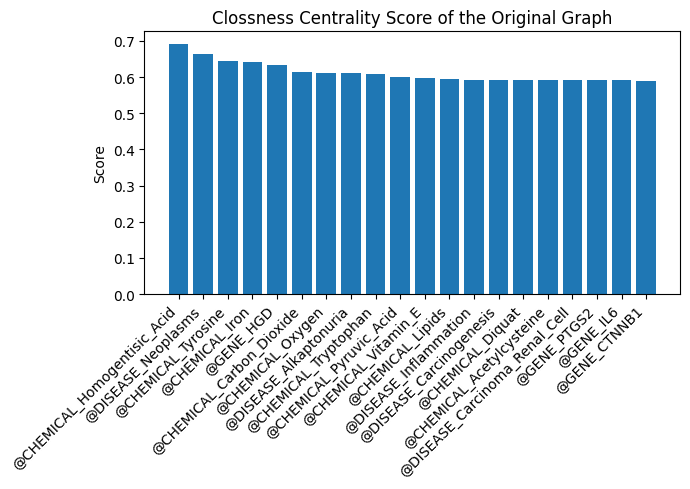

In [299]:
oricloseness = nx.closeness_centrality(originalGraph, distance='score')
plot_top_and_specific_entities(oricloseness, specific_entities=None, top_n=20, title="Clossness Centrality Score of the Original Graph")

### Extended graph

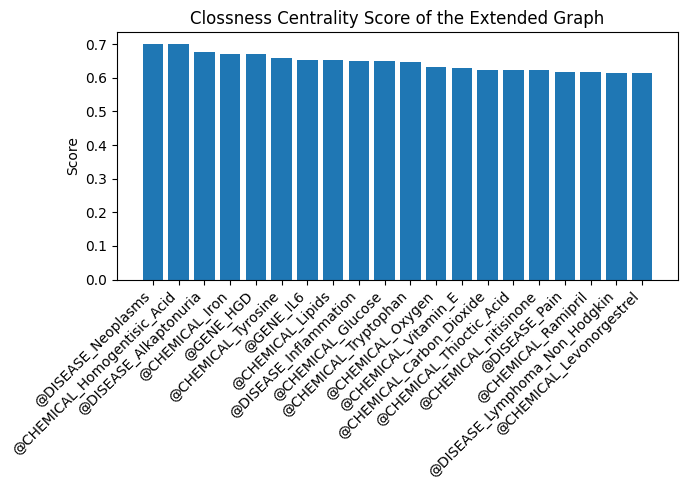

In [300]:
lv1closeness = nx.closeness_centrality(AlExGraph, distance='score')
plot_top_and_specific_entities(lv1closeness, specific_entities=None, top_n=20, title="Clossness Centrality Score of the Extended Graph")

### Filtered graph

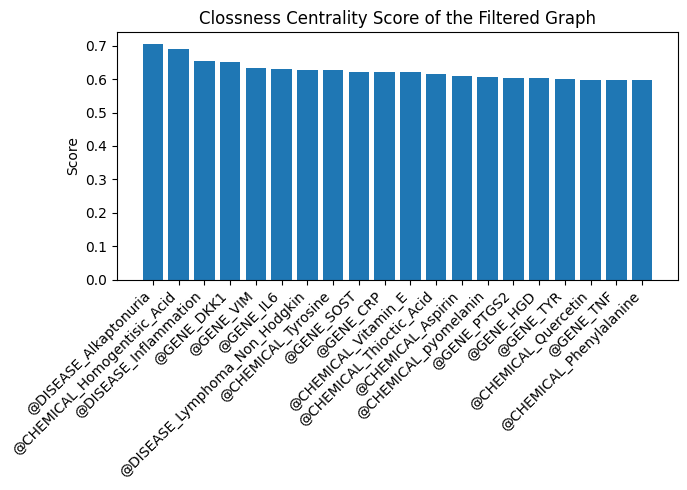

In [301]:
filtercloseness = nx.closeness_centrality(filteredlv1graph, distance='score')
plot_top_and_specific_entities(filtercloseness, specific_entities=None, top_n=20, title="Clossness Centrality Score of the Filtered Graph")

### High confident graph

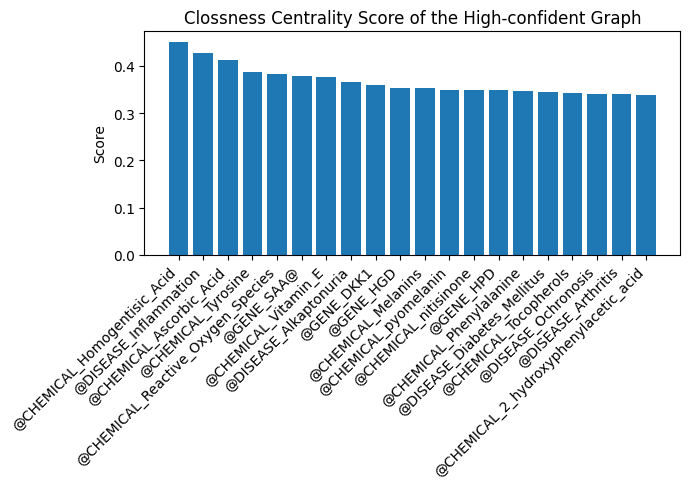

In [302]:
hicloseness = nx.closeness_centrality(highconfgraph, distance='score')
plot_top_and_specific_entities(hicloseness, specific_entities=None, top_n=20, title="Clossness Centrality Score of the High-confident Graph")

## PageRank persionalized from Alkaptonuria

In [312]:
# page rank 
import networkx as nx
def ppr(graph):
    # Define the node of interest
    node_of_interest = '@DISEASE_Alkaptonuria'

    # Personalized PageRank vector: only the node of interest has nonzero weight
    personalization = {n: 0 for n in graph.nodes()}
    personalization[node_of_interest] = 1.0

    # Compute Personalized PageRank
    pagerank_scores_Ex = nx.pagerank(graph, alpha=0.85, personalization=personalization, weight='score')

    # Sort nodes by their PageRank score (descending)

    pprEX = dict(sorted(pagerank_scores_Ex.items(), key=lambda item: item[1], reverse=True))
    del pprEX['@DISEASE_Alkaptonuria']
    pprExGene = dict()
    pprExChem = dict()
    pprExDi = dict()

    # Display top connected nodes to 'A'
    # print("Top nodes most connected to node @DISEASE_Alkaptonuria (via PageRank):")
    for node, score in pprEX.items():
        if '@GENE' in node:
            pprExGene[node] = score

        if '@CHEMICAL' in node:
            pprExChem[node] = score

        if '@DISEASE' in node and node != '@DISEASE_Alkaptonuria':
            pprExDi[node] = score
            
    plot_top_20_entities_3dicts(pprExGene, pprExChem, pprExDi)

### Extended network

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


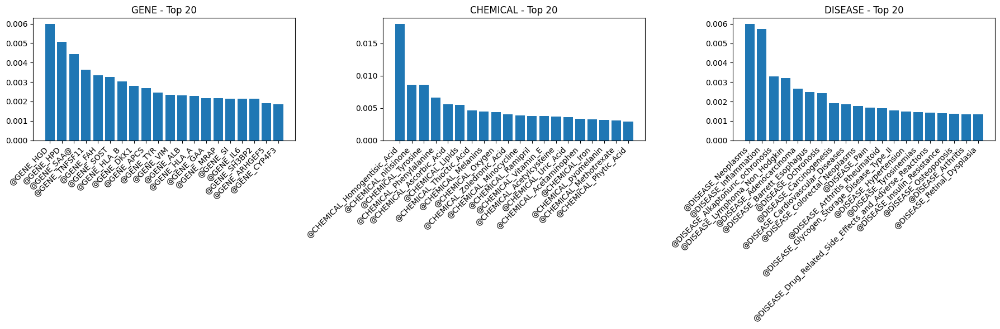

In [313]:
ppr(AlExGraph)

### Filtered network

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


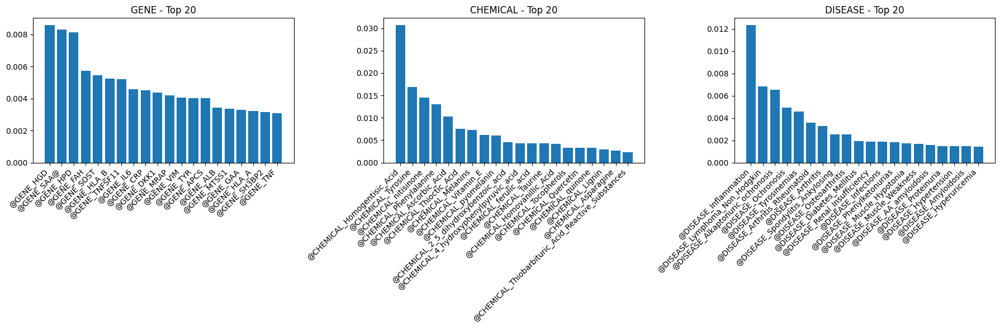

In [427]:
ppr(filteredlv1graph)

### High confident network

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


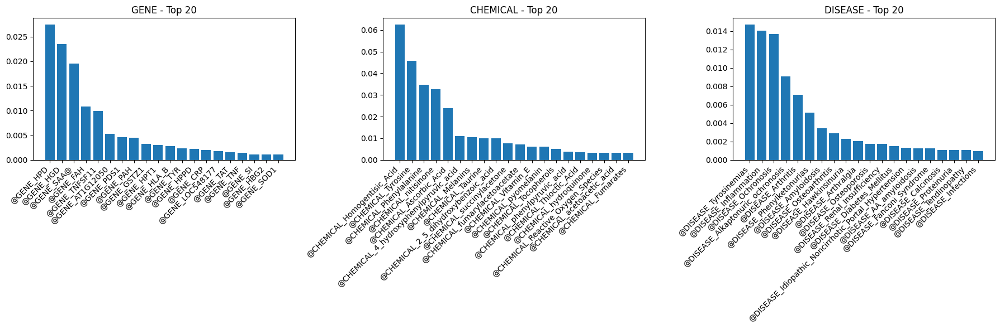

In [428]:
ppr(highconfgraph)

## Personalize from nodes to Alkaptonuria

#### Define function

In [ ]:
import networkx as nx

def personalized_pagerank_to_node(G, target_node='@DISEASE_Alkaptonuria', source_prefix='@GENE'):
    """
    For each @GENE node, compute the personalized PageRank and extract the score of 'Alkaptonuria'.

    Parameters:
        G (networkx.DiGraph): Directed graph.
        target_node (str): The node for which we want PPR values.
        gene_prefix (str): Prefix identifying gene nodes.

    Returns:
        dict: Mapping from @GENE node to the PageRank score of 'Alkaptonuria'.
    """
    if target_node not in G:
        raise ValueError(f"Target node '{target_node}' not found in the graph.")

    gene_nodes = [n for n in G.nodes if n.startswith(source_prefix)]
    result = {}

    for gene in gene_nodes:
        personalization = {n: 0 for n in G.nodes}
        personalization[gene] = 1.0

        # Compute Personalized PageRank from this gene
        ppr = nx.pagerank(G, personalization=personalization, weight='score')

        # Extract score for 'Alkaptonuria'
        result[gene] = ppr.get(target_node, 0.0)
    
    oripprtoalgene = dict()
    oripprtoalchem = dict()
    oripprtoaldi = dict() 
    for gene, score in dict(sorted(result.items(), key=lambda item: item[1], reverse=True)).items():
        if '@GENE' in gene:
            oripprtoalgene[gene] = score
        if '@CHEMICAL' in gene:
            oripprtoalchem[gene] = score 
        if '@DISEASE' in gene and gene != target_node:
            oripprtoaldi[gene] = score
        print(f"{gene}: {score:.4f}") 
    plot_top_20_entities_3dicts(oripprtoalgene, oripprtoalchem, oripprtoaldi)

    return result

### Original network

@DISEASE_Alkaptonuria: 0.2738
@VARIANT_c.847T>C_HGD_human: 0.2327
@VARIANT_c.551_552insG_HGD_human: 0.2327
@VARIANT_p.F329C_HGD_human: 0.2327
@VARIANT_p.E42A_HGD_human: 0.2327
@VARIANT_c.IVS6+46C>A_HGD_human: 0.2327
@VARIANT_p.V300G_HGD_human: 0.2327
@VARIANT_p.P230S_HGD_human: 0.2327
@VARIANT_c.IVS5+25T>C_HGD_human: 0.2327
@VARIANT_c.407T>A_HGD_human: 0.2327
@VARIANT_p.G161R_HGD_human: 0.2327
@VARIANT_c.1064T>C_GAA_human: 0.2327
@VARIANT_p.W60G_HGD_human: 0.2327
@VARIANT_p.A122D_HGD_human: 0.2327
@VARIANT_p.G270R_HGD_human: 0.2327
@VARIANT_p.A122V_HGD_human: 0.2327
@VARIANT_p.G251G_HGD_human: 0.2327
@VARIANT_c.183_1G>A_HGD_human: 0.2327
@VARIANT_c.15G>A_HGD_human: 0.2327
@VARIANT_p.M368V_HGD_human: 0.2327
@VARIANT_c.817C>T_HGD_human: 0.2327
@VARIANT_p.R58fsX_HGD_human: 0.2327
@VARIANT_c.342delA_HGD_human: 0.2327
@CHEMICAL_Thiobarbituric_Acid_Reactive_Substances: 0.2327
@GENE_MTSS1: 0.2327
@GENE_ARHGEF5: 0.2327
@GENE_SH3BP2: 0.2327
@VARIANT_p.G362R_HGD_human: 0.2327
@VARIANT_c.1273C>A_

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


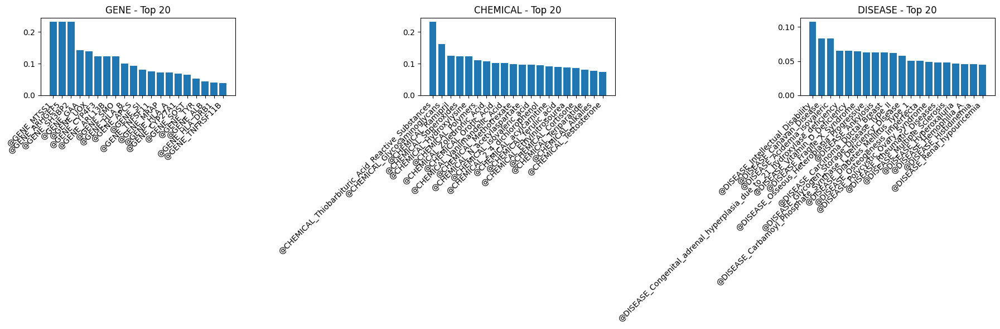

In [321]:
origenepprtoal = personalized_pagerank_to_node(originalGraph, target_node='@DISEASE_Alkaptonuria', source_prefix='@') 
# del genepprtoal['@DISEASE_Alkaptonuria']

### Extended network

@DISEASE_Alkaptonuria: 0.2424
@VARIANT_c.87+1G>A_HGD_human: 0.2060
@VARIANT_p.H80Q_HGD_human: 0.2060
@VARIANT_p.R225H_HGD_human: 0.2060
@VARIANT_p.E42A_HGD_human: 0.2060
@VARIANT_c.IVS6+46C>A_HGD_human: 0.2060
@VARIANT_p.V300G_HGD_human: 0.2060
@VARIANT_p.P230S_HGD_human: 0.2060
@VARIANT_c.1064T>C_GAA_human: 0.2060
@VARIANT_c.IVS5+25T>C_HGD_human: 0.2060
@VARIANT_c.407T>A_HGD_human: 0.2060
@VARIANT_p.G161R_HGD_human: 0.2060
@VARIANT_p.W60G_HGD_human: 0.2060
@VARIANT_p.A122D_HGD_human: 0.2060
@VARIANT_p.A122V_HGD_human: 0.2060
@VARIANT_p.G251G_HGD_human: 0.2060
@VARIANT_c.183_1G>A_HGD_human: 0.2060
@VARIANT_c.15G>A_HGD_human: 0.2060
@VARIANT_p.M368V_HGD_human: 0.2060
@VARIANT_c.817C>T_HGD_human: 0.2060
@VARIANT_p.R58fsX_HGD_human: 0.2060
@VARIANT_c.342delA_HGD_human: 0.2060
@VARIANT_p.G362R_HGD_human: 0.2060
@VARIANT_c.1273C>A_HGD_human: 0.2060
@VARIANT_c.847T>C_HGD_human: 0.2060
@VARIANT_c.533T>G_HGD_human: 0.2060
@VARIANT_c.551_552insG_HGD_human: 0.2060
@VARIANT_c.1046T>G_HGD_human: 0

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


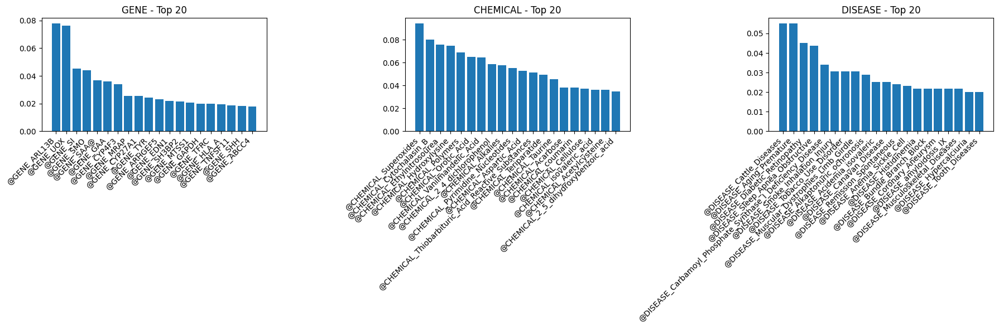

In [322]:
expprtoal = personalized_pagerank_to_node(AlExGraph, target_node='@DISEASE_Alkaptonuria', source_prefix='@') 
# del genepprtoal['@DISEASE_Alkaptonuria']

### Filtered network

@DISEASE_Alkaptonuria: 0.2974
@VARIANT_c.87+1G>A_HGD_human: 0.2527
@VARIANT_p.H80Q_HGD_human: 0.2527
@VARIANT_p.R225H_HGD_human: 0.2527
@VARIANT_p.E42A_HGD_human: 0.2527
@VARIANT_c.IVS6+46C>A_HGD_human: 0.2527
@VARIANT_p.V300G_HGD_human: 0.2527
@VARIANT_p.P230S_HGD_human: 0.2527
@VARIANT_c.IVS5+25T>C_HGD_human: 0.2527
@VARIANT_c.407T>A_HGD_human: 0.2527
@VARIANT_p.G161R_HGD_human: 0.2527
@VARIANT_c.1064T>C_GAA_human: 0.2527
@VARIANT_p.W60G_HGD_human: 0.2527
@VARIANT_p.A122D_HGD_human: 0.2527
@VARIANT_p.E401Q_HGD_human: 0.2527
@VARIANT_p.G270R_HGD_human: 0.2527
@CHEMICAL_Aspartic_Acid: 0.2527
@VARIANT_p.A122V_HGD_human: 0.2527
@VARIANT_p.G251G_HGD_human: 0.2527
@VARIANT_p.M368V_HGD_human: 0.2527
@VARIANT_p.G362R_HGD_human: 0.2527
@VARIANT_c.1273C>A_HGD_human: 0.2527
@VARIANT_c.847T>C_HGD_human: 0.2527
@VARIANT_c.533T>G_HGD_human: 0.2527
@VARIANT_c.551_552insG_HGD_human: 0.2527
@VARIANT_c.1046T>G_HGD_human: 0.2527
@VARIANT_p.F329C_HGD_human: 0.2527
@VARIANT_p.Y62C_HGD_human: 0.2527
@VARI

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


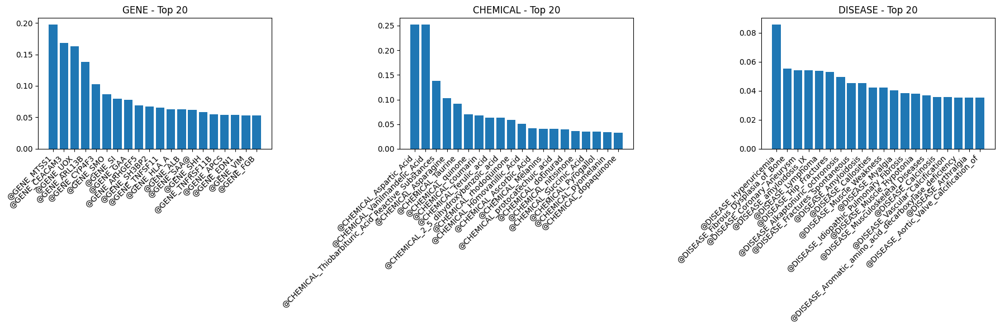

In [429]:
lv1genepprtoal = personalized_pagerank_to_node(filteredlv1graph, target_node='@DISEASE_Alkaptonuria', source_prefix='@') 
# del genepprtoal['@DISEASE_Alkaptonuria']

### High confident network

@DISEASE_Alkaptonuria: 0.3060
@GENE_TNFSF11: 0.2601
@VARIANT_c.87+1G>A_HGD_human: 0.2601
@VARIANT_p.H80Q_HGD_human: 0.2601
@VARIANT_p.R225H_HGD_human: 0.2601
@VARIANT_p.V300G_HGD_human: 0.2601
@VARIANT_p.W60G_HGD_human: 0.2601
@VARIANT_p.A122D_HGD_human: 0.2601
@VARIANT_p.G270R_HGD_human: 0.2601
@VARIANT_p.A122V_HGD_human: 0.2601
@VARIANT_p.G360R_HGD_human: 0.2601
@CHEMICAL_Taurine: 0.2601
@VARIANT_p.M368V_HGD_human: 0.2601
@VARIANT_p.R58fsX_HGD_human: 0.2601
@VARIANT_p.P230S_HGD_human: 0.2601
@VARIANT_p.G161R_HGD_human: 0.2601
@CHEMICAL_2_5_dihydroxybenzoic_acid: 0.2601
@GENE_SAA@: 0.0868
@DISEASE_Amyloidosis: 0.0738
@CHEMICAL_Ascorbic_Acid: 0.0621
@GENE_HPD: 0.0607
@CHEMICAL_nitisinone: 0.0538
@GENE_HGD: 0.0533
@CHEMICAL_p_hydroxyphenyllactic_acid: 0.0528
@DISEASE_Arthralgia: 0.0528
@CHEMICAL_4_hydroxyphenylacetate: 0.0516
@DISEASE_Hawkinsinuria: 0.0516
@DISEASE_Renal_Insufficiency: 0.0457
@DISEASE_Osteoporosis: 0.0457
@CHEMICAL_4_hydroxyphenyllactic_acid: 0.0457
@CHEMICAL_Phenylalan

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


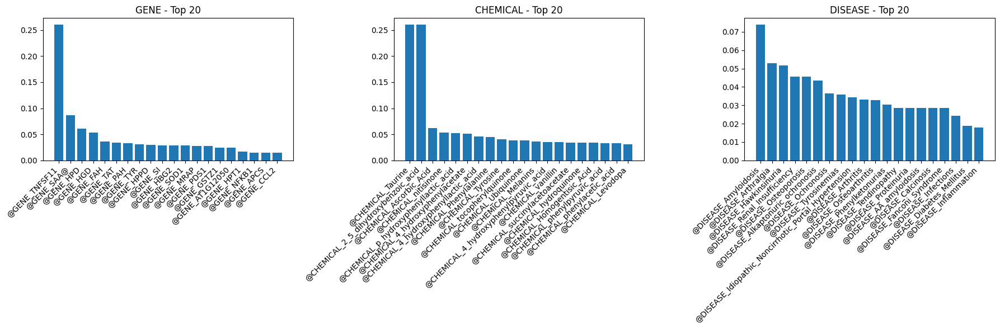

In [324]:
higenepprtoal = personalized_pagerank_to_node(highconfgraph, target_node='@DISEASE_Alkaptonuria', source_prefix='@') 
# del genepprtoal['@DISEASE_Alkaptonuria']

## Maximum flow

### Define functions 

In [327]:
import networkx as nx

def compute_max_flow_to_target_disease(G, target_disease, disease_prefix='@', weight='score', switch=False):
    """
    Compute maximum flow from each other disease node to a target disease in a directed, weighted graph.

    Parameters:
    - G: NetworkX DiGraph
    - target_disease: node name of the disease of interest (sink)
    - disease_prefix: prefix to identify disease nodes (default: '@DISEASE')
    - weight: edge weight attribute used as capacity (default: 'weight')

    Returns:
    - flow_results: dict {source_disease: max_flow_value}
    """
    if not G.is_directed():
        raise ValueError("Graph must be directed.")
    if target_disease not in G:
        raise ValueError("Target disease not found in graph.")

    flow_results = {}

    # Identify all disease nodes except the target
    source_diseases = [
        node for node in G.nodes()
        if str(node).startswith(disease_prefix) and node != target_disease
    ]

    for source in source_diseases:
        try:
            if switch:
                # Switch source and target for max flow calculation
                flow_value, _ = nx.maximum_flow(G, target_disease, source, capacity=weight)
            else:
                # Normal max flow calculation
                flow_value, _ = nx.maximum_flow(G, source, target_disease, capacity=weight)
            flow_results[source] = flow_value
        except (nx.NetworkXError, nx.NetworkXUnfeasible):
            flow_results[source] = 0.0

    print("Maximum flow values to @DISEASE_Alkaptonuria:")
    # geneppr.items(), key=lambda item: item[1], reverse=True 
    flowtoalgene = dict()
    flowtoalchem = dict()
    flowtoaldi = dict()
    for node, flow in dict(sorted(flow_results.items(), key=lambda item: item[1], reverse=True)).items():
        if node.startswith("@GENE"):
            flowtoalgene[node] = flow 
        if node.startswith("@CHEMICAL"):
            flowtoalchem[node] = flow
        if node.startswith("@DISEASE") and node != '@DISEASE_Alkaptonuria':
            flowtoaldi[node] = flow
            
    plot_top_20_entities_3dicts(flowtoalgene, flowtoalchem, flowtoaldi)
    return flow_results


### Original network

Maximum flow values to @DISEASE_Alkaptonuria:


/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


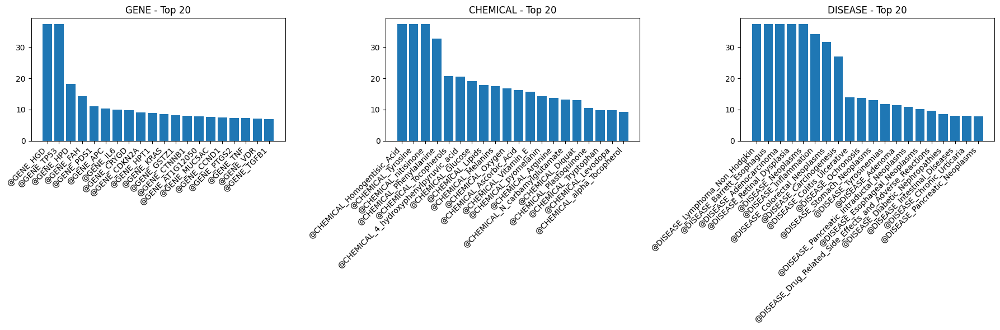

In [330]:
node_to_al_flow_ori = compute_max_flow_to_target_disease(
    originalGraph.to_directed(),
    target_disease='@DISEASE_Alkaptonuria',
    disease_prefix='@',
    weight='score'
)

### Extended network 

In [ ]:
node_to_al_flow = compute_max_flow_to_target_disease(
    AlExGraph.to_directed(),
    target_disease='@DISEASE_Alkaptonuria',
    disease_prefix='@',
    weight='score'
)

### Filterlv1 

Maximum flow values to @DISEASE_Alkaptonuria:


/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


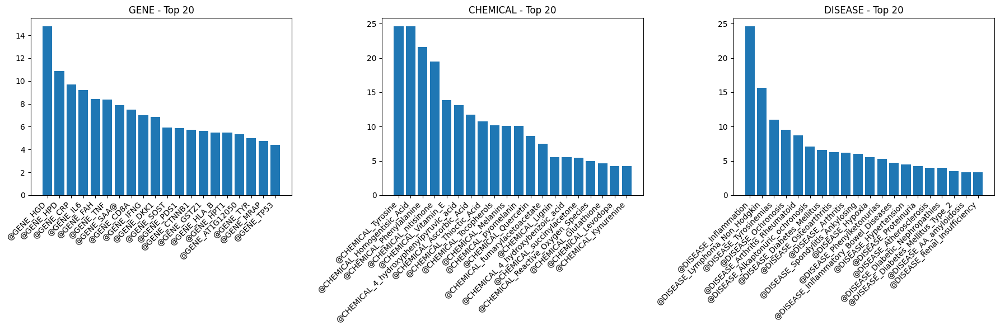

In [431]:
node_to_al_flow_fil = compute_max_flow_to_target_disease(
    filteredlv1graph.to_directed(),
    target_disease='@DISEASE_Alkaptonuria',
    disease_prefix='@',
    weight='score'
)

### High-confident network

Maximum flow values to @DISEASE_Alkaptonuria:


/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2491794532.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(keys, rotation=45, ha="right")


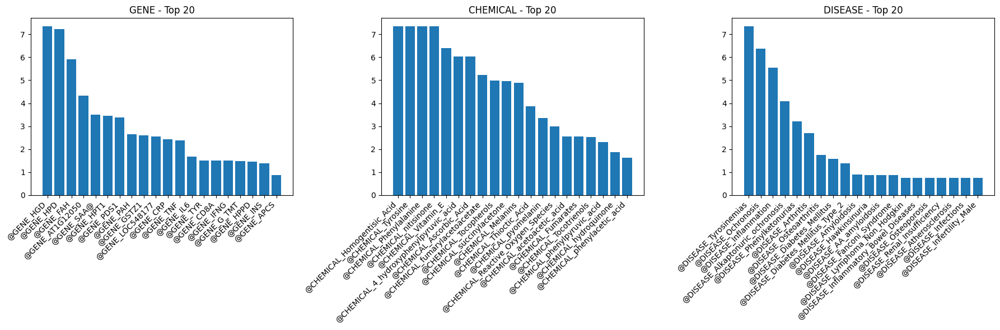

In [432]:
node_to_al_flow_hi = compute_max_flow_to_target_disease(
    highconfgraph.to_directed(),
    target_disease='@DISEASE_Alkaptonuria',
    disease_prefix='@',
    weight='score'
)

## Metapath Chemical-Gene-Disease analysis 

### Define functions

In [336]:
import math
import numpy as np
import networkx as nx
from typing import Dict, List, Tuple, Optional, Iterable

# ----------------------------
# Helpers
# ----------------------------

def _node_type(n: str) -> Optional[str]:
    """Infer type from name prefix."""
    if isinstance(n, str):
        for pfx, t in [("@CHEMICAL", "chemical"),
                       ("@GENE", "gene"),
                       ("@DISEASE", "disease"),
                       ("@VARIANT", "variant")]:
            if n.startswith(pfx):
                return t
    return None

def _collect_by_type(G: nx.Graph) -> Dict[str, List[str]]:
    types = {"chemical": [], "gene": [], "disease": [], "variant": []}
    for n in G.nodes():
        t = _node_type(n)
        if t in types:
            types[t].append(n)
    return types

def _row_normalize(A: np.ndarray) -> np.ndarray:
    A = A.astype(float, copy=True)
    rs = A.sum(axis=1, keepdims=True)
    rs[rs == 0] = 1.0  # keep zero-rows as zeros
    return A / rs

def _build_bipartite_matrix(
    G: nx.Graph,
    left_nodes: List[str],
    right_nodes: List[str],
    weight_attr: Optional[str] = None
) -> np.ndarray:
    """Construct a (|left| x |right|) adjacency matrix using edge weights or 1s."""
    li = {n: i for i, n in enumerate(left_nodes)}
    rj = {n: j for j, n in enumerate(right_nodes)}
    A = np.zeros((len(left_nodes), len(right_nodes)), dtype=float)

    # For directed graphs, we allow either direction (C<->G, G<->D) as 'connected'
    # since the metapath semantics are type-based. Adjust if you need directionality.
    def add_edge(u, v, w):
        if u in li and v in rj:
            A[li[u], rj[v]] += w
        if v in li and u in rj:
            A[li[v], rj[u]] += w

    for u, v, data in G.edges(data=True):
        if u not in li and u not in rj and v not in li and v not in rj:
            continue
        w = float(data.get(weight_attr, 1.0)) if weight_attr else 1.0
        if w <= 0:
            continue
        add_edge(u, v, w)

    return A

# ----------------------------
# Core: HeteSim for C–G–D
# ----------------------------

def hete_cgd_rank(
    G: nx.Graph,
    target_disease: str,
    *,
    weight_attr: Optional[str] = 'score',
    exclude_variants: bool = True,
    top_k: Optional[int] = None
) -> List[Tuple[str, float]]:
    """
    Rank chemicals for a target disease using HeteSim along the C–G–D metapath.

    Parameters
    ----------
    G : nx.Graph or nx.DiGraph
        Heterogeneous graph whose node names start with '@CHEMICAL', '@GENE', '@DISEASE', '@VARIANT'.
    target_disease : str
        Node name of the target disease (must start with '@DISEASE').
    weight_attr : str or None
        Edge attribute to use as edge weight (strength). None => unweighted (1s).
    exclude_variants : bool
        If True, nodes starting with '@VARIANT' are ignored.
    top_k : int or None
        Return only the top-k chemicals (sorted by score). None => all.

    Returns
    -------
    List[Tuple[chemical_node, hete_score]]
        Sorted in descending score. Zero scores are kept (you can filter them out if desired).
    """
    if not isinstance(target_disease, str) or not target_disease.startswith("@DISEASE"):
        raise ValueError("target_disease must be a string node starting with '@DISEASE'.")

    groups = _collect_by_type(G)
    chemicals = groups["chemical"]
    genes = groups["gene"]
    diseases = groups["disease"]

    if exclude_variants:
        # Just ignore variants; metapath is C–G–D
        pass

    if target_disease not in diseases:
        raise ValueError(f"Target disease '{target_disease}' not found among disease nodes.")

    if not chemicals or not genes:
        return []

    # Build adjacency for C-G and G-D
    A_CG = _build_bipartite_matrix(G, chemicals, genes, weight_attr=weight_attr)
    # print(A_CG)
    A_GD = _build_bipartite_matrix(G, genes, diseases,  weight_attr=weight_attr)
    # print(A_GD)

    # Transition probabilities
    P_CG = _row_normalize(A_CG)        # C -> G
    P_DG = _row_normalize(A_GD.T)      # D -> G  (reverse of G->D)

    # Build one-hot for target disease
    d_index = {d: j for j, d in enumerate(diseases)}[target_disease]
    e_d = np.zeros((1, len(diseases)), dtype=float)
    e_d[0, d_index] = 1.0

    # Right-half distribution (disease to genes along reverse half)
    R_d = e_d @ P_DG  # shape: 1 x |G|

    # Pre-normalize R_d for cosine (avoid divide-by-zero)
    r_norm = np.linalg.norm(R_d)
    # If target has no G connections, all scores are zero.
    if r_norm == 0.0:
        return [(c, 0.0) for c in chemicals]

    # Compute scores for all chemicals
    scores: List[Tuple[str, float]] = []
    for i, c in enumerate(chemicals):
        # Left-half distribution (chemical to genes)
        L_c = P_CG[i:i+1, :]  # 1 x |G|
        l_norm = np.linalg.norm(L_c)
        if l_norm == 0.0:
            sim = 0.0
        else:
            sim = float((L_c @ R_d.T) / (l_norm * r_norm))  # cosine similarity
        # Numerical guard
        if not math.isfinite(sim):
            sim = 0.0
        scores.append((c, sim))

    scores.sort(key=lambda x: x[1], reverse=True)
    return scores[:top_k] if (top_k is not None and top_k > 0) else scores


# ----------------------------
# Optional: full CxD score matrix
# ----------------------------

def hete_cgd_matrix(
    G: nx.Graph,
    *,
    weight_attr: Optional[str] = None,
    exclude_variants: bool = True
) -> Tuple[np.ndarray, List[str], List[str]]:
    """
    Compute a full HeteSim score matrix for all (chemical, disease) pairs along C–G–D.

    Returns
    -------
    M : np.ndarray  (|C| x |D|)
        HeteSim scores.
    chemicals : List[str]
    diseases : List[str]
    """
    groups = _collect_by_type(G)
    chemicals = groups["chemical"]
    genes = groups["gene"]
    diseases = groups["disease"]

    if exclude_variants:
        pass

    if not (chemicals and genes and diseases):
        return np.zeros((0, 0)), chemicals, diseases

    A_CG = _build_bipartite_matrix(G, chemicals, genes, weight_attr=weight_attr)
    A_GD = _build_bipartite_matrix(G, genes, diseases,  weight_attr=weight_attr)

    P_CG = _row_normalize(A_CG)   # C -> G
    P_DG = _row_normalize(A_GD.T) # D -> G

    # Cosine similarity between each row of P_CG and each row of P_DG
    # Normalize rows
    def safe_norm_rows(M):
        norms = np.linalg.norm(M, axis=1, keepdims=True)
        norms[norms == 0] = 1.0
        return M / norms

    L = safe_norm_rows(P_CG)  # |C| x |G|
    R = safe_norm_rows(P_DG)  # |D| x |G|
    # HeteSim(C,D) = cosine( L_c , R_d )
    # => M = L @ R^T
    M = L @ R.T
    return M, chemicals, diseases

In [435]:
def metapath_ana_visualize(graph, top_n=20):
    # Rank chemicals for a target disease
    scores = hete_cgd_rank(graph, "@DISEASE_Alkaptonuria", top_k=None)
    hetesimdict = dict()
    for chem, s in scores:
        print(chem, round(s, 4))
        hetesimdict[chem] = round(s, 4)


    # Full matrix
    M, C, D = hete_cgd_matrix(graph)
    print("\nChemicals:", C)
    print("Diseases :", D)
    print("Score matrix (rows=C, cols=D):\n", np.round(M, 4))
    plot_top_and_specific_entities(hetesimdict, [], top_n=top_n, title="")

### Extend network 

@CHEMICAL_Homogentisic_Acid 0.4138
@CHEMICAL_Oxygen 0.3885
@CHEMICAL_Melanins 0.3773
@CHEMICAL_Taurine 0.3559
@CHEMICAL_tocopherylquinone 0.3552
@CHEMICAL_Fluorine 0.3552
@CHEMICAL_Hydrogen 0.3552
@CHEMICAL_2_4(1H_3H)_quinazolinedione 0.3552
@CHEMICAL_Metals 0.3552
@CHEMICAL_Cadmium 0.3552
@CHEMICAL_2_(2_nitro_4_(trifluoromethyl)benzoyl)_4_4_6_6_tetramethylcyclohexane_1_3_5_trione 0.3552
@CHEMICAL_pyrazolone 0.3552
@CHEMICAL_nitisinone 0.3472
@CHEMICAL_Lignin 0.3157
@CHEMICAL_Ethylnitrosourea 0.3157
@CHEMICAL_Phenylalanine 0.2886
@CHEMICAL_Tyrosine 0.2724
@CHEMICAL_Iron 0.272
@CHEMICAL_vanillin 0.2681
@CHEMICAL_Carbon_Dioxide 0.2681
@CHEMICAL_Amino_Acids_Aromatic 0.2681
@CHEMICAL_ethylbenzene 0.2681
@CHEMICAL_Sulfates 0.2681
@CHEMICAL_Disulfides 0.2681
@CHEMICAL_Salicylates 0.2681
@CHEMICAL_Glucuronides 0.2681
@CHEMICAL_purine 0.2681
@CHEMICAL_Ascorbic_Acid 0.2517
@CHEMICAL_Acetylcysteine 0.2517
@CHEMICAL_Carbon 0.2512
@CHEMICAL_sulcotrione 0.2512
@CHEMICAL_Tritium 0.2512
@CHEMICAL_4_h

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/1665326467.py:148: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sim = float((L_c @ R_d.T) / (l_norm * r_norm))  # cosine similarity
/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/2970545687.py:41: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


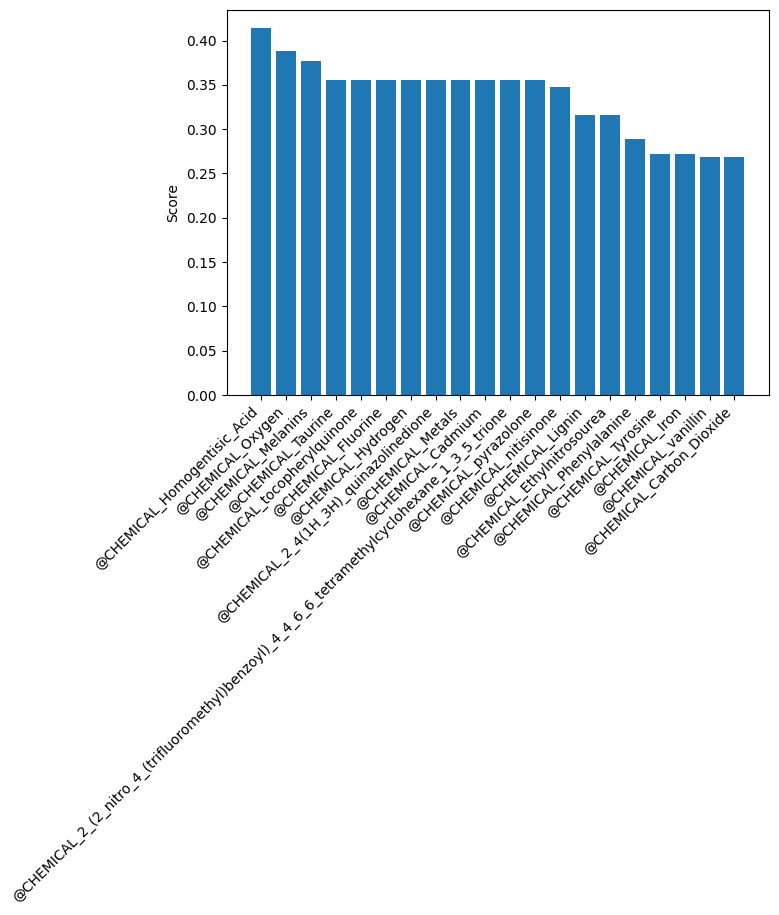

In [337]:
metapath_ana_visualize(AlExGraph)

### Filter graph

@CHEMICAL_Homogentisic_Acid 0.4138
@CHEMICAL_Melanins 0.3773
@CHEMICAL_Taurine 0.3559
@CHEMICAL_tocopherylquinone 0.3552
@CHEMICAL_nitisinone 0.3472
@CHEMICAL_Lignin 0.3157
@CHEMICAL_Phenylalanine 0.2886
@CHEMICAL_Tyrosine 0.2724
@CHEMICAL_vanillin 0.2681
@CHEMICAL_Disulfides 0.2681
@CHEMICAL_Salicylates 0.2681
@CHEMICAL_Ascorbic_Acid 0.2517
@CHEMICAL_4_hydroxyphenylacetate 0.2131
@CHEMICAL_4_hydroxyphenylpyruvic_acid 0.2112
@CHEMICAL_4_hydroxybenzoic_acid 0.1896
@CHEMICAL_Levodopa 0.1783
@CHEMICAL_dopaquinone 0.1783
@CHEMICAL_4_hydroxybenzylcyanide 0.1783
@CHEMICAL_coumarin 0.1783
@CHEMICAL_pyomelanin 0.145
@CHEMICAL_succinylacetone 0.1354
@CHEMICAL_hydroquinone 0.1261
@CHEMICAL_Rutin 0.117
@CHEMICAL_Quercetin 0.1143
@CHEMICAL_N'_formylkynurenine 0.0996
@CHEMICAL_Thioctic_Acid 0.0879
@CHEMICAL_glyoxylic_acid 0.0
@CHEMICAL_fumarylacetoacetate 0.0
@CHEMICAL_hawkinsin 0.0
@CHEMICAL_Decitabine 0.0
@CHEMICAL_Succinic_Acid 0.0
@CHEMICAL_Ketoglutaric_Acids 0.0
@CHEMICAL_Vitamin_K_1 0.0
@CHEM

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/1665326467.py:148: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sim = float((L_c @ R_d.T) / (l_norm * r_norm))  # cosine similarity


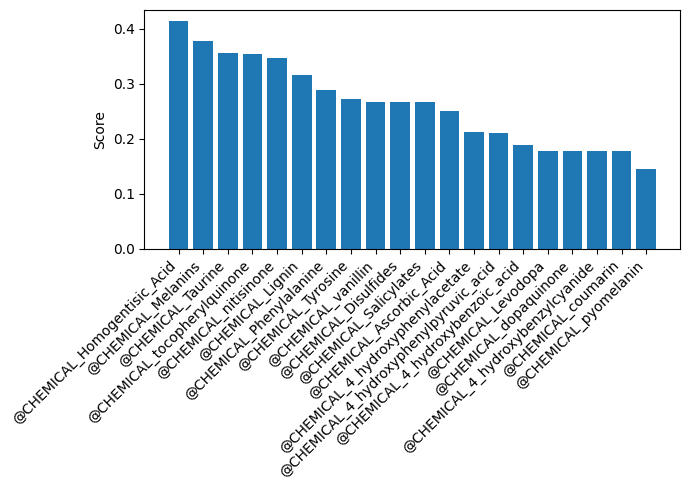

In [436]:
metapath_ana_visualize(filteredlv1graph)

### High confident network 

@CHEMICAL_nitisinone 0.5795
@CHEMICAL_4_hydroxyphenylacetate 0.5646
@CHEMICAL_Homogentisic_Acid 0.5082
@CHEMICAL_vanillin 0.4261
@CHEMICAL_Melanins 0.3993
@CHEMICAL_Tyrosine 0.3767
@CHEMICAL_4_hydroxyphenylpyruvic_acid 0.37
@CHEMICAL_Phenylalanine 0.2795
@CHEMICAL_Lignin 0.0
@CHEMICAL_fumarylacetoacetate 0.0
@CHEMICAL_Ascorbic_Acid 0.0
@CHEMICAL_pyomelanin 0.0
@CHEMICAL_Levodopa 0.0
@CHEMICAL_tocopherylquinone 0.0
@CHEMICAL_Ubiquinone 0.0
@CHEMICAL_Tocopherols 0.0
@CHEMICAL_4_hydroxyphenylacetic_acid 0.0
@CHEMICAL_succinylacetone 0.0
@CHEMICAL_hydroquinone 0.0
@CHEMICAL_Vitamin_E 0.0
@CHEMICAL_Tocotrienols 0.0
@CHEMICAL_phenylpyruvic_acid 0.0
@CHEMICAL_Reactive_Oxygen_Species 0.0
@CHEMICAL_phenylacetic_acid 0.0
@CHEMICAL_3_phenyllactic_acid 0.0
@CHEMICAL_Glutathione 0.0
@CHEMICAL_4_hydroxyphenyllactic_acid 0.0
@CHEMICAL_Aspirin 0.0
@CHEMICAL_Creatinine 0.0
@CHEMICAL_quinone 0.0
@CHEMICAL_p_hydroxyphenyllactic_acid 0.0
@CHEMICAL_acetoacetic_acid 0.0
@CHEMICAL_Fumarates 0.0
@CHEMICAL_2_5

/var/folders/01/v0p4sfw945j32p3yvg67p6cc0000gn/T/ipykernel_1346/1665326467.py:148: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sim = float((L_c @ R_d.T) / (l_norm * r_norm))  # cosine similarity


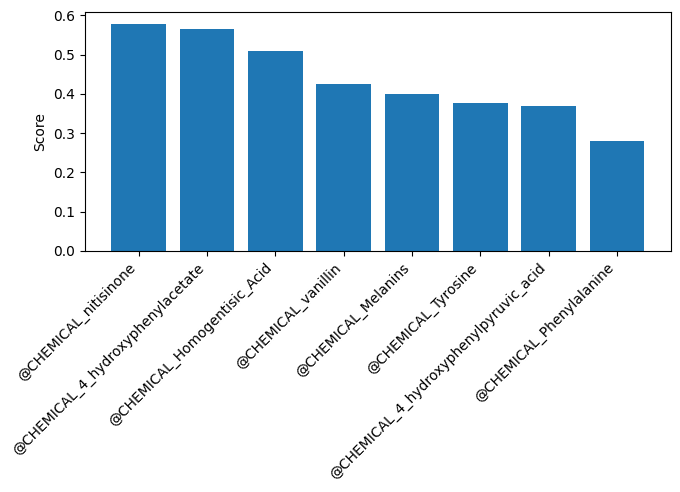

In [437]:
metapath_ana_visualize(highconfgraph, 8)

## Disease similarity 

### Define functions 

In [344]:
import math
import numpy as np
import networkx as nx
import scipy.sparse as sp
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_similarity
from collections import defaultdict
from math import comb

# ---------- Helpers ----------

def _node_type(n):
    if isinstance(n, str):
        if n.startswith("@DISEASE"): return "disease"
        if n.startswith("@GENE"):    return "gene"
        if n.startswith("@CHEMICAL"):return "chemical"
    return None

def _collect_neighbors(G, node, kinds, in_edges=True, out_edges=True):
    """Return neighbors of specified kinds, respecting direction options."""
    neigh = []
    if G.is_directed():
        if in_edges:
            for u, v, data in G.in_edges(node, data=True):
                if _node_type(u) in kinds:
                    neigh.append((u, data))
        if out_edges:
            for u, v, data in G.out_edges(node, data=True):
                if _node_type(v) in kinds:
                    neigh.append((v, data))
    else:
        for nbr, data in G[node].items():
            if _node_type(nbr) in kinds:
                neigh.append((nbr, data))
    return neigh

def _build_incidence(G, diseases, items, item_kind,
                     in_edges=True, out_edges=True,
                     use_weights=False, signed=False):
    """Build D x I sparse matrix: rows=diseases, cols=items (genes or chemicals)."""
    d2i = {d:i for i,d in enumerate(diseases)}
    i2j = {it:j for j,it in enumerate(items)}
    rows, cols, vals = [], [], []

    for d in diseases:
        row = d2i[d]
        neigh = _collect_neighbors(G, d, {item_kind}, in_edges=in_edges, out_edges=out_edges)
        agg = defaultdict(float)
        for nbr, data in neigh:
            val = 1.0
            if use_weights and 'score' in data:
                # print("Use score")
                val = float(data['score'])
            if signed and 'sign' in data:
                s = data['sign']
                if isinstance(s, str):
                    s = 1.0 if s.lower().startswith('+') else -1.0
                val *= float(s)
            agg[nbr] += val
        for nbr, v in agg.items():
            if nbr in i2j:
                rows.append(row)
                cols.append(i2j[nbr])
                vals.append(v)

    mat = sp.coo_matrix((vals, (rows, cols)), shape=(len(diseases), len(items)))
    return mat.tocsr()

def _tfidf_rows(X):
    # L2 row-normalize (TF)
    X_tf = normalize(X, norm='l2', axis=1, copy=True)
    # IDF on columns
    df = np.asarray((X > 0).sum(axis=0)).ravel()
    idf = np.log((X.shape[0]) / (1.0 + df))
    return X_tf @ sp.diags(idf)

def _cosine_sim(X, tfidf=False):
    Xw = _tfidf_rows(X) if tfidf else normalize(X, norm='l2', axis=1, copy=True)
    return cosine_similarity(Xw, dense_output=False)  # sparse

def _pathsim(A):
    # A: D x I (weights allowed). M = A A^T
    M = (A @ A.T).tocsr()
    diag = M.diagonal()
    rows, cols = M.nonzero()
    data = M.data
    ps_vals = []
    for v, i, j in zip(data, rows, cols):
        denom = diag[i] + diag[j]
        ps_vals.append(0.0 if denom == 0 else 2.0 * v / denom)
    return sp.csr_matrix((ps_vals, (rows, cols)), shape=M.shape)

def _hypergeom_overlap(A):
    """
    Binary overlap significance (via items). A is D x I binary.
    Uses survival function approximation for moderate sizes.
    Weight = -log10(p-value). Non-overlapping pairs omitted (weight=0).
    """
    A_bin = A.copy().astype(bool).astype(int).tocsr()
    M = (A_bin @ A_bin.T).tocsr()  # pair overlaps
    n_items = A.shape[1]
    diag = A_bin.sum(axis=1).A1  # set sizes

    rows, cols = M.nonzero()
    ks = M.data
    vals = []
    for k, i, j in zip(ks, rows, cols):
        if i == j or k == 0:
            vals.append(0.0)
            continue
        Ki = diag[i]; Kj = diag[j]
        # compute P(X >= k) for Hypergeom(N=n_items, K=Ki, n=Kj)
        # naive sum of pmf tails; OK for typical sparse projections
        p = 0.0
        max_x = int(min(Ki, Kj))
        # guard small combinatorics; use logs if needed
        for x in range(k, max_x+1):
            num = comb(Ki, x) * comb(n_items - Ki, Kj - x)
            den = comb(n_items, Kj)
            p += num / den
        vals.append(0.0 if p <= 0 else -math.log10(p))
    return sp.csr_matrix((vals, (rows, cols)), shape=M.shape)

def _combine(mats, weights=None):
    mats = [m.tocsr() for m in mats if m is not None]
    if not mats: return None
    if weights is None:
        weights = [1.0/len(mats)]*len(mats)
    out = mats[0].multiply(weights[0])
    for m, w in zip(mats[1:], weights[1:]):
        out = out + m.multiply(w)
    return out

def _topk_per_row(S, k):
    if k is None: return S.tocsr()
    S = S.tolil()
    n = S.shape[0]
    for i in range(n):
        row = S.rows[i]; data = S.data[i]
        # drop self-loop
        for idx, j in enumerate(row):
            if j == i:
                row.pop(idx); data.pop(idx)
                break
        if len(row) > k:
            idxs = np.argpartition(data, -k)[-k:]
            keep = set(np.array(row)[idxs])
            mask = [j in keep for j in row]
            S.rows[i] = list(np.array(row)[mask])
            S.data[i] = list(np.array(data)[mask])
    return S.tocsr()

# ---------- Main entry ----------

def build_disease_similarity(
    G: nx.Graph,
    via=("gene","chemical"),                  # which channels to use
    method=("cosine_tfidf", "pathsim"),      # similarity methods to combine
    in_edges=True, out_edges=True,           # direction handling
    use_weights=True, signed=False,         # edge attributes: weight/sign
    weights_by_channel=None,                 # e.g., {"gene":0.6,"chemical":0.4}
    weights_by_method=None,                  # e.g., {"cosine_tfidf":0.5,"pathsim":0.5}
    hypergeom_binary=False,                  # if True, use hypergeometric for a channel (binary)
    topk=20                                  # keep top-k neighbors per disease (None to skip)
):
    """
    Returns:
      H (nx.Graph): disease–disease weighted similarity graph
      S (scipy.sparse.csr_matrix): similarity matrix aligned to disease order
      diseases (list): disease node order used in S
    """
    # collect nodes
    diseases = [n for n in G.nodes if _node_type(n) == "disease"]
    genes    = [n for n in G.nodes if _node_type(n) == "gene"]
    chems    = [n for n in G.nodes if _node_type(n) == "chemical"]

    if not diseases:
        raise ValueError("No @DISEASE nodes found.")
    if not genes and "gene" in via:
        via = tuple(x for x in via if x != "gene")
    if not chems and "chemical" in via:
        via = tuple(x for x in via if x != "chemical")
    if not via:
        raise ValueError("No projection channels available (no genes/chemicals present).")

    # default weights
    if weights_by_channel is None:
        weights_by_channel = {ch: 1.0/len(via) for ch in via}
    if weights_by_method is None:
        unique_methods = tuple(method) if isinstance(method, (list, tuple)) else (method,)
        weights_by_method = {m: 1.0/len(unique_methods) for m in unique_methods}

    # build per-channel similarity
    channel_sims = []
    for ch in via:
        if ch == "gene":
            A = _build_incidence(G, diseases, genes, "gene",
                                 in_edges, out_edges, use_weights, signed)
        elif ch == "chemical":
            A = _build_incidence(G, diseases, chems, "chemical",
                                 in_edges, out_edges, use_weights, signed)
        else:
            continue

        per_methods = []
        mlist = tuple(method) if isinstance(method, (list, tuple)) else (method,)

        for m in mlist:
            if m == "cosine":
                per_methods.append(_cosine_sim(A, tfidf=False))
            elif m == "cosine_tfidf":
                per_methods.append(_cosine_sim(A, tfidf=True))
            elif m == "pathsim":
                per_methods.append(_pathsim(A))
            elif m == "hypergeom":
                per_methods.append(_hypergeom_overlap(A))
            else:
                raise ValueError(f"Unknown method: {m}")

        # combine methods for this channel
        m_weights = [weights_by_method[m] for m in mlist]
        ch_sim = _combine(per_methods, m_weights)
        # optional: mark weight by channel
        channel_sims.append(ch_sim.multiply(weights_by_channel[ch]))

    # combine channels
    S = _combine(channel_sims, None)
    if S is None:
        raise RuntimeError("Could not build any similarity matrix.")

    # sparsify (top-k) and symmetrize to be safe
    S = _topk_per_row(S, topk)
    S = 0.5 * (S + S.T)

    # build NetworkX graph
    H = nx.Graph()
    H.add_nodes_from(diseases)
    rows, cols = S.nonzero()
    for i, j, w in zip(rows, cols, S.data):
        if i < j and w > 0:
            H.add_edge(diseases[i], diseases[j], weight=float(w))

    return H, S.tocsr(), diseases


In [345]:
import numpy as np
import scipy.sparse as sp
import matplotlib.pyplot as plt

def _find_disease_index(diseases, focal_name="Alkaptonuria"):
    # exact (case-insensitive)
    for i, d in enumerate(diseases):
        if d.lower() == focal_name.lower():
            return i
    # exact after stripping prefix
    for i, d in enumerate(diseases):
        if d.replace("@DISEASE:", "").lower() == focal_name.lower():
            return i
    # substring fallback
    cand = [i for i, d in enumerate(diseases)
            if focal_name.lower() in d.lower()
            or focal_name.lower() in d.replace("@DISEASE:", "").lower()]
    if len(cand) == 1:
        return cand[0]
    if cand:
        names = [diseases[i] for i in cand]
        raise ValueError(f"Ambiguous '{focal_name}'. Candidates: {names}")
    raise ValueError(f"'{focal_name}' not found in diseases list.")

def plot_top_similar_diseases_vertical(
    S,
    diseases,
    focal_name="Alkaptonuria",
    k=15,
    min_sim=None,
    exclude_self=True,
    annotate=True,
    rotation=45,          # <— rotate x tick labels
    figsize=(12, 6),
    save_path=None,
):
    n = len(diseases)
    i = _find_disease_index(diseases, focal_name)

    # pull similarity row
    if isinstance(S, np.ndarray):
        if S.shape != (n, n): raise ValueError("Dense S shape must be (n,n).")
        sims = S[i, :].astype(float).ravel()
    elif sp.isspmatrix(S):
        S = S.tocsr()
        if S.shape != (n, n): raise ValueError("Sparse S shape must be (n,n).")
        sims = np.full(n, -np.inf, dtype=float)
        row = S.getrow(i)
        sims[row.indices] = row.data
    else:
        raise TypeError("S must be a NumPy array or scipy.sparse matrix.")

    if exclude_self:
        sims[i] = -np.inf

    # optional threshold
    idxs = np.arange(n)
    if min_sim is not None:
        mask = np.isfinite(sims) & (sims >= float(min_sim))
        idxs, sims = idxs[mask], sims[mask]

    if len(idxs) == 0:
        raise ValueError("No similar diseases found with current filters.")

    # rank desc and take top-k
    order = np.argsort(sims)[::-1]
    if k is not None and k > 0:
        order = order[:k]
    top_idxs = idxs[order]
    top_vals = sims[order]
    top_names = [diseases[j].replace("@DISEASE:", "") for j in top_idxs]

    # vertical bars
    fig, ax = plt.subplots(figsize=figsize)
    x = np.arange(len(top_names))
    bars = ax.bar(x, top_vals)   # default style/colors

    ax.set_xticks(x)
    ax.set_xticklabels(top_names, rotation=rotation, ha="right")  # <— rotated ticks
    ax.set_ylabel("Similarity")
    ax.set_title(f"Top similar nodes to {focal_name}")
    ax.margins(x=0.01)

    if annotate:
        for xi, v in zip(x, top_vals):
            ax.text(xi, v, f"{v:.3f}", va="bottom", ha="center")

    fig.tight_layout()
    if save_path:
        fig.savefig(save_path, bbox_inches="tight", dpi=150)

    return fig, ax, list(zip(top_names, top_vals))


In [438]:
def find_sim_di_visual(graph, top_n=20):
    H, S, exdimaps = build_disease_similarity(graph)
    plot_top_similar_diseases_vertical(
    S,
    exdimaps,
    focal_name="@DISEASE_Alkaptonuria",
    k=top_n,
    min_sim=None,
    exclude_self=True,
    annotate=True,
    figsize=(9, 6),
    save_path=None,
)

### Original network

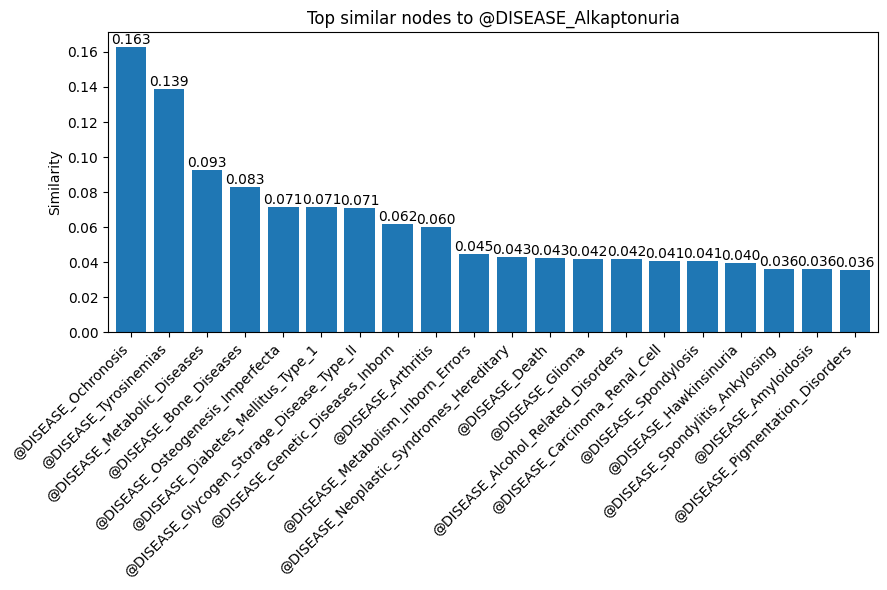

In [350]:
find_sim_di_visual(originalGraph)

### Extend graph

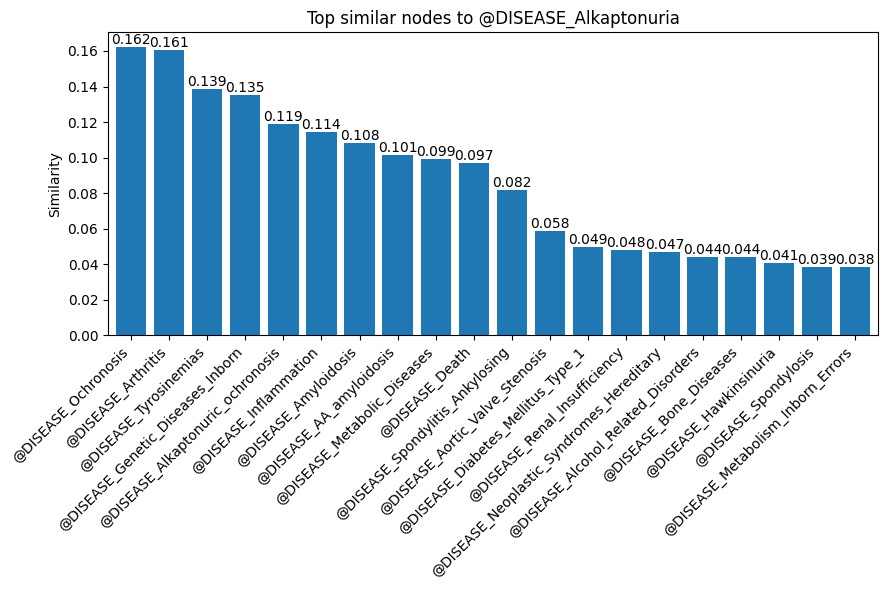

In [347]:
find_sim_di_visual(AlExGraph)

### Filter graph

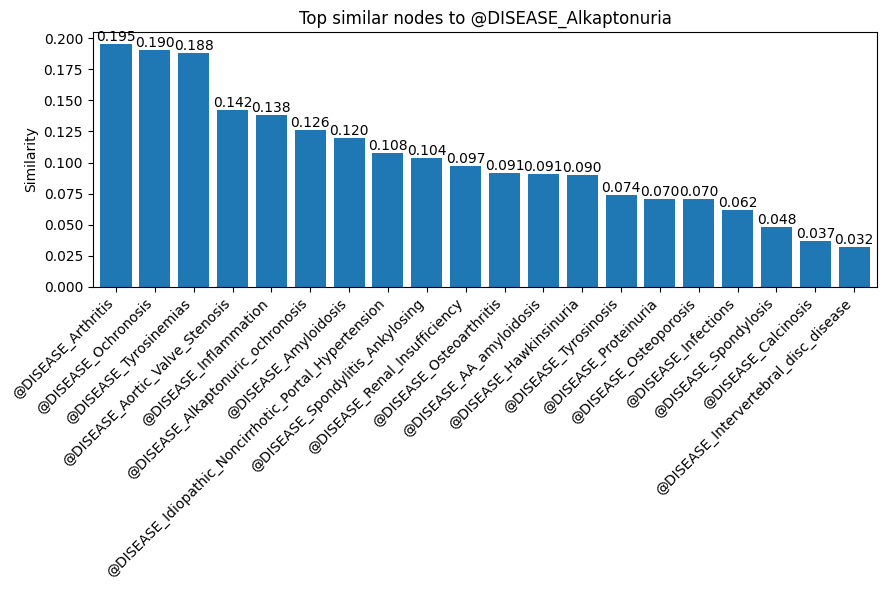

In [439]:
find_sim_di_visual(filteredlv1graph)

### High confident network 

/Users/giangpth/Study/PhD/Repo/Alkaptonuria/alkaptonuria/lib/python3.11/site-packages/matplotlib/transforms.py:2437: RuntimeWarning: invalid value encountered in dot
  return Affine2D(np.dot(self._b.get_affine().get_matrix(),
/Users/giangpth/Study/PhD/Repo/Alkaptonuria/alkaptonuria/lib/python3.11/site-packages/matplotlib/transforms.py:2437: RuntimeWarning: invalid value encountered in dot
  return Affine2D(np.dot(self._b.get_affine().get_matrix(),


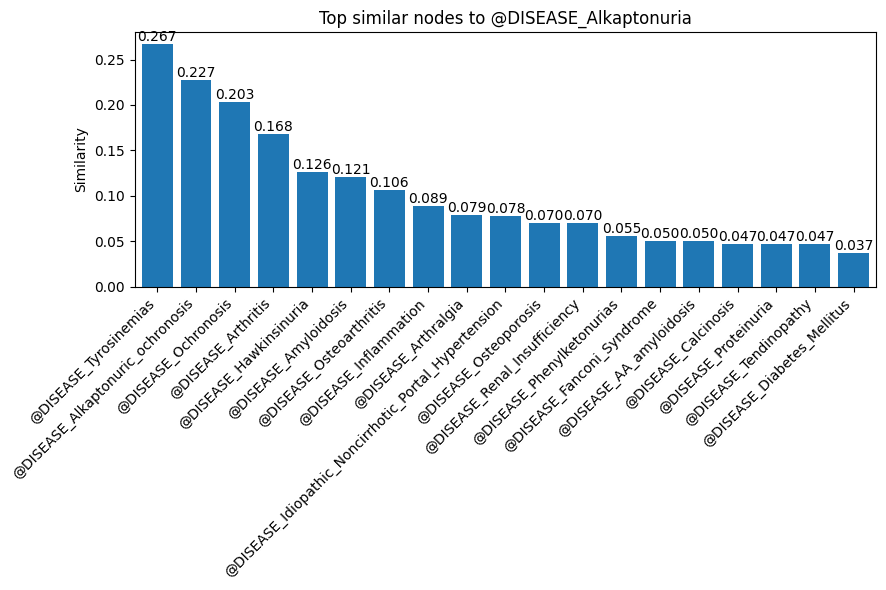

In [440]:
find_sim_di_visual(highconfgraph)

## Chemical similarity 

### Define functions 

In [351]:
import networkx as nx
import scipy.sparse as sp

def build_chemical_similarity(
    G: nx.Graph,
    via=("gene","disease"),               # channels: C–G–C and/or C–D–C
    method=("cosine_tfidf", "pathsim"),   # combine similarity methods
    in_edges=True, out_edges=True,        # respect edge direction if G is directed
    use_weights=False, signed=False,      # use edge['weight'] / edge['sign'] if present
    weights_by_channel=None,              # e.g., {"gene":0.6,"disease":0.4}
    weights_by_method=None,               # e.g., {"cosine_tfidf":0.5,"pathsim":0.5}
    topk=20                               # keep top-k neighbors per chemical (None to skip)
):
    """
    Project a heterogeneous graph into a Chemical–Chemical similarity network.

    Returns:
      Hc (nx.Graph): chemical–chemical weighted similarity graph
      S (scipy.sparse.csr_matrix): similarity matrix aligned to `chemicals` order
      chemicals (list): chemical node order used in S
    """
    # Collect node sets by prefix/type
    chemicals = [n for n in G.nodes if _node_type(n) == "chemical"]
    genes     = [n for n in G.nodes if _node_type(n) == "gene"]
    diseases  = [n for n in G.nodes if _node_type(n) == "disease"]

    if not chemicals:
        raise ValueError("No @CHEMICAL nodes found.")

    # Prune unavailable channels
    via = tuple(via)
    if "gene" in via and not genes:
        via = tuple(x for x in via if x != "gene")
    if "disease" in via and not diseases:
        via = tuple(x for x in via if x != "disease")
    if not via:
        raise ValueError("No projection channels available (no genes/diseases present).")

    # Default weights
    if weights_by_channel is None:
        weights_by_channel = {ch: 1.0/len(via) for ch in via}
    mlist = tuple(method) if isinstance(method, (list, tuple)) else (method,)
    if weights_by_method is None:
        weights_by_method = {m: 1.0/len(mlist) for m in mlist}

    # Build per-channel similarity
    channel_sims = []
    for ch in via:
        if ch == "gene":
            # C x G incidence
            A = _build_incidence(G, chemicals, genes, "gene",
                                 in_edges=in_edges, out_edges=out_edges,
                                 use_weights=use_weights, signed=signed)
        elif ch == "disease":
            # C x D incidence
            A = _build_incidence(G, chemicals, diseases, "disease",
                                 in_edges=in_edges, out_edges=out_edges,
                                 use_weights=use_weights, signed=signed)
        else:
            raise ValueError(f"Unknown channel: {ch}")

        # Methods for this channel
        per_methods = []
        for m in mlist:
            if m == "cosine":
                per_methods.append(_cosine_sim(A, tfidf=False))
            elif m == "cosine_tfidf":
                per_methods.append(_cosine_sim(A, tfidf=True))
            elif m == "pathsim":
                per_methods.append(_pathsim(A))
            elif m == "hypergeom":
                per_methods.append(_hypergeom_overlap(A))
            else:
                raise ValueError(f"Unknown method: {m}")

        # Combine methods within channel
        m_weights = [weights_by_method[m] for m in mlist]
        ch_sim = _combine(per_methods, m_weights).multiply(weights_by_channel[ch])
        channel_sims.append(ch_sim)

    # Combine channels
    S = _combine(channel_sims, None)
    if S is None:
        raise RuntimeError("Failed to build any similarity matrix.")

    # Sparsify (top-k per row) and symmetrize
    S = _topk_per_row(S, topk)
    S = 0.5 * (S + S.T)

    # Build NetworkX graph
    Hc = nx.Graph()
    Hc.add_nodes_from(chemicals)
    rows, cols = S.nonzero()
    for i, j, w in zip(rows, cols, S.data):
        if i < j and w > 0:
            Hc.add_edge(chemicals[i], chemicals[j], weight=float(w))

    return Hc, S.tocsr(), chemicals


In [ ]:
def find_sim_chem_visual(graph, top_n=20):
    Hc, Sc, chemicals = build_chemical_similarity(
    graph,
    via=("gene","disease"),
    method=("cosine_tfidf","pathsim"),
    in_edges=True, out_edges=True,
    use_weights=True, signed=True,
    topk=25
    )
    plot_top_similar_diseases_vertical(
    Sc,
    chemicals,
    focal_name="@CHEMICAL_nitisinone",
    k=top_n,
    min_sim=None,
    exclude_self=True,
    annotate=True,
    figsize=(9, 7),
    save_path=None,
    )
    

### Extend graph 

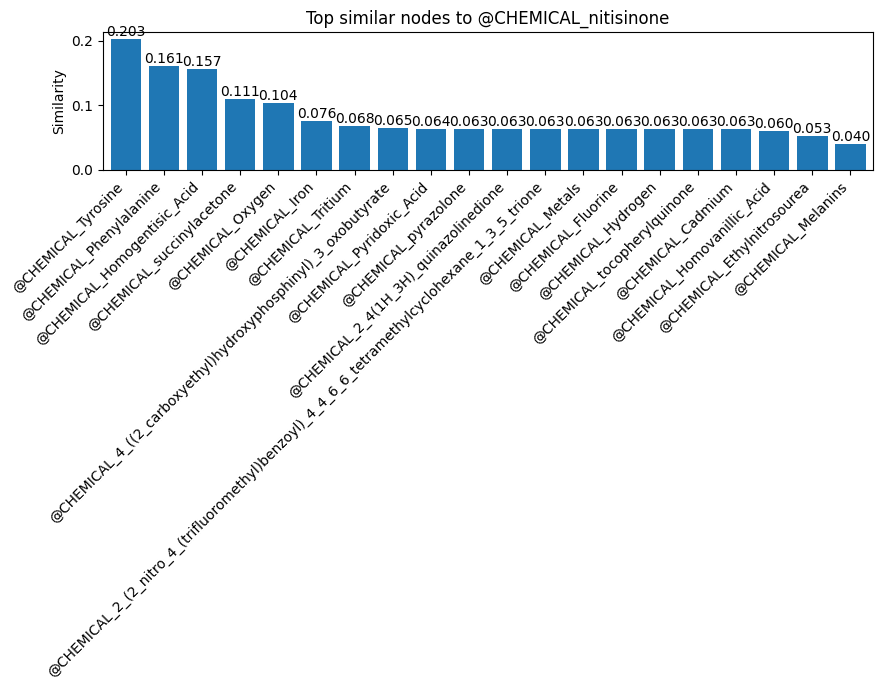

In [357]:
find_sim_chem_visual(AlExGraph)

### Filter graph

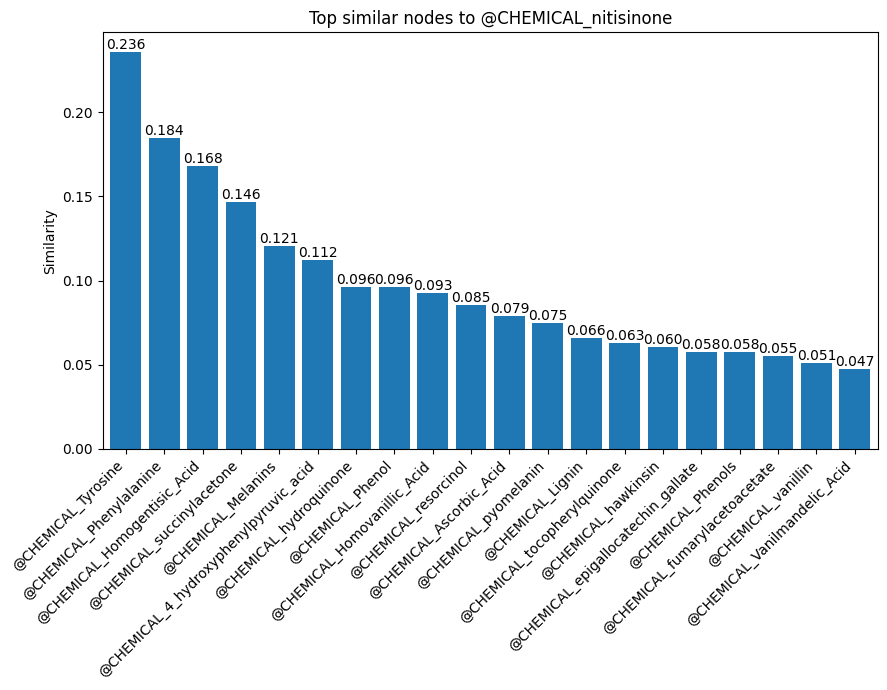

In [442]:
find_sim_chem_visual(filteredlv1graph)

### High confident network 

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 186 stored elements and shape (44, 44)>
  Coords	Values
  (0, 1)	0.03402844642666091
  (0, 2)	0.0546073982496727
  (0, 4)	0.12105686746970482
  (0, 5)	0.043451266585802936
  (0, 6)	0.15945615533985377
  (0, 7)	0.1827177397595691
  (0, 8)	0.10598204939047802
  (0, 9)	0.21026407784704548
  (0, 14)	0.07841986155964997
  (0, 16)	0.0940868116393268
  (0, 17)	0.07710949281739779
  (0, 18)	0.06596200782442273
  (0, 21)	0.044476765903394555
  (0, 32)	0.03710936044729488
  (0, 33)	0.046959101127652614
  (0, 34)	0.049500122837972615
  (0, 38)	0.044476765903394555
  (0, 40)	0.03713790367756028
  (0, 42)	0.05259216882562767
  (0, 43)	0.0436207013590467
  (1, 0)	0.03402844642666091
  (1, 4)	0.08961780566148728
  (1, 7)	0.04257116091620418
  (1, 9)	0.0942510508182405
  (1, 34)	0.14722706192764573
  :	:
  (34, 7)	0.06281999241880565
  (34, 9)	0.14301988150561507
  (38, 0)	0.044476765903394555
  (38, 8)	0.06986414080525263
  (38, 18)	0.1079

/Users/giangpth/Study/PhD/Repo/Alkaptonuria/alkaptonuria/lib/python3.11/site-packages/matplotlib/transforms.py:2437: RuntimeWarning: invalid value encountered in dot
  return Affine2D(np.dot(self._b.get_affine().get_matrix(),
/Users/giangpth/Study/PhD/Repo/Alkaptonuria/alkaptonuria/lib/python3.11/site-packages/matplotlib/transforms.py:2437: RuntimeWarning: invalid value encountered in dot
  return Affine2D(np.dot(self._b.get_affine().get_matrix(),


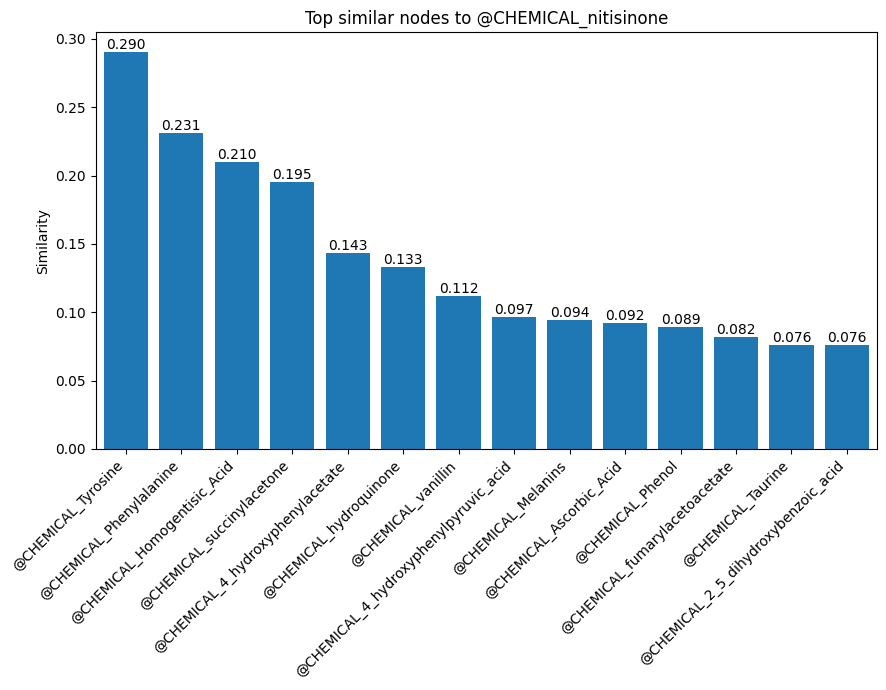

In [445]:
find_sim_chem_visual(highconfgraph)